# Download the dataset and supporting codes and pre-trained models

https://drive.google.com/file/d/1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt/view?usp=drivesdk

https://drive.google.com/file/d/1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu/view?usp=drivesdk

https://drive.google.com/file/d/1so6AQ0_Pg255COjAzEOOVPlDzTJFVQro/view?usp=drivesdk

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import auth
auth.authenticate_user()
from googleapiclient.discovery import build
drive_service = build('drive', 'v3')
import io
import os
from googleapiclient.http import MediaIoBaseDownload
def download_file(fn, file_id):
    request = drive_service.files().get_media(fileId=file_id)
    downloaded = io.BytesIO()
    downloader = MediaIoBaseDownload(downloaded, request)
    done = False
    while done is False:
        # _ is a placeholder for a progress object that we ignore.
        # (Our file is small, so we skip reporting progress.)
        _, done = downloader.next_chunk()
    downloaded.seek(0)
    folder = fn.split('/')
    if len(folder) > 1:
        os.makedirs(folder[0], exist_ok=True)
    with open(fn, 'wb') as f:
        f.write(downloaded.read())
id_to_fn = {
'1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt': 'edges2shoes.zip',
'1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu': 'CycleGAN_support.zip',
}

# download all files into the vm
for fid, fn in id_to_fn.items():
    print("Downloading %s from %s" % (fn, fid))
    download_file(fn, fid)

In [ ]:
! unzip -q edges2shoes.zip
! unzip -q CycleGAN_support.zip

# CycleGAN training

In [ ]:
import torch
import pdb


def loss_discriminator(fakefG, D, real2D, valid, fake, criterion_GAN):
    '''
    loss_discriminator function is applied to compute loss for discriminator D_A and D_B,
    For example, we want to compute loss for D_A. The loss is consisted of two parts: 
    D(real_A) and D(G(real_B)). We want to penalize the distance between D(real_A) part and 1 and 
    distance between D(G(real_B)) part and 0. 
    We will want to first compute discriminator loss given real_A and valid, which is all 1.
    Then we want to forward real_A through G_AB network to get fake image batch 
    and compute discriminator loss given fake batch and fake, which is all 0.
    Finally, add up these two loss as the total discriminator loss.
    '''

    real_loss = criterion_GAN(D(real2D), valid)
    fake_loss = criterion_GAN(D(fakefG.detach()),fake)

    loss_D = real_loss+ fake_loss    

    return loss_D



def loss_generator(G, real2G, D, valid, criterion_GAN):
    '''
    loss_generator function is applied to compute loss for both generator G_AB and G_BA:
    For example, we want to compute the loss for G_AB.
    real2G will be the real image in domain A, then we map real2G into domain B to get fake B,
    then we compute the loss between D_B(fake_B) and valid, which is all 1.
    The fake_B image will also be one of the outputs, since we want to use it in the loss_cycle_consis.
    '''

    fake_o_G = G(real2G)
    loss_G = criterion_GAN(D(fake_o_G),valid)
    
    return loss_G, fake_o_G



def loss_cycle_consis(G, fakefG, real, criterion_cycle):
    '''
    loss_cycle_consis function is applied to both cycle consistency loss:
    between recovered A and original A,
    between recovered B and original B.
    For example, we want to compute the cycle consistency loss between recovered A and original A.
    fake2G will be the generated image in domain B, then we map fake2G back into domain A to get recovered A,
    then we compute the loss between recovered A and original A
    '''

    loss_cycle = criterion_cycle(G(fakefG),real)
    
    return loss_cycle

test case loss_D_A: 3.1760239601135254
computed loss_D_A: 3.1760239601135254
test case test_loss_GAN_AB: 3.164881467819214
computed test_loss_GAN_AB: 3.164881467819214
test case loss_cycle_A: 0.6627261638641357
computed loss_cycle_A: 0.6627261638641357


the length of training data: 49825


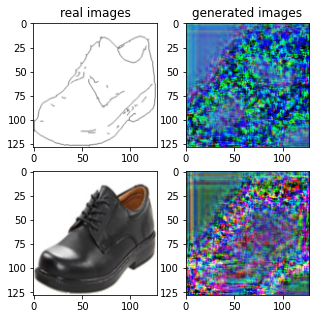

Train Epoch: 1 0% 	Total Loss: 10.861333 	Loss_G_AB: 1.523769	Loss_G_BA: 1.941412	Loss_cycle: 5.795563	Loss_D_A: 1.359541	Loss_D_B: 1.973638
0 9 T:  1.4883713722229004
Train Epoch: 1 0% 	Total Loss: 5.781239 	Loss_G_AB: 1.330179	Loss_G_BA: 1.291547	Loss_cycle: 2.060907	Loss_D_A: 1.200423	Loss_D_B: 1.209046
0 19 T:  0.9738883972167969
Train Epoch: 1 0% 	Total Loss: 4.145183 	Loss_G_AB: 1.004946	Loss_G_BA: 0.808572	Loss_cycle: 1.954307	Loss_D_A: 0.566282	Loss_D_B: 0.717835
0 29 T:  0.9434659481048584
Train Epoch: 1 0% 	Total Loss: 3.611553 	Loss_G_AB: 0.881934	Loss_G_BA: 0.892922	Loss_cycle: 1.481311	Loss_D_A: 0.490460	Loss_D_B: 0.752354
0 39 T:  0.961545467376709
Train Epoch: 1 0% 	Total Loss: 3.386352 	Loss_G_AB: 0.781381	Loss_G_BA: 0.863583	Loss_cycle: 1.666130	Loss_D_A: 0.409593	Loss_D_B: 0.488148
0 49 T:  0.9843401908874512
Train Epoch: 1 0% 	Total Loss: 2.622134 	Loss_G_AB: 0.594069	Loss_G_BA: 0.715345	Loss_cycle: 1.184201	Loss_D_A: 0.451337	Loss_D_B: 0.331889
0 59 T:  0.9895377159

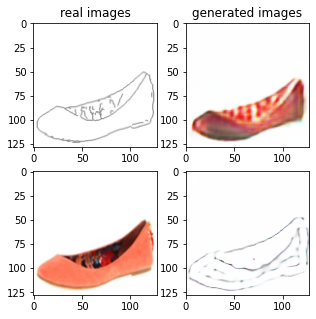

Train Epoch: 1 2% 	Total Loss: 1.774499 	Loss_G_AB: 0.485789	Loss_G_BA: 0.528518	Loss_cycle: 0.807136	Loss_D_A: 0.166098	Loss_D_B: 0.294112
0 1009 T:  1.7536256313323975
Train Epoch: 1 2% 	Total Loss: 1.853352 	Loss_G_AB: 0.350642	Loss_G_BA: 0.764923	Loss_cycle: 0.925335	Loss_D_A: 0.081510	Loss_D_B: 0.288726
0 1019 T:  0.988330602645874
Train Epoch: 1 2% 	Total Loss: 1.786529 	Loss_G_AB: 0.349006	Loss_G_BA: 0.777634	Loss_cycle: 0.848961	Loss_D_A: 0.103819	Loss_D_B: 0.270430
0 1029 T:  0.9833476543426514
Train Epoch: 1 2% 	Total Loss: 1.769098 	Loss_G_AB: 0.376706	Loss_G_BA: 0.675940	Loss_cycle: 0.842191	Loss_D_A: 0.126758	Loss_D_B: 0.273827
0 1039 T:  0.9840028285980225
Train Epoch: 1 2% 	Total Loss: 1.868820 	Loss_G_AB: 0.347320	Loss_G_BA: 0.835857	Loss_cycle: 0.889692	Loss_D_A: 0.142628	Loss_D_B: 0.244911
0 1049 T:  0.9783244132995605
Train Epoch: 1 2% 	Total Loss: 1.813432 	Loss_G_AB: 0.372609	Loss_G_BA: 0.732434	Loss_cycle: 0.855500	Loss_D_A: 0.124065	Loss_D_B: 0.281346
0 1059 T:  

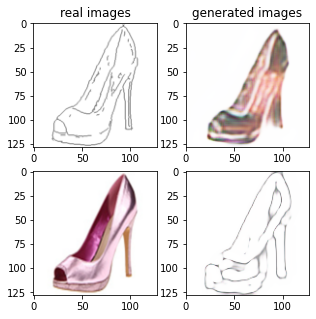

Train Epoch: 1 4% 	Total Loss: 1.951862 	Loss_G_AB: 0.324431	Loss_G_BA: 0.600397	Loss_cycle: 1.070043	Loss_D_A: 0.117378	Loss_D_B: 0.302028
0 2009 T:  1.7123656272888184
Train Epoch: 1 4% 	Total Loss: 1.679174 	Loss_G_AB: 0.376679	Loss_G_BA: 0.652894	Loss_cycle: 0.688674	Loss_D_A: 0.158843	Loss_D_B: 0.316871
0 2019 T:  0.9646143913269043
Train Epoch: 1 4% 	Total Loss: 1.610250 	Loss_G_AB: 0.329601	Loss_G_BA: 0.710892	Loss_cycle: 0.701029	Loss_D_A: 0.086166	Loss_D_B: 0.302808
0 2029 T:  0.9815623760223389
Train Epoch: 1 4% 	Total Loss: 1.859148 	Loss_G_AB: 0.344146	Loss_G_BA: 0.652911	Loss_cycle: 0.889934	Loss_D_A: 0.191346	Loss_D_B: 0.279339
0 2039 T:  0.9696176052093506
Train Epoch: 1 4% 	Total Loss: 1.829039 	Loss_G_AB: 0.321699	Loss_G_BA: 0.650060	Loss_cycle: 0.932553	Loss_D_A: 0.172297	Loss_D_B: 0.238309
0 2049 T:  0.9740705490112305
Train Epoch: 1 4% 	Total Loss: 1.742211 	Loss_G_AB: 0.356601	Loss_G_BA: 0.731943	Loss_cycle: 0.793467	Loss_D_A: 0.143202	Loss_D_B: 0.261271
0 2059 T: 

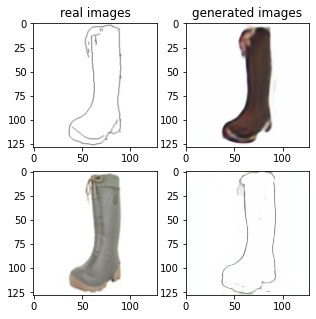

Train Epoch: 1 6% 	Total Loss: 1.638351 	Loss_G_AB: 0.336663	Loss_G_BA: 0.623887	Loss_cycle: 0.789278	Loss_D_A: 0.143925	Loss_D_B: 0.224873
0 3009 T:  1.710935115814209
Train Epoch: 1 6% 	Total Loss: 1.672621 	Loss_G_AB: 0.368573	Loss_G_BA: 0.750793	Loss_cycle: 0.785106	Loss_D_A: 0.089444	Loss_D_B: 0.238388
0 3019 T:  0.9665603637695312
Train Epoch: 1 6% 	Total Loss: 1.763140 	Loss_G_AB: 0.385571	Loss_G_BA: 0.793712	Loss_cycle: 0.791993	Loss_D_A: 0.105017	Loss_D_B: 0.276488
0 3029 T:  0.9740543365478516
Train Epoch: 1 6% 	Total Loss: 1.795106 	Loss_G_AB: 0.300057	Loss_G_BA: 0.978048	Loss_cycle: 0.775181	Loss_D_A: 0.062653	Loss_D_B: 0.318220
0 3039 T:  0.9736390113830566
Train Epoch: 1 6% 	Total Loss: 1.625115 	Loss_G_AB: 0.399986	Loss_G_BA: 0.776495	Loss_cycle: 0.652134	Loss_D_A: 0.116592	Loss_D_B: 0.268149
0 3049 T:  0.9730148315429688
Train Epoch: 1 6% 	Total Loss: 1.628915 	Loss_G_AB: 0.341379	Loss_G_BA: 0.898797	Loss_cycle: 0.720254	Loss_D_A: 0.056071	Loss_D_B: 0.232502
0 3059 T:  

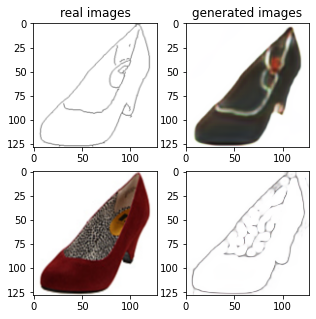

Train Epoch: 1 8% 	Total Loss: 1.831954 	Loss_G_AB: 0.371651	Loss_G_BA: 1.062999	Loss_cycle: 0.819407	Loss_D_A: 0.035566	Loss_D_B: 0.259657
0 4009 T:  1.7248315811157227
Train Epoch: 1 8% 	Total Loss: 1.715816 	Loss_G_AB: 0.365640	Loss_G_BA: 0.840654	Loss_cycle: 0.807868	Loss_D_A: 0.051447	Loss_D_B: 0.253354
0 4019 T:  0.9095964431762695
Train Epoch: 1 8% 	Total Loss: 1.416603 	Loss_G_AB: 0.332886	Loss_G_BA: 0.791178	Loss_cycle: 0.558908	Loss_D_A: 0.054311	Loss_D_B: 0.241352
0 4029 T:  0.9152350425720215
Train Epoch: 1 8% 	Total Loss: 1.604425 	Loss_G_AB: 0.373555	Loss_G_BA: 0.823425	Loss_cycle: 0.726557	Loss_D_A: 0.064846	Loss_D_B: 0.214532
0 4039 T:  0.9130520820617676
Train Epoch: 1 8% 	Total Loss: 1.866412 	Loss_G_AB: 0.368519	Loss_G_BA: 0.875317	Loss_cycle: 0.838920	Loss_D_A: 0.125554	Loss_D_B: 0.280019
0 4049 T:  0.91475510597229
Train Epoch: 1 8% 	Total Loss: 1.641412 	Loss_G_AB: 0.352991	Loss_G_BA: 0.652156	Loss_cycle: 0.650440	Loss_D_A: 0.239911	Loss_D_B: 0.248486
0 4059 T:  0

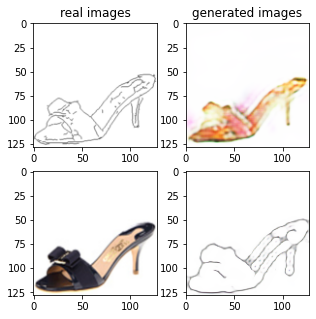

Train Epoch: 1 10% 	Total Loss: 1.778647 	Loss_G_AB: 0.294008	Loss_G_BA: 0.757713	Loss_cycle: 0.893597	Loss_D_A: 0.087035	Loss_D_B: 0.272154
0 5009 T:  1.6962623596191406
Train Epoch: 1 10% 	Total Loss: 1.404915 	Loss_G_AB: 0.341654	Loss_G_BA: 0.753782	Loss_cycle: 0.543762	Loss_D_A: 0.089424	Loss_D_B: 0.224011
0 5019 T:  0.9650311470031738
Train Epoch: 1 10% 	Total Loss: 1.723393 	Loss_G_AB: 0.406270	Loss_G_BA: 0.822700	Loss_cycle: 0.790343	Loss_D_A: 0.068688	Loss_D_B: 0.249877
0 5029 T:  0.9805865287780762
Train Epoch: 1 10% 	Total Loss: 3.040833 	Loss_G_AB: 0.329112	Loss_G_BA: 1.506738	Loss_cycle: 1.505925	Loss_D_A: 0.375332	Loss_D_B: 0.241651
0 5039 T:  0.9674882888793945
Train Epoch: 1 10% 	Total Loss: 1.771817 	Loss_G_AB: 0.348340	Loss_G_BA: 1.013064	Loss_cycle: 0.714438	Loss_D_A: 0.167499	Loss_D_B: 0.209178
0 5049 T:  0.9661402702331543
Train Epoch: 1 10% 	Total Loss: 1.644680 	Loss_G_AB: 0.382198	Loss_G_BA: 0.778569	Loss_cycle: 0.712465	Loss_D_A: 0.102460	Loss_D_B: 0.249372
0 50

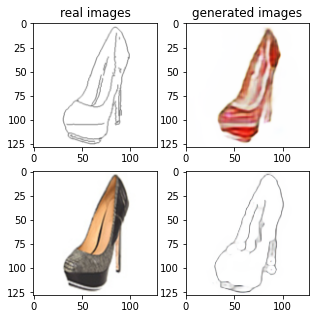

Train Epoch: 1 12% 	Total Loss: 1.623808 	Loss_G_AB: 0.350407	Loss_G_BA: 0.691491	Loss_cycle: 0.751340	Loss_D_A: 0.112693	Loss_D_B: 0.238826
0 6009 T:  1.6880273818969727
Train Epoch: 1 12% 	Total Loss: 1.509573 	Loss_G_AB: 0.347507	Loss_G_BA: 0.566842	Loss_cycle: 0.608872	Loss_D_A: 0.140512	Loss_D_B: 0.303015
0 6019 T:  0.9687659740447998
Train Epoch: 1 12% 	Total Loss: 1.633699 	Loss_G_AB: 0.286954	Loss_G_BA: 0.730617	Loss_cycle: 0.686923	Loss_D_A: 0.169043	Loss_D_B: 0.268947
0 6029 T:  0.9701235294342041
Train Epoch: 1 12% 	Total Loss: 1.550321 	Loss_G_AB: 0.406950	Loss_G_BA: 0.633858	Loss_cycle: 0.600108	Loss_D_A: 0.157804	Loss_D_B: 0.272004
0 6039 T:  0.9650321006774902
Train Epoch: 1 12% 	Total Loss: 1.624224 	Loss_G_AB: 0.311753	Loss_G_BA: 0.721501	Loss_cycle: 0.758024	Loss_D_A: 0.111892	Loss_D_B: 0.237681
0 6049 T:  0.9646880626678467
Train Epoch: 1 12% 	Total Loss: 1.535788 	Loss_G_AB: 0.317027	Loss_G_BA: 0.864947	Loss_cycle: 0.638948	Loss_D_A: 0.057945	Loss_D_B: 0.247908
0 60

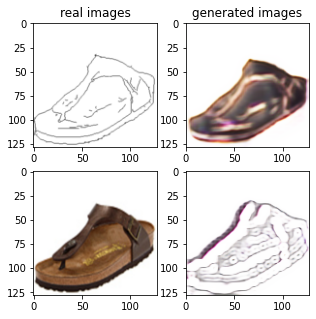

Train Epoch: 1 14% 	Total Loss: 2.032244 	Loss_G_AB: 0.404608	Loss_G_BA: 0.923054	Loss_cycle: 1.143734	Loss_D_A: 0.028380	Loss_D_B: 0.196299
0 7009 T:  1.6823976039886475
Train Epoch: 1 14% 	Total Loss: 2.075865 	Loss_G_AB: 0.434119	Loss_G_BA: 0.934000	Loss_cycle: 1.151033	Loss_D_A: 0.029602	Loss_D_B: 0.211171
0 7019 T:  0.9651706218719482
Train Epoch: 1 14% 	Total Loss: 2.005624 	Loss_G_AB: 0.491094	Loss_G_BA: 1.020316	Loss_cycle: 0.985924	Loss_D_A: 0.018218	Loss_D_B: 0.245777
0 7029 T:  0.9728415012359619
Train Epoch: 1 14% 	Total Loss: 2.077307 	Loss_G_AB: 0.510816	Loss_G_BA: 1.021203	Loss_cycle: 1.081096	Loss_D_A: 0.014710	Loss_D_B: 0.215492
0 7039 T:  0.9682338237762451
Train Epoch: 1 14% 	Total Loss: 1.856379 	Loss_G_AB: 0.444817	Loss_G_BA: 1.023930	Loss_cycle: 0.881727	Loss_D_A: 0.016497	Loss_D_B: 0.223782
0 7049 T:  0.9656245708465576
Train Epoch: 1 14% 	Total Loss: 1.813923 	Loss_G_AB: 0.401742	Loss_G_BA: 0.961590	Loss_cycle: 0.858454	Loss_D_A: 0.016425	Loss_D_B: 0.257377
0 70

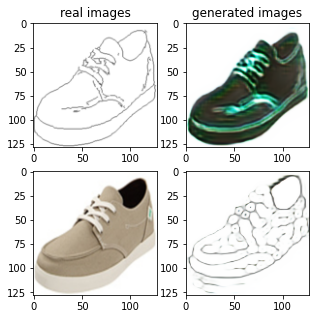

Train Epoch: 1 16% 	Total Loss: 1.580379 	Loss_G_AB: 0.327574	Loss_G_BA: 0.991132	Loss_cycle: 0.637448	Loss_D_A: 0.014646	Loss_D_B: 0.268932
0 8009 T:  1.706833839416504
Train Epoch: 1 16% 	Total Loss: 1.588030 	Loss_G_AB: 0.347435	Loss_G_BA: 0.910189	Loss_cycle: 0.711658	Loss_D_A: 0.014061	Loss_D_B: 0.233500
0 8019 T:  0.9644017219543457
Train Epoch: 1 16% 	Total Loss: 1.516629 	Loss_G_AB: 0.342142	Loss_G_BA: 0.997895	Loss_cycle: 0.602774	Loss_D_A: 0.024352	Loss_D_B: 0.219484
0 8029 T:  0.968024492263794
Train Epoch: 1 16% 	Total Loss: 1.389926 	Loss_G_AB: 0.312078	Loss_G_BA: 0.804705	Loss_cycle: 0.507833	Loss_D_A: 0.082547	Loss_D_B: 0.241154
0 8039 T:  0.9632613658905029
Train Epoch: 1 16% 	Total Loss: 1.579134 	Loss_G_AB: 0.333328	Loss_G_BA: 0.901195	Loss_cycle: 0.672570	Loss_D_A: 0.071471	Loss_D_B: 0.217831
0 8049 T:  0.9654550552368164
Train Epoch: 1 16% 	Total Loss: 1.596418 	Loss_G_AB: 0.328920	Loss_G_BA: 0.781461	Loss_cycle: 0.715105	Loss_D_A: 0.074196	Loss_D_B: 0.251926
0 8059

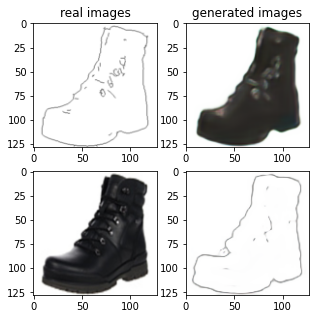

Train Epoch: 1 18% 	Total Loss: 1.448857 	Loss_G_AB: 0.291581	Loss_G_BA: 0.786898	Loss_cycle: 0.580590	Loss_D_A: 0.070831	Loss_D_B: 0.258196
0 9009 T:  1.6671326160430908
Train Epoch: 1 18% 	Total Loss: 1.648574 	Loss_G_AB: 0.331436	Loss_G_BA: 0.983209	Loss_cycle: 0.686684	Loss_D_A: 0.069794	Loss_D_B: 0.234774
0 9019 T:  0.9626278877258301
Train Epoch: 1 18% 	Total Loss: 1.629973 	Loss_G_AB: 0.295532	Loss_G_BA: 0.901031	Loss_cycle: 0.689824	Loss_D_A: 0.071256	Loss_D_B: 0.270611
0 9029 T:  0.9725639820098877
Train Epoch: 1 18% 	Total Loss: 1.506853 	Loss_G_AB: 0.276725	Loss_G_BA: 0.839356	Loss_cycle: 0.652450	Loss_D_A: 0.030522	Loss_D_B: 0.265841
0 9039 T:  0.9662935733795166
Train Epoch: 1 18% 	Total Loss: 1.638427 	Loss_G_AB: 0.337387	Loss_G_BA: 0.989200	Loss_cycle: 0.687454	Loss_D_A: 0.031067	Loss_D_B: 0.256612
0 9049 T:  0.962660551071167
Train Epoch: 1 18% 	Total Loss: 1.699789 	Loss_G_AB: 0.313010	Loss_G_BA: 0.994574	Loss_cycle: 0.748731	Loss_D_A: 0.024815	Loss_D_B: 0.272451
0 905

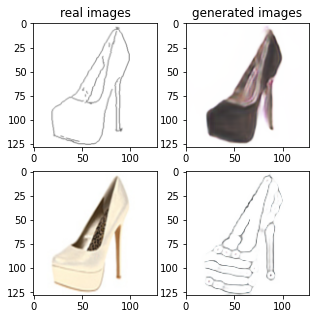

Train Epoch: 1 20% 	Total Loss: 1.497155 	Loss_G_AB: 0.314048	Loss_G_BA: 0.777596	Loss_cycle: 0.606531	Loss_D_A: 0.095833	Loss_D_B: 0.248970
0 10009 T:  1.7207741737365723
Train Epoch: 1 20% 	Total Loss: 1.433462 	Loss_G_AB: 0.291534	Loss_G_BA: 0.697076	Loss_cycle: 0.571767	Loss_D_A: 0.121685	Loss_D_B: 0.245706
0 10019 T:  0.9331197738647461
Train Epoch: 1 20% 	Total Loss: 1.624061 	Loss_G_AB: 0.323391	Loss_G_BA: 0.764526	Loss_cycle: 0.650470	Loss_D_A: 0.190876	Loss_D_B: 0.238756
0 10029 T:  0.934765100479126
Train Epoch: 1 20% 	Total Loss: 1.545874 	Loss_G_AB: 0.298273	Loss_G_BA: 0.897312	Loss_cycle: 0.582514	Loss_D_A: 0.090109	Loss_D_B: 0.275458
0 10039 T:  0.943023681640625
Train Epoch: 1 20% 	Total Loss: 1.641527 	Loss_G_AB: 0.315332	Loss_G_BA: 0.865133	Loss_cycle: 0.761501	Loss_D_A: 0.049864	Loss_D_B: 0.239929
0 10049 T:  0.9338955879211426
Train Epoch: 1 20% 	Total Loss: 1.468351 	Loss_G_AB: 0.370862	Loss_G_BA: 0.869661	Loss_cycle: 0.534548	Loss_D_A: 0.037184	Loss_D_B: 0.276358
0

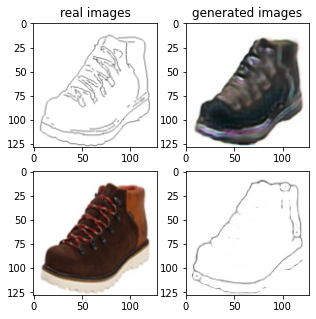

Train Epoch: 1 22% 	Total Loss: 1.546242 	Loss_G_AB: 0.308783	Loss_G_BA: 0.936852	Loss_cycle: 0.660645	Loss_D_A: 0.032329	Loss_D_B: 0.230450
0 11009 T:  1.6921908855438232
Train Epoch: 1 22% 	Total Loss: 1.548409 	Loss_G_AB: 0.266924	Loss_G_BA: 0.950060	Loss_cycle: 0.605638	Loss_D_A: 0.058610	Loss_D_B: 0.275669
0 11019 T:  0.9578261375427246
Train Epoch: 1 22% 	Total Loss: 1.459199 	Loss_G_AB: 0.378571	Loss_G_BA: 0.934133	Loss_cycle: 0.518314	Loss_D_A: 0.023429	Loss_D_B: 0.261104
0 11029 T:  0.9644157886505127
Train Epoch: 1 22% 	Total Loss: 1.409554 	Loss_G_AB: 0.326314	Loss_G_BA: 0.993329	Loss_cycle: 0.509285	Loss_D_A: 0.016797	Loss_D_B: 0.223650
0 11039 T:  0.9671669006347656
Train Epoch: 1 22% 	Total Loss: 1.557128 	Loss_G_AB: 0.310722	Loss_G_BA: 0.923454	Loss_cycle: 0.674516	Loss_D_A: 0.013345	Loss_D_B: 0.252179
0 11049 T:  0.9633049964904785
Train Epoch: 1 22% 	Total Loss: 1.763322 	Loss_G_AB: 0.311050	Loss_G_BA: 1.035310	Loss_cycle: 0.828166	Loss_D_A: 0.011173	Loss_D_B: 0.250803

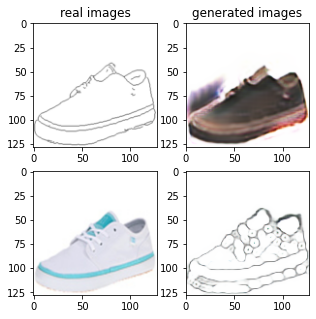

Train Epoch: 1 24% 	Total Loss: 1.599191 	Loss_G_AB: 0.311028	Loss_G_BA: 0.956912	Loss_cycle: 0.709820	Loss_D_A: 0.011749	Loss_D_B: 0.243652
0 12009 T:  1.6619935035705566
Train Epoch: 1 24% 	Total Loss: 1.526291 	Loss_G_AB: 0.295436	Loss_G_BA: 1.004260	Loss_cycle: 0.591647	Loss_D_A: 0.009952	Loss_D_B: 0.274843
0 12019 T:  0.9626142978668213
Train Epoch: 1 24% 	Total Loss: 1.538635 	Loss_G_AB: 0.291616	Loss_G_BA: 1.003539	Loss_cycle: 0.628292	Loss_D_A: 0.011419	Loss_D_B: 0.251347
0 12029 T:  0.9597296714782715
Train Epoch: 1 24% 	Total Loss: 1.392123 	Loss_G_AB: 0.286318	Loss_G_BA: 0.886151	Loss_cycle: 0.546812	Loss_D_A: 0.020141	Loss_D_B: 0.238935
0 12039 T:  0.9411554336547852
Train Epoch: 1 24% 	Total Loss: 1.605686 	Loss_G_AB: 0.310403	Loss_G_BA: 0.969120	Loss_cycle: 0.689136	Loss_D_A: 0.022557	Loss_D_B: 0.254232
0 12049 T:  0.9521446228027344
Train Epoch: 1 24% 	Total Loss: 1.663766 	Loss_G_AB: 0.311635	Loss_G_BA: 1.002325	Loss_cycle: 0.737713	Loss_D_A: 0.037674	Loss_D_B: 0.231400

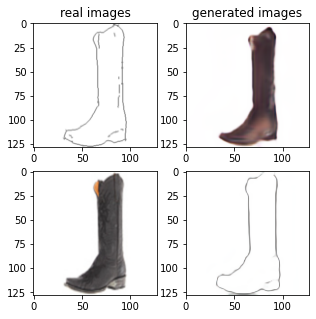

Train Epoch: 1 26% 	Total Loss: 1.405844 	Loss_G_AB: 0.311117	Loss_G_BA: 0.904239	Loss_cycle: 0.526894	Loss_D_A: 0.024043	Loss_D_B: 0.247229
0 13009 T:  1.6614277362823486
Train Epoch: 1 26% 	Total Loss: 1.567634 	Loss_G_AB: 0.315803	Loss_G_BA: 1.006417	Loss_cycle: 0.626570	Loss_D_A: 0.017464	Loss_D_B: 0.262489
0 13019 T:  0.9690899848937988
Train Epoch: 1 26% 	Total Loss: 1.593586 	Loss_G_AB: 0.271550	Loss_G_BA: 1.014559	Loss_cycle: 0.689139	Loss_D_A: 0.012421	Loss_D_B: 0.248971
0 13029 T:  0.9711666107177734
Train Epoch: 1 26% 	Total Loss: 1.501121 	Loss_G_AB: 0.305770	Loss_G_BA: 0.968145	Loss_cycle: 0.599719	Loss_D_A: 0.013331	Loss_D_B: 0.251114
0 13039 T:  0.9749441146850586
Train Epoch: 1 26% 	Total Loss: 1.573477 	Loss_G_AB: 0.294934	Loss_G_BA: 0.986859	Loss_cycle: 0.666388	Loss_D_A: 0.013889	Loss_D_B: 0.252304
0 13049 T:  0.9746909141540527
Train Epoch: 1 26% 	Total Loss: 1.590605 	Loss_G_AB: 0.282152	Loss_G_BA: 1.010092	Loss_cycle: 0.679916	Loss_D_A: 0.009948	Loss_D_B: 0.254619

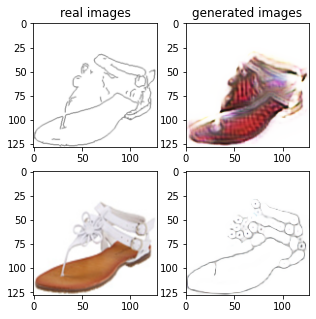

Train Epoch: 1 28% 	Total Loss: 1.665182 	Loss_G_AB: 0.301894	Loss_G_BA: 0.997297	Loss_cycle: 0.722966	Loss_D_A: 0.042255	Loss_D_B: 0.250365
0 14009 T:  1.643169641494751
Train Epoch: 1 28% 	Total Loss: 1.559312 	Loss_G_AB: 0.297042	Loss_G_BA: 0.852327	Loss_cycle: 0.696923	Loss_D_A: 0.058747	Loss_D_B: 0.228957
0 14019 T:  0.9669029712677002
Train Epoch: 1 28% 	Total Loss: 1.613860 	Loss_G_AB: 0.328568	Loss_G_BA: 0.999172	Loss_cycle: 0.694636	Loss_D_A: 0.013400	Loss_D_B: 0.241954
0 14029 T:  0.9735820293426514
Train Epoch: 1 28% 	Total Loss: 1.586054 	Loss_G_AB: 0.295604	Loss_G_BA: 0.929111	Loss_cycle: 0.696742	Loss_D_A: 0.032192	Loss_D_B: 0.244762
0 14039 T:  0.9634826183319092
Train Epoch: 1 28% 	Total Loss: 1.509419 	Loss_G_AB: 0.318742	Loss_G_BA: 0.841518	Loss_cycle: 0.623408	Loss_D_A: 0.067819	Loss_D_B: 0.238062
0 14049 T:  0.9639401435852051
Train Epoch: 1 28% 	Total Loss: 1.552903 	Loss_G_AB: 0.288346	Loss_G_BA: 0.889527	Loss_cycle: 0.654944	Loss_D_A: 0.060086	Loss_D_B: 0.248936


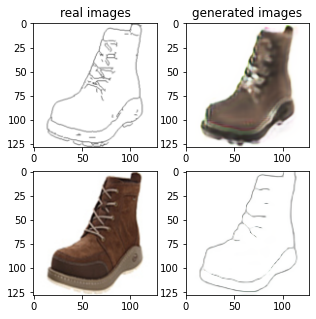

Train Epoch: 1 30% 	Total Loss: 1.576441 	Loss_G_AB: 0.289583	Loss_G_BA: 1.033940	Loss_cycle: 0.674792	Loss_D_A: 0.011556	Loss_D_B: 0.228332
0 15009 T:  1.6699113845825195
Train Epoch: 1 30% 	Total Loss: 1.548689 	Loss_G_AB: 0.306527	Loss_G_BA: 0.887132	Loss_cycle: 0.674234	Loss_D_A: 0.017014	Loss_D_B: 0.260612
0 15019 T:  0.9144763946533203
Train Epoch: 1 30% 	Total Loss: 1.508313 	Loss_G_AB: 0.298415	Loss_G_BA: 0.946909	Loss_cycle: 0.612602	Loss_D_A: 0.038780	Loss_D_B: 0.234269
0 15029 T:  0.9142844676971436
Train Epoch: 1 30% 	Total Loss: 1.474574 	Loss_G_AB: 0.278155	Loss_G_BA: 1.005069	Loss_cycle: 0.555840	Loss_D_A: 0.011764	Loss_D_B: 0.265358
0 15039 T:  0.9138393402099609
Train Epoch: 1 30% 	Total Loss: 1.700006 	Loss_G_AB: 0.260361	Loss_G_BA: 1.054756	Loss_cycle: 0.759265	Loss_D_A: 0.014088	Loss_D_B: 0.269094
0 15049 T:  0.9121787548065186
Train Epoch: 1 30% 	Total Loss: 1.423050 	Loss_G_AB: 0.322694	Loss_G_BA: 0.977170	Loss_cycle: 0.530701	Loss_D_A: 0.012215	Loss_D_B: 0.230202

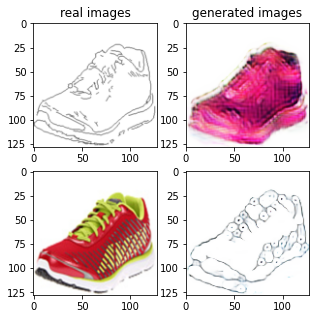

Train Epoch: 1 32% 	Total Loss: 1.687722 	Loss_G_AB: 0.313169	Loss_G_BA: 1.042853	Loss_cycle: 0.718869	Loss_D_A: 0.012890	Loss_D_B: 0.277952
0 16009 T:  1.6620597839355469
Train Epoch: 1 32% 	Total Loss: 1.643852 	Loss_G_AB: 0.318703	Loss_G_BA: 1.050027	Loss_cycle: 0.686176	Loss_D_A: 0.008551	Loss_D_B: 0.264759
0 16019 T:  0.9604287147521973
Train Epoch: 1 32% 	Total Loss: 1.576915 	Loss_G_AB: 0.337577	Loss_G_BA: 1.010960	Loss_cycle: 0.638929	Loss_D_A: 0.010312	Loss_D_B: 0.253406
0 16029 T:  0.9695689678192139
Train Epoch: 1 32% 	Total Loss: 1.446540 	Loss_G_AB: 0.322745	Loss_G_BA: 0.991213	Loss_cycle: 0.562552	Loss_D_A: 0.007942	Loss_D_B: 0.219068
0 16039 T:  0.9645285606384277
Train Epoch: 1 32% 	Total Loss: 1.651582 	Loss_G_AB: 0.335096	Loss_G_BA: 0.973467	Loss_cycle: 0.727612	Loss_D_A: 0.006201	Loss_D_B: 0.263488
0 16049 T:  0.966597318649292
Train Epoch: 1 32% 	Total Loss: 1.540110 	Loss_G_AB: 0.346971	Loss_G_BA: 0.933850	Loss_cycle: 0.590856	Loss_D_A: 0.033901	Loss_D_B: 0.274942


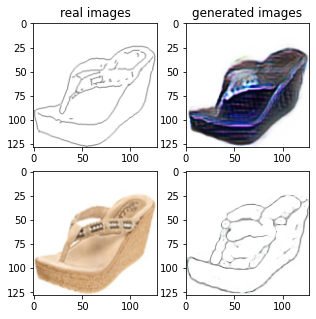

Train Epoch: 1 34% 	Total Loss: 1.610617 	Loss_G_AB: 0.303968	Loss_G_BA: 0.823190	Loss_cycle: 0.749593	Loss_D_A: 0.052300	Loss_D_B: 0.245145
0 17009 T:  1.6096088886260986
Train Epoch: 1 34% 	Total Loss: 1.471328 	Loss_G_AB: 0.307726	Loss_G_BA: 1.054215	Loss_cycle: 0.497950	Loss_D_A: 0.044621	Loss_D_B: 0.247787
0 17019 T:  0.9615898132324219
Train Epoch: 1 34% 	Total Loss: 1.547141 	Loss_G_AB: 0.355096	Loss_G_BA: 0.858787	Loss_cycle: 0.668372	Loss_D_A: 0.032466	Loss_D_B: 0.239361
0 17029 T:  0.9594805240631104
Train Epoch: 1 34% 	Total Loss: 1.510765 	Loss_G_AB: 0.348839	Loss_G_BA: 0.937984	Loss_cycle: 0.621664	Loss_D_A: 0.019650	Loss_D_B: 0.226040
0 17039 T:  0.968360424041748
Train Epoch: 1 34% 	Total Loss: 1.842597 	Loss_G_AB: 0.290420	Loss_G_BA: 1.015939	Loss_cycle: 0.863986	Loss_D_A: 0.046811	Loss_D_B: 0.278621
0 17049 T:  0.9577023983001709
Train Epoch: 1 34% 	Total Loss: 1.383800 	Loss_G_AB: 0.294899	Loss_G_BA: 0.775871	Loss_cycle: 0.533770	Loss_D_A: 0.084899	Loss_D_B: 0.229746


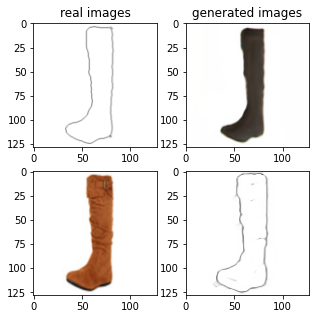

Train Epoch: 1 36% 	Total Loss: 1.357493 	Loss_G_AB: 0.352532	Loss_G_BA: 0.894813	Loss_cycle: 0.461139	Loss_D_A: 0.023601	Loss_D_B: 0.249080
0 18009 T:  1.6378047466278076
Train Epoch: 1 36% 	Total Loss: 1.522310 	Loss_G_AB: 0.326257	Loss_G_BA: 0.920150	Loss_cycle: 0.564271	Loss_D_A: 0.042937	Loss_D_B: 0.291898
0 18019 T:  0.9595284461975098
Train Epoch: 1 36% 	Total Loss: 1.509142 	Loss_G_AB: 0.315566	Loss_G_BA: 1.015297	Loss_cycle: 0.592178	Loss_D_A: 0.019689	Loss_D_B: 0.231844
0 18029 T:  0.9641921520233154
Train Epoch: 1 36% 	Total Loss: 1.607140 	Loss_G_AB: 0.368199	Loss_G_BA: 1.013804	Loss_cycle: 0.662392	Loss_D_A: 0.013328	Loss_D_B: 0.240419
0 18039 T:  0.9558653831481934
Train Epoch: 1 36% 	Total Loss: 1.565067 	Loss_G_AB: 0.287007	Loss_G_BA: 1.004126	Loss_cycle: 0.632363	Loss_D_A: 0.011723	Loss_D_B: 0.275415
0 18049 T:  0.9586114883422852
Train Epoch: 1 36% 	Total Loss: 1.604398 	Loss_G_AB: 0.335751	Loss_G_BA: 0.964958	Loss_cycle: 0.698573	Loss_D_A: 0.018581	Loss_D_B: 0.236889

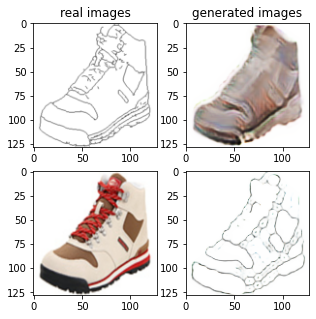

Train Epoch: 1 38% 	Total Loss: 1.459978 	Loss_G_AB: 0.310433	Loss_G_BA: 0.987681	Loss_cycle: 0.575221	Loss_D_A: 0.004626	Loss_D_B: 0.231074
0 19009 T:  1.6493871212005615
Train Epoch: 1 38% 	Total Loss: 1.388380 	Loss_G_AB: 0.303097	Loss_G_BA: 0.985233	Loss_cycle: 0.478428	Loss_D_A: 0.005018	Loss_D_B: 0.260768
0 19019 T:  0.9592685699462891
Train Epoch: 1 38% 	Total Loss: 1.522385 	Loss_G_AB: 0.292466	Loss_G_BA: 0.994999	Loss_cycle: 0.608989	Loss_D_A: 0.004408	Loss_D_B: 0.265256
0 19029 T:  0.9523420333862305
Train Epoch: 1 38% 	Total Loss: 1.533419 	Loss_G_AB: 0.334945	Loss_G_BA: 0.996993	Loss_cycle: 0.613859	Loss_D_A: 0.005381	Loss_D_B: 0.248211
0 19039 T:  0.9527931213378906
Train Epoch: 1 38% 	Total Loss: 1.386334 	Loss_G_AB: 0.297750	Loss_G_BA: 0.987436	Loss_cycle: 0.487054	Loss_D_A: 0.004700	Loss_D_B: 0.251988
0 19049 T:  0.9687814712524414
Train Epoch: 1 38% 	Total Loss: 1.456314 	Loss_G_AB: 0.303264	Loss_G_BA: 1.004378	Loss_cycle: 0.557051	Loss_D_A: 0.005941	Loss_D_B: 0.239501

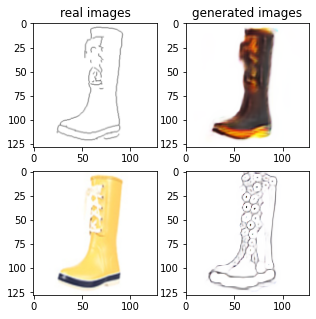

Train Epoch: 1 40% 	Total Loss: 1.578003 	Loss_G_AB: 0.334802	Loss_G_BA: 0.656358	Loss_cycle: 0.624258	Loss_D_A: 0.200116	Loss_D_B: 0.258049
0 20009 T:  1.5984516143798828
Train Epoch: 1 40% 	Total Loss: 1.373720 	Loss_G_AB: 0.348920	Loss_G_BA: 0.552839	Loss_cycle: 0.584022	Loss_D_A: 0.107373	Loss_D_B: 0.231446
0 20019 T:  0.9634609222412109
Train Epoch: 1 40% 	Total Loss: 1.616299 	Loss_G_AB: 0.295974	Loss_G_BA: 0.673357	Loss_cycle: 0.727049	Loss_D_A: 0.131539	Loss_D_B: 0.273045
0 20029 T:  0.9542236328125
Train Epoch: 1 40% 	Total Loss: 1.563856 	Loss_G_AB: 0.316875	Loss_G_BA: 0.535323	Loss_cycle: 0.682866	Loss_D_A: 0.218175	Loss_D_B: 0.236715
0 20039 T:  0.9638240337371826
Train Epoch: 1 40% 	Total Loss: 1.693026 	Loss_G_AB: 0.315561	Loss_G_BA: 0.723395	Loss_cycle: 0.804557	Loss_D_A: 0.140912	Loss_D_B: 0.228079
0 20049 T:  0.9579155445098877
Train Epoch: 1 40% 	Total Loss: 1.459278 	Loss_G_AB: 0.352066	Loss_G_BA: 0.605526	Loss_cycle: 0.577765	Loss_D_A: 0.127946	Loss_D_B: 0.274771
0 

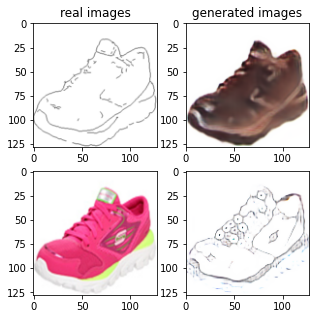

Train Epoch: 1 42% 	Total Loss: 1.529655 	Loss_G_AB: 0.352097	Loss_G_BA: 0.943355	Loss_cycle: 0.583813	Loss_D_A: 0.057233	Loss_D_B: 0.240883
0 21009 T:  1.6491730213165283
Train Epoch: 1 42% 	Total Loss: 1.439592 	Loss_G_AB: 0.283263	Loss_G_BA: 0.974562	Loss_cycle: 0.544006	Loss_D_A: 0.012730	Loss_D_B: 0.253943
0 21019 T:  0.9126605987548828
Train Epoch: 1 42% 	Total Loss: 1.503007 	Loss_G_AB: 0.301312	Loss_G_BA: 0.978926	Loss_cycle: 0.602947	Loss_D_A: 0.008995	Loss_D_B: 0.250947
0 21029 T:  0.9084522724151611
Train Epoch: 1 42% 	Total Loss: 1.441581 	Loss_G_AB: 0.284925	Loss_G_BA: 0.978160	Loss_cycle: 0.524569	Loss_D_A: 0.017242	Loss_D_B: 0.268227
0 21039 T:  0.9068925380706787
Train Epoch: 1 42% 	Total Loss: 1.373431 	Loss_G_AB: 0.325116	Loss_G_BA: 0.886347	Loss_cycle: 0.515661	Loss_D_A: 0.029556	Loss_D_B: 0.222483
0 21049 T:  0.9105751514434814
Train Epoch: 1 42% 	Total Loss: 1.437156 	Loss_G_AB: 0.324886	Loss_G_BA: 0.969838	Loss_cycle: 0.510162	Loss_D_A: 0.041842	Loss_D_B: 0.237790

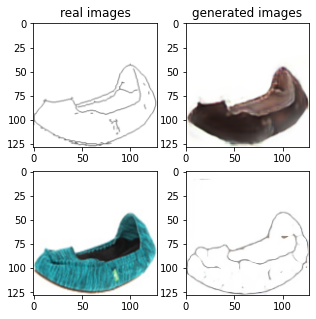

Train Epoch: 1 44% 	Total Loss: 1.417347 	Loss_G_AB: 0.287639	Loss_G_BA: 0.960779	Loss_cycle: 0.513817	Loss_D_A: 0.027972	Loss_D_B: 0.251349
0 22009 T:  1.5975680351257324
Train Epoch: 1 44% 	Total Loss: 1.333848 	Loss_G_AB: 0.339402	Loss_G_BA: 0.940770	Loss_cycle: 0.460374	Loss_D_A: 0.018544	Loss_D_B: 0.214844
0 22019 T:  0.951740026473999
Train Epoch: 1 44% 	Total Loss: 1.455999 	Loss_G_AB: 0.331542	Loss_G_BA: 0.871338	Loss_cycle: 0.577064	Loss_D_A: 0.020043	Loss_D_B: 0.257452
0 22029 T:  0.9627041816711426
Train Epoch: 1 44% 	Total Loss: 1.525248 	Loss_G_AB: 0.288664	Loss_G_BA: 0.966822	Loss_cycle: 0.621155	Loss_D_A: 0.018544	Loss_D_B: 0.257806
0 22039 T:  0.9506123065948486
Train Epoch: 1 44% 	Total Loss: 1.448226 	Loss_G_AB: 0.347807	Loss_G_BA: 1.032201	Loss_cycle: 0.515467	Loss_D_A: 0.015570	Loss_D_B: 0.227185
0 22049 T:  0.9500548839569092
Train Epoch: 1 44% 	Total Loss: 1.568388 	Loss_G_AB: 0.327251	Loss_G_BA: 1.005428	Loss_cycle: 0.681886	Loss_D_A: 0.007284	Loss_D_B: 0.212878


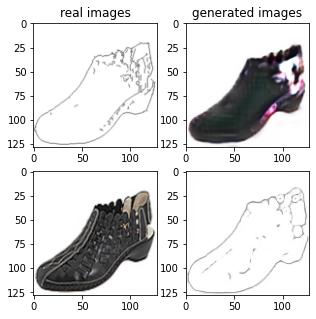

Train Epoch: 1 46% 	Total Loss: 1.475088 	Loss_G_AB: 0.279008	Loss_G_BA: 0.930658	Loss_cycle: 0.577400	Loss_D_A: 0.045682	Loss_D_B: 0.247174
0 23009 T:  1.6210410594940186
Train Epoch: 1 46% 	Total Loss: 1.489897 	Loss_G_AB: 0.288873	Loss_G_BA: 0.940603	Loss_cycle: 0.599375	Loss_D_A: 0.026766	Loss_D_B: 0.249018
0 23019 T:  0.9516088962554932
Train Epoch: 1 46% 	Total Loss: 1.375163 	Loss_G_AB: 0.287054	Loss_G_BA: 0.957233	Loss_cycle: 0.456697	Loss_D_A: 0.050739	Loss_D_B: 0.245584
0 23029 T:  0.9537339210510254
Train Epoch: 1 46% 	Total Loss: 1.482181 	Loss_G_AB: 0.296083	Loss_G_BA: 0.953934	Loss_cycle: 0.574161	Loss_D_A: 0.032306	Loss_D_B: 0.250705
0 23039 T:  0.9485306739807129
Train Epoch: 1 46% 	Total Loss: 1.525475 	Loss_G_AB: 0.290245	Loss_G_BA: 1.003950	Loss_cycle: 0.640921	Loss_D_A: 0.007904	Loss_D_B: 0.229552
0 23049 T:  0.9603133201599121
Train Epoch: 1 46% 	Total Loss: 1.284846 	Loss_G_AB: 0.306899	Loss_G_BA: 0.550109	Loss_cycle: 0.497673	Loss_D_A: 0.131469	Loss_D_B: 0.227200

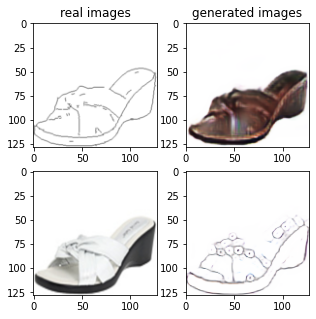

Train Epoch: 1 48% 	Total Loss: 1.222080 	Loss_G_AB: 0.319185	Loss_G_BA: 0.998376	Loss_cycle: 0.336631	Loss_D_A: 0.004586	Loss_D_B: 0.222083
0 24009 T:  1.592315912246704
Train Epoch: 1 48% 	Total Loss: 1.332728 	Loss_G_AB: 0.288418	Loss_G_BA: 0.994253	Loss_cycle: 0.423085	Loss_D_A: 0.005392	Loss_D_B: 0.262915
0 24019 T:  0.9525501728057861
Train Epoch: 1 48% 	Total Loss: 1.385751 	Loss_G_AB: 0.275339	Loss_G_BA: 0.979384	Loss_cycle: 0.479563	Loss_D_A: 0.007440	Loss_D_B: 0.271385
0 24029 T:  0.9641704559326172
Train Epoch: 1 48% 	Total Loss: 1.363177 	Loss_G_AB: 0.292463	Loss_G_BA: 0.968989	Loss_cycle: 0.475429	Loss_D_A: 0.006854	Loss_D_B: 0.250168
0 24039 T:  0.9566230773925781
Train Epoch: 1 48% 	Total Loss: 1.545045 	Loss_G_AB: 0.287544	Loss_G_BA: 0.978984	Loss_cycle: 0.647513	Loss_D_A: 0.004956	Loss_D_B: 0.259312
0 24049 T:  0.9520125389099121
Train Epoch: 1 48% 	Total Loss: 1.419005 	Loss_G_AB: 0.333145	Loss_G_BA: 0.997260	Loss_cycle: 0.494691	Loss_D_A: 0.011613	Loss_D_B: 0.247498


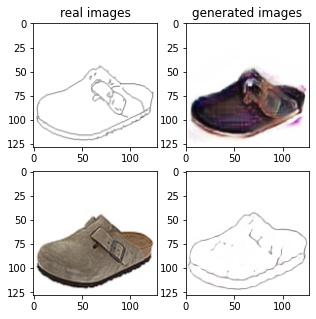

Train Epoch: 1 50% 	Total Loss: 1.342728 	Loss_G_AB: 0.286031	Loss_G_BA: 1.002488	Loss_cycle: 0.428085	Loss_D_A: 0.004369	Loss_D_B: 0.266015
0 25009 T:  1.6073646545410156
Train Epoch: 1 50% 	Total Loss: 1.354007 	Loss_G_AB: 0.336522	Loss_G_BA: 1.025178	Loss_cycle: 0.431115	Loss_D_A: 0.007971	Loss_D_B: 0.234072
0 25019 T:  0.9600393772125244
Train Epoch: 1 50% 	Total Loss: 1.429591 	Loss_G_AB: 0.392699	Loss_G_BA: 1.005724	Loss_cycle: 0.494124	Loss_D_A: 0.004208	Loss_D_B: 0.232048
0 25029 T:  0.9585094451904297
Train Epoch: 1 50% 	Total Loss: 1.340135 	Loss_G_AB: 0.311019	Loss_G_BA: 0.977684	Loss_cycle: 0.450550	Loss_D_A: 0.003691	Loss_D_B: 0.241542
0 25039 T:  0.9606099128723145
Train Epoch: 1 50% 	Total Loss: 1.399689 	Loss_G_AB: 0.325253	Loss_G_BA: 0.985338	Loss_cycle: 0.510744	Loss_D_A: 0.005338	Loss_D_B: 0.228311
0 25049 T:  0.9496212005615234
Train Epoch: 1 50% 	Total Loss: 1.390242 	Loss_G_AB: 0.288877	Loss_G_BA: 0.993493	Loss_cycle: 0.491572	Loss_D_A: 0.008016	Loss_D_B: 0.249469

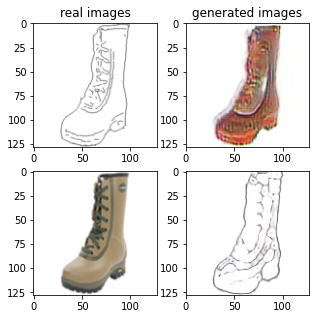

Train Epoch: 1 52% 	Total Loss: 1.309161 	Loss_G_AB: 0.310993	Loss_G_BA: 0.998781	Loss_cycle: 0.408697	Loss_D_A: 0.005967	Loss_D_B: 0.239610
0 26009 T:  1.6877846717834473
Train Epoch: 1 52% 	Total Loss: 1.333235 	Loss_G_AB: 0.303766	Loss_G_BA: 0.953563	Loss_cycle: 0.455567	Loss_D_A: 0.008369	Loss_D_B: 0.240635
0 26019 T:  0.9289917945861816
Train Epoch: 1 52% 	Total Loss: 1.472901 	Loss_G_AB: 0.331441	Loss_G_BA: 1.002614	Loss_cycle: 0.553009	Loss_D_A: 0.009256	Loss_D_B: 0.243610
0 26029 T:  0.9320986270904541
Train Epoch: 1 52% 	Total Loss: 1.491360 	Loss_G_AB: 0.336116	Loss_G_BA: 0.960647	Loss_cycle: 0.566211	Loss_D_A: 0.010713	Loss_D_B: 0.266055
0 26039 T:  0.932945966720581
Train Epoch: 1 52% 	Total Loss: 1.427651 	Loss_G_AB: 0.386509	Loss_G_BA: 0.930470	Loss_cycle: 0.499412	Loss_D_A: 0.017426	Loss_D_B: 0.252323
0 26049 T:  0.9339666366577148
Train Epoch: 1 52% 	Total Loss: 1.552499 	Loss_G_AB: 0.315766	Loss_G_BA: 0.999537	Loss_cycle: 0.645571	Loss_D_A: 0.011059	Loss_D_B: 0.238218


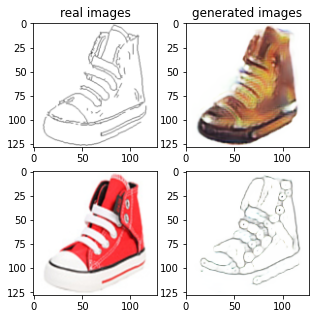

Train Epoch: 1 54% 	Total Loss: 1.534356 	Loss_G_AB: 0.374746	Loss_G_BA: 0.993121	Loss_cycle: 0.615804	Loss_D_A: 0.002666	Loss_D_B: 0.231953
0 27009 T:  1.5913727283477783
Train Epoch: 1 54% 	Total Loss: 1.349836 	Loss_G_AB: 0.280371	Loss_G_BA: 1.001754	Loss_cycle: 0.432235	Loss_D_A: 0.004240	Loss_D_B: 0.272298
0 27019 T:  0.9525418281555176
Train Epoch: 1 54% 	Total Loss: 1.375667 	Loss_G_AB: 0.282716	Loss_G_BA: 0.994614	Loss_cycle: 0.496318	Loss_D_A: 0.004266	Loss_D_B: 0.236418
0 27029 T:  0.9591705799102783
Train Epoch: 1 54% 	Total Loss: 1.394594 	Loss_G_AB: 0.299625	Loss_G_BA: 0.981460	Loss_cycle: 0.516827	Loss_D_A: 0.003646	Loss_D_B: 0.233578
0 27039 T:  0.9601147174835205
Train Epoch: 1 54% 	Total Loss: 1.351414 	Loss_G_AB: 0.312465	Loss_G_BA: 0.990778	Loss_cycle: 0.449228	Loss_D_A: 0.006106	Loss_D_B: 0.244459
0 27049 T:  0.9564206600189209
Train Epoch: 1 54% 	Total Loss: 1.384684 	Loss_G_AB: 0.305776	Loss_G_BA: 0.955456	Loss_cycle: 0.492388	Loss_D_A: 0.009418	Loss_D_B: 0.252261

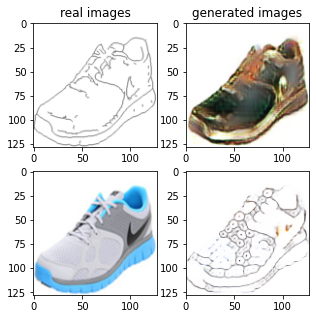

Train Epoch: 1 56% 	Total Loss: 1.493503 	Loss_G_AB: 0.337925	Loss_G_BA: 0.955310	Loss_cycle: 0.582839	Loss_D_A: 0.008486	Loss_D_B: 0.255561
0 28009 T:  1.6216001510620117
Train Epoch: 1 56% 	Total Loss: 1.609557 	Loss_G_AB: 0.347863	Loss_G_BA: 1.003083	Loss_cycle: 0.660779	Loss_D_A: 0.025414	Loss_D_B: 0.247892
0 28019 T:  0.9686763286590576
Train Epoch: 1 56% 	Total Loss: 1.369219 	Loss_G_AB: 0.266409	Loss_G_BA: 1.017471	Loss_cycle: 0.443413	Loss_D_A: 0.007231	Loss_D_B: 0.276634
0 28029 T:  0.9625484943389893
Train Epoch: 1 56% 	Total Loss: 1.442826 	Loss_G_AB: 0.321406	Loss_G_BA: 0.984186	Loss_cycle: 0.556426	Loss_D_A: 0.010110	Loss_D_B: 0.223494
0 28039 T:  0.9570398330688477
Train Epoch: 1 56% 	Total Loss: 1.408438 	Loss_G_AB: 0.379484	Loss_G_BA: 0.975956	Loss_cycle: 0.486899	Loss_D_A: 0.008279	Loss_D_B: 0.235541
0 28049 T:  0.9562907218933105
Train Epoch: 1 56% 	Total Loss: 1.525498 	Loss_G_AB: 0.331467	Loss_G_BA: 0.990862	Loss_cycle: 0.557471	Loss_D_A: 0.020708	Loss_D_B: 0.286156

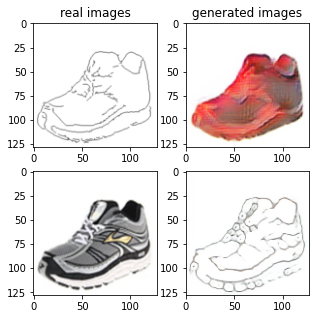

Train Epoch: 1 58% 	Total Loss: 1.370391 	Loss_G_AB: 0.309008	Loss_G_BA: 1.002332	Loss_cycle: 0.459904	Loss_D_A: 0.011372	Loss_D_B: 0.243445
0 29009 T:  1.6149818897247314
Train Epoch: 1 58% 	Total Loss: 1.498723 	Loss_G_AB: 0.318391	Loss_G_BA: 0.940368	Loss_cycle: 0.604858	Loss_D_A: 0.009791	Loss_D_B: 0.254694
0 29019 T:  0.9567368030548096
Train Epoch: 1 58% 	Total Loss: 1.398660 	Loss_G_AB: 0.283410	Loss_G_BA: 1.015410	Loss_cycle: 0.496520	Loss_D_A: 0.005601	Loss_D_B: 0.247128
0 29029 T:  0.9598746299743652
Train Epoch: 1 58% 	Total Loss: 1.351702 	Loss_G_AB: 0.287313	Loss_G_BA: 0.977256	Loss_cycle: 0.476772	Loss_D_A: 0.003534	Loss_D_B: 0.239112
0 29039 T:  0.9631893634796143
Train Epoch: 1 58% 	Total Loss: 1.425682 	Loss_G_AB: 0.273927	Loss_G_BA: 1.019659	Loss_cycle: 0.528205	Loss_D_A: 0.004500	Loss_D_B: 0.246184
0 29049 T:  0.9595305919647217
Train Epoch: 1 58% 	Total Loss: 1.450162 	Loss_G_AB: 0.291301	Loss_G_BA: 0.977784	Loss_cycle: 0.553473	Loss_D_A: 0.004388	Loss_D_B: 0.257758

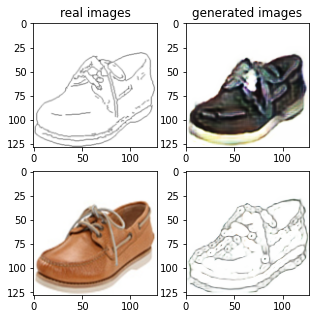

Train Epoch: 1 60% 	Total Loss: 1.319510 	Loss_G_AB: 0.274915	Loss_G_BA: 0.908644	Loss_cycle: 0.439871	Loss_D_A: 0.031070	Loss_D_B: 0.256789
0 30009 T:  1.6136536598205566
Train Epoch: 1 60% 	Total Loss: 1.407264 	Loss_G_AB: 0.291866	Loss_G_BA: 0.709970	Loss_cycle: 0.465925	Loss_D_A: 0.208583	Loss_D_B: 0.231838
0 30019 T:  0.9595091342926025
Train Epoch: 1 60% 	Total Loss: 1.315626 	Loss_G_AB: 0.324124	Loss_G_BA: 0.816416	Loss_cycle: 0.478353	Loss_D_A: 0.062143	Loss_D_B: 0.204860
0 30029 T:  0.9605059623718262
Train Epoch: 1 60% 	Total Loss: 1.503296 	Loss_G_AB: 0.284753	Loss_G_BA: 1.024195	Loss_cycle: 0.549177	Loss_D_A: 0.018588	Loss_D_B: 0.281057
0 30039 T:  0.9585309028625488
Train Epoch: 1 60% 	Total Loss: 1.532869 	Loss_G_AB: 0.271785	Loss_G_BA: 0.977648	Loss_cycle: 0.603012	Loss_D_A: 0.035899	Loss_D_B: 0.269241
0 30049 T:  0.952507734298706
Train Epoch: 1 60% 	Total Loss: 1.359190 	Loss_G_AB: 0.300602	Loss_G_BA: 0.897682	Loss_cycle: 0.443434	Loss_D_A: 0.058865	Loss_D_B: 0.257748


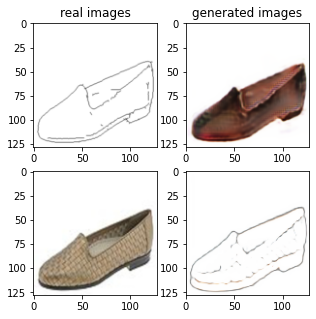

Train Epoch: 1 62% 	Total Loss: 1.474606 	Loss_G_AB: 0.324359	Loss_G_BA: 0.914668	Loss_cycle: 0.546425	Loss_D_A: 0.068793	Loss_D_B: 0.239875
0 31009 T:  1.6267130374908447
Train Epoch: 1 62% 	Total Loss: 1.363496 	Loss_G_AB: 0.299620	Loss_G_BA: 0.816400	Loss_cycle: 0.535759	Loss_D_A: 0.038509	Loss_D_B: 0.231219
0 31019 T:  0.9584465026855469
Train Epoch: 1 62% 	Total Loss: 1.357296 	Loss_G_AB: 0.292106	Loss_G_BA: 0.996521	Loss_cycle: 0.428021	Loss_D_A: 0.042730	Loss_D_B: 0.242231
0 31029 T:  0.9605503082275391
Train Epoch: 1 62% 	Total Loss: 1.286312 	Loss_G_AB: 0.321203	Loss_G_BA: 0.931449	Loss_cycle: 0.400436	Loss_D_A: 0.017987	Loss_D_B: 0.241563
0 31039 T:  0.9581496715545654
Train Epoch: 1 62% 	Total Loss: 1.292332 	Loss_G_AB: 0.331759	Loss_G_BA: 1.001911	Loss_cycle: 0.384016	Loss_D_A: 0.007802	Loss_D_B: 0.233678
0 31049 T:  0.961862325668335
Train Epoch: 1 62% 	Total Loss: 1.402174 	Loss_G_AB: 0.272498	Loss_G_BA: 0.962439	Loss_cycle: 0.531753	Loss_D_A: 0.007968	Loss_D_B: 0.244984


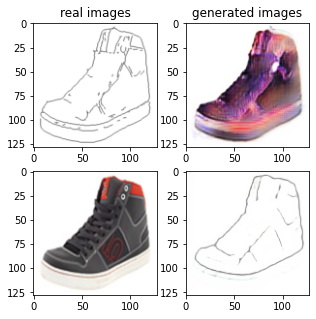

Train Epoch: 1 64% 	Total Loss: 1.479557 	Loss_G_AB: 0.389309	Loss_G_BA: 1.016972	Loss_cycle: 0.533997	Loss_D_A: 0.018380	Loss_D_B: 0.224039
0 32009 T:  1.6731483936309814
Train Epoch: 1 64% 	Total Loss: 1.293442 	Loss_G_AB: 0.287778	Loss_G_BA: 0.943464	Loss_cycle: 0.420424	Loss_D_A: 0.017017	Loss_D_B: 0.240380
0 32019 T:  0.9183082580566406
Train Epoch: 1 64% 	Total Loss: 1.474334 	Loss_G_AB: 0.305240	Loss_G_BA: 0.892914	Loss_cycle: 0.454273	Loss_D_A: 0.168419	Loss_D_B: 0.252565
0 32029 T:  0.9172136783599854
Train Epoch: 1 64% 	Total Loss: 1.381910 	Loss_G_AB: 0.310343	Loss_G_BA: 0.920012	Loss_cycle: 0.496769	Loss_D_A: 0.018831	Loss_D_B: 0.251134
0 32039 T:  0.9128172397613525
Train Epoch: 1 64% 	Total Loss: 1.327186 	Loss_G_AB: 0.279978	Loss_G_BA: 0.960571	Loss_cycle: 0.425739	Loss_D_A: 0.021498	Loss_D_B: 0.259676
0 32049 T:  0.9122898578643799
Train Epoch: 1 64% 	Total Loss: 1.340375 	Loss_G_AB: 0.288379	Loss_G_BA: 0.982658	Loss_cycle: 0.447278	Loss_D_A: 0.006992	Loss_D_B: 0.250587

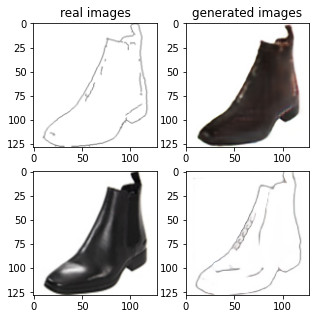

Train Epoch: 1 66% 	Total Loss: 1.397251 	Loss_G_AB: 0.325728	Loss_G_BA: 0.986300	Loss_cycle: 0.493755	Loss_D_A: 0.002437	Loss_D_B: 0.245044
0 33009 T:  1.600731611251831
Train Epoch: 1 66% 	Total Loss: 1.302964 	Loss_G_AB: 0.261149	Loss_G_BA: 1.000725	Loss_cycle: 0.402376	Loss_D_A: 0.005856	Loss_D_B: 0.263794
0 33019 T:  0.9501321315765381
Train Epoch: 1 66% 	Total Loss: 1.277826 	Loss_G_AB: 0.310950	Loss_G_BA: 1.008356	Loss_cycle: 0.371006	Loss_D_A: 0.004357	Loss_D_B: 0.242809
0 33029 T:  0.9505352973937988
Train Epoch: 1 66% 	Total Loss: 1.338074 	Loss_G_AB: 0.310529	Loss_G_BA: 0.988934	Loss_cycle: 0.454409	Loss_D_A: 0.002488	Loss_D_B: 0.231445
0 33039 T:  0.9437360763549805
Train Epoch: 1 66% 	Total Loss: 1.428420 	Loss_G_AB: 0.302185	Loss_G_BA: 1.008109	Loss_cycle: 0.522532	Loss_D_A: 0.003109	Loss_D_B: 0.247632
0 33049 T:  0.941126823425293
Train Epoch: 1 66% 	Total Loss: 1.333934 	Loss_G_AB: 0.325817	Loss_G_BA: 0.988514	Loss_cycle: 0.430124	Loss_D_A: 0.002569	Loss_D_B: 0.244076
0

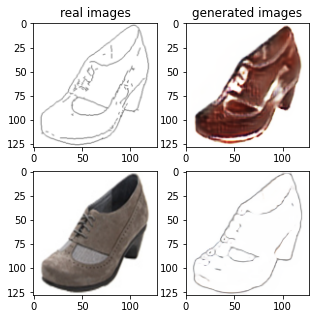

Train Epoch: 1 68% 	Total Loss: 1.393348 	Loss_G_AB: 0.279136	Loss_G_BA: 0.908651	Loss_cycle: 0.526108	Loss_D_A: 0.016296	Loss_D_B: 0.257050
0 34009 T:  1.6101880073547363
Train Epoch: 1 68% 	Total Loss: 1.273584 	Loss_G_AB: 0.275515	Loss_G_BA: 0.929496	Loss_cycle: 0.380842	Loss_D_A: 0.045620	Loss_D_B: 0.244616
0 34019 T:  0.9460048675537109
Train Epoch: 1 68% 	Total Loss: 1.354948 	Loss_G_AB: 0.335082	Loss_G_BA: 1.048880	Loss_cycle: 0.432211	Loss_D_A: 0.006751	Loss_D_B: 0.224005
0 34029 T:  0.9473350048065186
Train Epoch: 1 68% 	Total Loss: 1.325146 	Loss_G_AB: 0.299853	Loss_G_BA: 0.829330	Loss_cycle: 0.458535	Loss_D_A: 0.082292	Loss_D_B: 0.219727
0 34039 T:  0.9519093036651611
Train Epoch: 1 68% 	Total Loss: 1.562692 	Loss_G_AB: 0.300435	Loss_G_BA: 0.687558	Loss_cycle: 0.633161	Loss_D_A: 0.179628	Loss_D_B: 0.255906
0 34049 T:  0.9484858512878418
Train Epoch: 1 68% 	Total Loss: 1.401594 	Loss_G_AB: 0.297567	Loss_G_BA: 0.728538	Loss_cycle: 0.537217	Loss_D_A: 0.100075	Loss_D_B: 0.251249

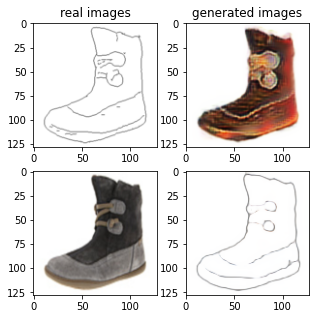

Train Epoch: 1 70% 	Total Loss: 1.358569 	Loss_G_AB: 0.281255	Loss_G_BA: 0.993633	Loss_cycle: 0.452972	Loss_D_A: 0.009189	Loss_D_B: 0.258965
0 35009 T:  1.5893487930297852
Train Epoch: 1 70% 	Total Loss: 1.397055 	Loss_G_AB: 0.303648	Loss_G_BA: 0.996766	Loss_cycle: 0.508809	Loss_D_A: 0.016039	Loss_D_B: 0.222000
0 35019 T:  0.9485960006713867
Train Epoch: 1 70% 	Total Loss: 1.294099 	Loss_G_AB: 0.277764	Loss_G_BA: 1.008435	Loss_cycle: 0.390054	Loss_D_A: 0.005624	Loss_D_B: 0.255322
0 35029 T:  0.9485049247741699
Train Epoch: 1 70% 	Total Loss: 1.352319 	Loss_G_AB: 0.303517	Loss_G_BA: 0.985074	Loss_cycle: 0.433666	Loss_D_A: 0.008399	Loss_D_B: 0.265957
0 35039 T:  0.9483370780944824
Train Epoch: 1 70% 	Total Loss: 1.424462 	Loss_G_AB: 0.292359	Loss_G_BA: 0.925198	Loss_cycle: 0.518291	Loss_D_A: 0.028821	Loss_D_B: 0.268570
0 35049 T:  0.9473628997802734
Train Epoch: 1 70% 	Total Loss: 1.340047 	Loss_G_AB: 0.303041	Loss_G_BA: 0.868016	Loss_cycle: 0.443330	Loss_D_A: 0.049987	Loss_D_B: 0.261202

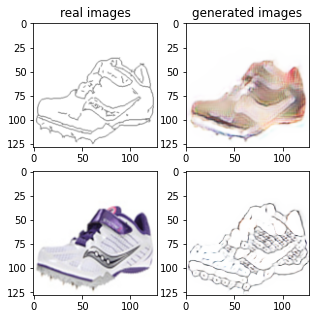

Train Epoch: 1 72% 	Total Loss: 1.479018 	Loss_G_AB: 0.315434	Loss_G_BA: 1.025893	Loss_cycle: 0.514526	Loss_D_A: 0.005042	Loss_D_B: 0.288787
0 36009 T:  1.5923738479614258
Train Epoch: 1 72% 	Total Loss: 1.398726 	Loss_G_AB: 0.372640	Loss_G_BA: 0.963613	Loss_cycle: 0.415891	Loss_D_A: 0.028834	Loss_D_B: 0.285874
0 36019 T:  0.9492301940917969
Train Epoch: 1 72% 	Total Loss: 1.457144 	Loss_G_AB: 0.365381	Loss_G_BA: 0.985997	Loss_cycle: 0.518715	Loss_D_A: 0.015725	Loss_D_B: 0.247015
0 36029 T:  0.9435653686523438
Train Epoch: 1 72% 	Total Loss: 1.473856 	Loss_G_AB: 0.353026	Loss_G_BA: 0.981648	Loss_cycle: 0.540121	Loss_D_A: 0.013418	Loss_D_B: 0.252980
0 36039 T:  0.946002721786499
Train Epoch: 1 72% 	Total Loss: 1.422116 	Loss_G_AB: 0.303403	Loss_G_BA: 0.982743	Loss_cycle: 0.520557	Loss_D_A: 0.004723	Loss_D_B: 0.253763
0 36049 T:  0.947434663772583
Train Epoch: 1 72% 	Total Loss: 1.335856 	Loss_G_AB: 0.278880	Loss_G_BA: 0.999588	Loss_cycle: 0.435167	Loss_D_A: 0.004624	Loss_D_B: 0.256831
0

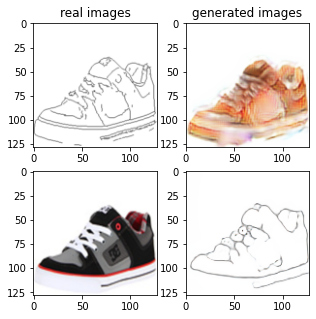

Train Epoch: 1 74% 	Total Loss: 1.379293 	Loss_G_AB: 0.301567	Loss_G_BA: 0.930358	Loss_cycle: 0.451842	Loss_D_A: 0.073412	Loss_D_B: 0.238076
0 37009 T:  1.5835645198822021
Train Epoch: 1 74% 	Total Loss: 1.350923 	Loss_G_AB: 0.283466	Loss_G_BA: 0.961633	Loss_cycle: 0.471489	Loss_D_A: 0.008980	Loss_D_B: 0.247904
0 37019 T:  0.9430317878723145
Train Epoch: 1 74% 	Total Loss: 1.470665 	Loss_G_AB: 0.274966	Loss_G_BA: 1.014716	Loss_cycle: 0.561419	Loss_D_A: 0.010567	Loss_D_B: 0.253838
0 37029 T:  0.9427993297576904
Train Epoch: 1 74% 	Total Loss: 1.410402 	Loss_G_AB: 0.319672	Loss_G_BA: 0.920812	Loss_cycle: 0.540183	Loss_D_A: 0.019229	Loss_D_B: 0.230749
0 37039 T:  0.9496543407440186
Train Epoch: 1 74% 	Total Loss: 1.368140 	Loss_G_AB: 0.279575	Loss_G_BA: 0.933137	Loss_cycle: 0.483865	Loss_D_A: 0.025814	Loss_D_B: 0.252106
0 37049 T:  0.9535675048828125
Train Epoch: 1 74% 	Total Loss: 1.511123 	Loss_G_AB: 0.317082	Loss_G_BA: 0.944545	Loss_cycle: 0.624533	Loss_D_A: 0.020708	Loss_D_B: 0.235067

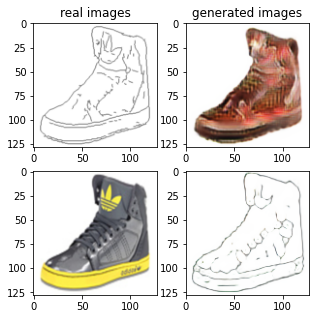

Train Epoch: 1 76% 	Total Loss: 1.409064 	Loss_G_AB: 0.259417	Loss_G_BA: 0.972566	Loss_cycle: 0.532908	Loss_D_A: 0.008284	Loss_D_B: 0.251881
0 38009 T:  1.661123514175415
Train Epoch: 1 76% 	Total Loss: 1.300547 	Loss_G_AB: 0.289421	Loss_G_BA: 0.944909	Loss_cycle: 0.394649	Loss_D_A: 0.025893	Loss_D_B: 0.262840
0 38019 T:  0.9090938568115234
Train Epoch: 1 76% 	Total Loss: 1.414825 	Loss_G_AB: 0.288240	Loss_G_BA: 1.026232	Loss_cycle: 0.506459	Loss_D_A: 0.013921	Loss_D_B: 0.237210
0 38029 T:  0.9074094295501709
Train Epoch: 1 76% 	Total Loss: 1.266167 	Loss_G_AB: 0.301497	Loss_G_BA: 0.979167	Loss_cycle: 0.356209	Loss_D_A: 0.009534	Loss_D_B: 0.260092
0 38039 T:  0.909764289855957
Train Epoch: 1 76% 	Total Loss: 1.298355 	Loss_G_AB: 0.323710	Loss_G_BA: 0.961320	Loss_cycle: 0.391018	Loss_D_A: 0.016790	Loss_D_B: 0.248032
0 38049 T:  0.914574384689331
Train Epoch: 1 76% 	Total Loss: 1.294108 	Loss_G_AB: 0.300415	Loss_G_BA: 0.946937	Loss_cycle: 0.411283	Loss_D_A: 0.024529	Loss_D_B: 0.234620
0 

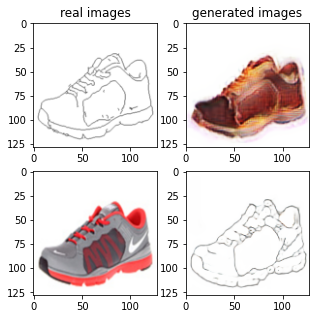

Train Epoch: 1 78% 	Total Loss: 1.370927 	Loss_G_AB: 0.327669	Loss_G_BA: 0.951599	Loss_cycle: 0.469337	Loss_D_A: 0.028082	Loss_D_B: 0.233874
0 39009 T:  1.5869734287261963
Train Epoch: 1 78% 	Total Loss: 1.477597 	Loss_G_AB: 0.296030	Loss_G_BA: 0.988711	Loss_cycle: 0.569718	Loss_D_A: 0.005464	Loss_D_B: 0.260045
0 39019 T:  0.9430015087127686
Train Epoch: 1 78% 	Total Loss: 1.323142 	Loss_G_AB: 0.321185	Loss_G_BA: 0.993355	Loss_cycle: 0.416743	Loss_D_A: 0.005055	Loss_D_B: 0.244074
0 39029 T:  0.9428882598876953
Train Epoch: 1 78% 	Total Loss: 1.374362 	Loss_G_AB: 0.308922	Loss_G_BA: 0.999990	Loss_cycle: 0.432168	Loss_D_A: 0.004862	Loss_D_B: 0.282876
0 39039 T:  0.9531967639923096
Train Epoch: 1 78% 	Total Loss: 1.269763 	Loss_G_AB: 0.263296	Loss_G_BA: 0.993085	Loss_cycle: 0.389239	Loss_D_A: 0.009635	Loss_D_B: 0.242698
0 39049 T:  0.9491727352142334
Train Epoch: 1 78% 	Total Loss: 1.407170 	Loss_G_AB: 0.385158	Loss_G_BA: 1.019477	Loss_cycle: 0.497250	Loss_D_A: 0.005081	Loss_D_B: 0.202520

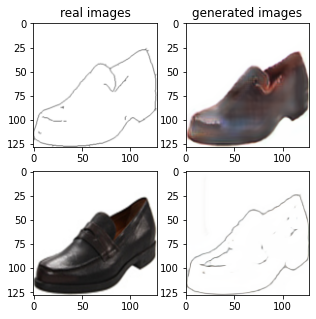

Train Epoch: 1 80% 	Total Loss: 1.405286 	Loss_G_AB: 0.349794	Loss_G_BA: 0.449089	Loss_cycle: 0.550698	Loss_D_A: 0.246614	Loss_D_B: 0.208532
0 40009 T:  1.5933692455291748
Train Epoch: 1 80% 	Total Loss: 1.351348 	Loss_G_AB: 0.351312	Loss_G_BA: 0.517969	Loss_cycle: 0.408583	Loss_D_A: 0.208877	Loss_D_B: 0.299247
0 40019 T:  0.9565575122833252
Train Epoch: 1 80% 	Total Loss: 1.348015 	Loss_G_AB: 0.292857	Loss_G_BA: 0.541299	Loss_cycle: 0.485314	Loss_D_A: 0.206865	Loss_D_B: 0.238758
0 40029 T:  0.9450035095214844
Train Epoch: 1 80% 	Total Loss: 1.314469 	Loss_G_AB: 0.328256	Loss_G_BA: 0.625113	Loss_cycle: 0.442503	Loss_D_A: 0.161021	Loss_D_B: 0.234260
0 40039 T:  0.9449238777160645
Train Epoch: 1 80% 	Total Loss: 1.355287 	Loss_G_AB: 0.284876	Loss_G_BA: 0.594492	Loss_cycle: 0.508982	Loss_D_A: 0.165116	Loss_D_B: 0.241505
0 40049 T:  0.9409308433532715
Train Epoch: 1 80% 	Total Loss: 1.299110 	Loss_G_AB: 0.300878	Loss_G_BA: 0.582016	Loss_cycle: 0.420948	Loss_D_A: 0.198576	Loss_D_B: 0.238139

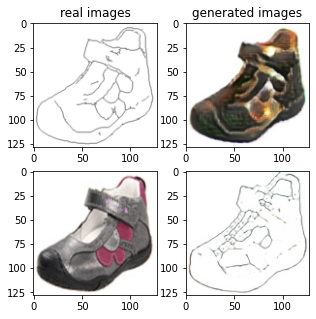

Train Epoch: 1 82% 	Total Loss: 1.440112 	Loss_G_AB: 0.297056	Loss_G_BA: 0.984627	Loss_cycle: 0.543112	Loss_D_A: 0.006775	Loss_D_B: 0.249383
0 41009 T:  1.5826003551483154
Train Epoch: 1 82% 	Total Loss: 1.313684 	Loss_G_AB: 0.303875	Loss_G_BA: 0.997238	Loss_cycle: 0.426127	Loss_D_A: 0.004762	Loss_D_B: 0.232239
0 41019 T:  0.9433228969573975
Train Epoch: 1 82% 	Total Loss: 1.519627 	Loss_G_AB: 0.293810	Loss_G_BA: 0.968188	Loss_cycle: 0.622775	Loss_D_A: 0.021268	Loss_D_B: 0.244585
0 41029 T:  0.9465000629425049
Train Epoch: 1 82% 	Total Loss: 1.336207 	Loss_G_AB: 0.281334	Loss_G_BA: 0.914170	Loss_cycle: 0.453896	Loss_D_A: 0.016452	Loss_D_B: 0.268107
0 41039 T:  0.9445421695709229
Train Epoch: 1 82% 	Total Loss: 1.307322 	Loss_G_AB: 0.284816	Loss_G_BA: 0.929552	Loss_cycle: 0.385898	Loss_D_A: 0.078420	Loss_D_B: 0.235820
0 41049 T:  0.946765661239624
Train Epoch: 1 82% 	Total Loss: 1.254066 	Loss_G_AB: 0.304097	Loss_G_BA: 0.856758	Loss_cycle: 0.378091	Loss_D_A: 0.068518	Loss_D_B: 0.227029


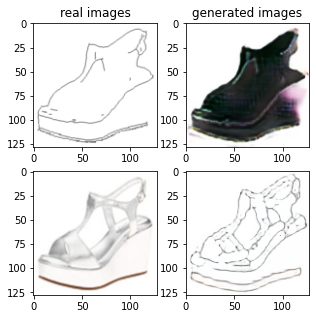

Train Epoch: 1 84% 	Total Loss: 1.459505 	Loss_G_AB: 0.311716	Loss_G_BA: 1.029057	Loss_cycle: 0.478679	Loss_D_A: 0.073455	Loss_D_B: 0.236984
0 42009 T:  1.5990583896636963
Train Epoch: 1 84% 	Total Loss: 1.403002 	Loss_G_AB: 0.285891	Loss_G_BA: 0.828209	Loss_cycle: 0.459396	Loss_D_A: 0.126224	Loss_D_B: 0.260332
0 42019 T:  0.9519531726837158
Train Epoch: 1 84% 	Total Loss: 1.350295 	Loss_G_AB: 0.286595	Loss_G_BA: 0.683686	Loss_cycle: 0.430576	Loss_D_A: 0.189189	Loss_D_B: 0.245389
0 42029 T:  0.9480783939361572
Train Epoch: 1 84% 	Total Loss: 1.343599 	Loss_G_AB: 0.294408	Loss_G_BA: 0.880262	Loss_cycle: 0.461747	Loss_D_A: 0.055944	Loss_D_B: 0.238572
0 42039 T:  0.9470064640045166
Train Epoch: 1 84% 	Total Loss: 1.376407 	Loss_G_AB: 0.274761	Loss_G_BA: 1.033270	Loss_cycle: 0.458154	Loss_D_A: 0.009837	Loss_D_B: 0.254401
0 42049 T:  0.9572227001190186
Train Epoch: 1 84% 	Total Loss: 1.349368 	Loss_G_AB: 0.316898	Loss_G_BA: 1.011949	Loss_cycle: 0.448237	Loss_D_A: 0.004020	Loss_D_B: 0.232686

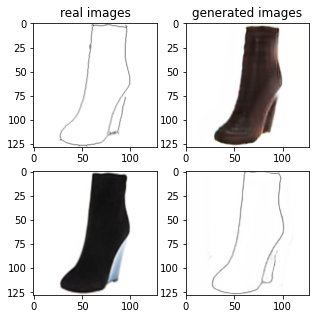

Train Epoch: 1 86% 	Total Loss: 1.232892 	Loss_G_AB: 0.285466	Loss_G_BA: 0.981833	Loss_cycle: 0.340978	Loss_D_A: 0.004923	Loss_D_B: 0.253342
0 43009 T:  1.5707671642303467
Train Epoch: 1 86% 	Total Loss: 1.416074 	Loss_G_AB: 0.301575	Loss_G_BA: 0.999869	Loss_cycle: 0.513173	Loss_D_A: 0.003313	Loss_D_B: 0.248866
0 43019 T:  0.9401271343231201
Train Epoch: 1 86% 	Total Loss: 1.335929 	Loss_G_AB: 0.334075	Loss_G_BA: 1.009340	Loss_cycle: 0.428878	Loss_D_A: 0.004499	Loss_D_B: 0.230844
0 43029 T:  0.9452624320983887
Train Epoch: 1 86% 	Total Loss: 1.304804 	Loss_G_AB: 0.275952	Loss_G_BA: 0.997009	Loss_cycle: 0.365679	Loss_D_A: 0.004401	Loss_D_B: 0.298243
0 43039 T:  0.9440655708312988
Train Epoch: 1 86% 	Total Loss: 1.458080 	Loss_G_AB: 0.304312	Loss_G_BA: 1.001705	Loss_cycle: 0.549041	Loss_D_A: 0.004319	Loss_D_B: 0.251712
0 43049 T:  0.9463255405426025
Train Epoch: 1 86% 	Total Loss: 1.404332 	Loss_G_AB: 0.288200	Loss_G_BA: 0.995173	Loss_cycle: 0.507121	Loss_D_A: 0.004356	Loss_D_B: 0.251169

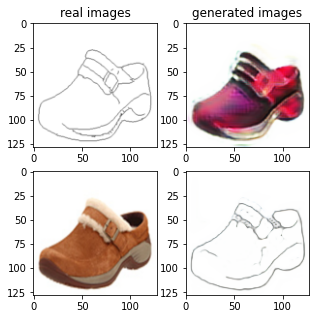

Train Epoch: 1 88% 	Total Loss: 1.326856 	Loss_G_AB: 0.352852	Loss_G_BA: 0.994754	Loss_cycle: 0.408558	Loss_D_A: 0.007778	Loss_D_B: 0.236717
0 44009 T:  1.628136396408081
Train Epoch: 1 88% 	Total Loss: 1.300915 	Loss_G_AB: 0.260289	Loss_G_BA: 0.990858	Loss_cycle: 0.396890	Loss_D_A: 0.010793	Loss_D_B: 0.267659
0 44019 T:  0.9113662242889404
Train Epoch: 1 88% 	Total Loss: 1.269193 	Loss_G_AB: 0.280204	Loss_G_BA: 1.003122	Loss_cycle: 0.364216	Loss_D_A: 0.007446	Loss_D_B: 0.255869
0 44029 T:  0.913834810256958
Train Epoch: 1 88% 	Total Loss: 1.347285 	Loss_G_AB: 0.283571	Loss_G_BA: 0.996119	Loss_cycle: 0.442977	Loss_D_A: 0.005353	Loss_D_B: 0.259110
0 44039 T:  0.9064383506774902
Train Epoch: 1 88% 	Total Loss: 1.257008 	Loss_G_AB: 0.283598	Loss_G_BA: 0.993454	Loss_cycle: 0.372412	Loss_D_A: 0.003026	Loss_D_B: 0.243045
0 44049 T:  0.9063258171081543
Train Epoch: 1 88% 	Total Loss: 1.385951 	Loss_G_AB: 0.344838	Loss_G_BA: 1.005655	Loss_cycle: 0.482359	Loss_D_A: 0.002916	Loss_D_B: 0.225429
0

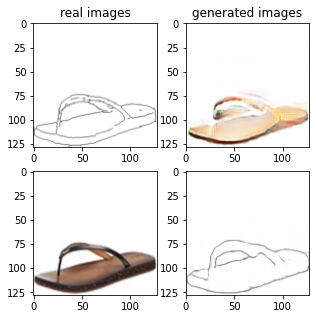

Train Epoch: 1 90% 	Total Loss: 1.431553 	Loss_G_AB: 0.267585	Loss_G_BA: 0.574362	Loss_cycle: 0.553570	Loss_D_A: 0.187129	Loss_D_B: 0.269881
0 45009 T:  1.5806124210357666
Train Epoch: 1 90% 	Total Loss: 1.336074 	Loss_G_AB: 0.294266	Loss_G_BA: 0.697438	Loss_cycle: 0.472858	Loss_D_A: 0.095315	Loss_D_B: 0.272050
0 45019 T:  0.9471542835235596
Train Epoch: 1 90% 	Total Loss: 1.463991 	Loss_G_AB: 0.424562	Loss_G_BA: 0.598928	Loss_cycle: 0.532574	Loss_D_A: 0.202051	Loss_D_B: 0.217621
0 45029 T:  0.9457240104675293
Train Epoch: 1 90% 	Total Loss: 1.481577 	Loss_G_AB: 0.319290	Loss_G_BA: 0.900511	Loss_cycle: 0.529465	Loss_D_A: 0.031543	Loss_D_B: 0.310669
0 45039 T:  0.9419186115264893
Train Epoch: 1 90% 	Total Loss: 1.350521 	Loss_G_AB: 0.334775	Loss_G_BA: 0.867437	Loss_cycle: 0.452915	Loss_D_A: 0.070355	Loss_D_B: 0.226145
0 45049 T:  0.9383041858673096
Train Epoch: 1 90% 	Total Loss: 1.387155 	Loss_G_AB: 0.313549	Loss_G_BA: 0.770413	Loss_cycle: 0.528919	Loss_D_A: 0.071614	Loss_D_B: 0.244641

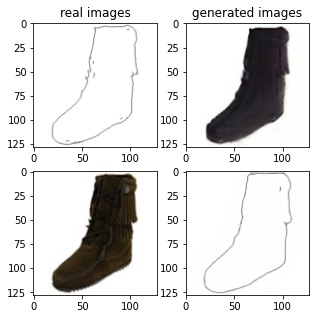

Train Epoch: 1 92% 	Total Loss: 1.290011 	Loss_G_AB: 0.319103	Loss_G_BA: 0.975563	Loss_cycle: 0.377685	Loss_D_A: 0.004980	Loss_D_B: 0.260013
0 46009 T:  1.5811395645141602
Train Epoch: 1 92% 	Total Loss: 1.296294 	Loss_G_AB: 0.313622	Loss_G_BA: 1.008380	Loss_cycle: 0.381358	Loss_D_A: 0.003298	Loss_D_B: 0.250637
0 46019 T:  0.9484376907348633
Train Epoch: 1 92% 	Total Loss: 1.335322 	Loss_G_AB: 0.320275	Loss_G_BA: 1.003405	Loss_cycle: 0.423151	Loss_D_A: 0.002447	Loss_D_B: 0.247884
0 46029 T:  0.94319748878479
Train Epoch: 1 92% 	Total Loss: 1.383660 	Loss_G_AB: 0.307550	Loss_G_BA: 0.990991	Loss_cycle: 0.497082	Loss_D_A: 0.004839	Loss_D_B: 0.232468
0 46039 T:  0.9516160488128662
Train Epoch: 1 92% 	Total Loss: 1.274044 	Loss_G_AB: 0.289067	Loss_G_BA: 0.998914	Loss_cycle: 0.390886	Loss_D_A: 0.003643	Loss_D_B: 0.235524
0 46049 T:  0.9412200450897217
Train Epoch: 1 92% 	Total Loss: 1.328508 	Loss_G_AB: 0.279567	Loss_G_BA: 0.982495	Loss_cycle: 0.436172	Loss_D_A: 0.005307	Loss_D_B: 0.255998
0

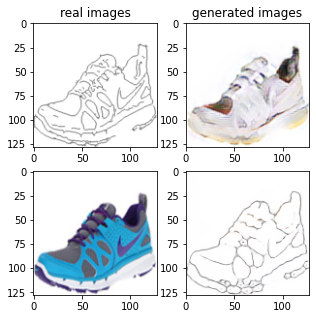

Train Epoch: 1 94% 	Total Loss: 1.334984 	Loss_G_AB: 0.310390	Loss_G_BA: 1.006899	Loss_cycle: 0.411572	Loss_D_A: 0.002475	Loss_D_B: 0.262292
0 47009 T:  1.5675914287567139
Train Epoch: 1 94% 	Total Loss: 1.319982 	Loss_G_AB: 0.287969	Loss_G_BA: 1.008240	Loss_cycle: 0.420673	Loss_D_A: 0.003270	Loss_D_B: 0.247935
0 47019 T:  0.9446132183074951
Train Epoch: 1 94% 	Total Loss: 1.316558 	Loss_G_AB: 0.294302	Loss_G_BA: 1.008167	Loss_cycle: 0.394231	Loss_D_A: 0.002824	Loss_D_B: 0.268269
0 47029 T:  0.939157247543335
Train Epoch: 1 94% 	Total Loss: 1.257471 	Loss_G_AB: 0.303664	Loss_G_BA: 0.982683	Loss_cycle: 0.390265	Loss_D_A: 0.002262	Loss_D_B: 0.221771
0 47039 T:  0.9459619522094727
Train Epoch: 1 94% 	Total Loss: 1.324819 	Loss_G_AB: 0.266530	Loss_G_BA: 1.004737	Loss_cycle: 0.438288	Loss_D_A: 0.002999	Loss_D_B: 0.247898
0 47049 T:  0.9457519054412842
Train Epoch: 1 94% 	Total Loss: 1.244538 	Loss_G_AB: 0.292845	Loss_G_BA: 0.988961	Loss_cycle: 0.357796	Loss_D_A: 0.002695	Loss_D_B: 0.243144


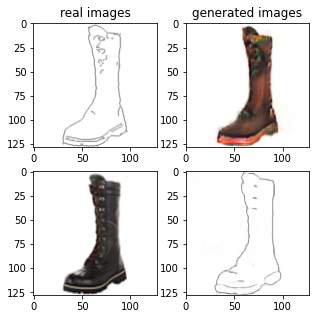

Train Epoch: 1 96% 	Total Loss: 1.331007 	Loss_G_AB: 0.313806	Loss_G_BA: 1.019363	Loss_cycle: 0.414145	Loss_D_A: 0.002045	Loss_D_B: 0.248233
0 48009 T:  1.5684170722961426
Train Epoch: 1 96% 	Total Loss: 1.391951 	Loss_G_AB: 0.325852	Loss_G_BA: 0.992953	Loss_cycle: 0.488879	Loss_D_A: 0.002321	Loss_D_B: 0.241349
0 48019 T:  0.9437894821166992
Train Epoch: 1 96% 	Total Loss: 1.377205 	Loss_G_AB: 0.274755	Loss_G_BA: 0.982222	Loss_cycle: 0.493623	Loss_D_A: 0.002677	Loss_D_B: 0.252416
0 48029 T:  0.9388091564178467
Train Epoch: 1 96% 	Total Loss: 1.274698 	Loss_G_AB: 0.284788	Loss_G_BA: 0.991408	Loss_cycle: 0.382832	Loss_D_A: 0.003509	Loss_D_B: 0.250258
0 48039 T:  0.9386570453643799
Train Epoch: 1 96% 	Total Loss: 1.368392 	Loss_G_AB: 0.277124	Loss_G_BA: 0.998423	Loss_cycle: 0.457224	Loss_D_A: 0.014828	Loss_D_B: 0.258567
0 48049 T:  0.9506099224090576
Train Epoch: 1 96% 	Total Loss: 1.258100 	Loss_G_AB: 0.302964	Loss_G_BA: 0.964196	Loss_cycle: 0.375561	Loss_D_A: 0.008487	Loss_D_B: 0.240471

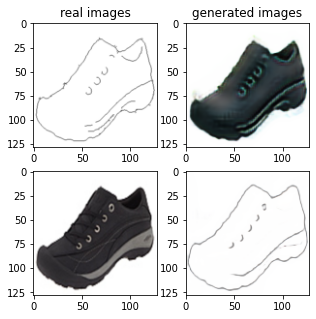

Train Epoch: 1 98% 	Total Loss: 1.322475 	Loss_G_AB: 0.301317	Loss_G_BA: 1.018131	Loss_cycle: 0.370415	Loss_D_A: 0.006490	Loss_D_B: 0.285846
0 49009 T:  1.5690083503723145
Train Epoch: 1 98% 	Total Loss: 1.307240 	Loss_G_AB: 0.344204	Loss_G_BA: 0.995371	Loss_cycle: 0.416420	Loss_D_A: 0.002585	Loss_D_B: 0.218447
0 49019 T:  0.943350076675415
Train Epoch: 1 98% 	Total Loss: 1.290684 	Loss_G_AB: 0.327089	Loss_G_BA: 1.003480	Loss_cycle: 0.385585	Loss_D_A: 0.002065	Loss_D_B: 0.237749
0 49029 T:  0.9427063465118408
Train Epoch: 1 98% 	Total Loss: 1.371359 	Loss_G_AB: 0.307263	Loss_G_BA: 1.010055	Loss_cycle: 0.402747	Loss_D_A: 0.002801	Loss_D_B: 0.307152
0 49039 T:  0.9379010200500488
Train Epoch: 1 98% 	Total Loss: 1.378736 	Loss_G_AB: 0.331346	Loss_G_BA: 0.995531	Loss_cycle: 0.464192	Loss_D_A: 0.002515	Loss_D_B: 0.248590
0 49049 T:  0.943234920501709
Train Epoch: 1 98% 	Total Loss: 1.399186 	Loss_G_AB: 0.317838	Loss_G_BA: 0.965713	Loss_cycle: 0.491348	Loss_D_A: 0.015026	Loss_D_B: 0.251037
0

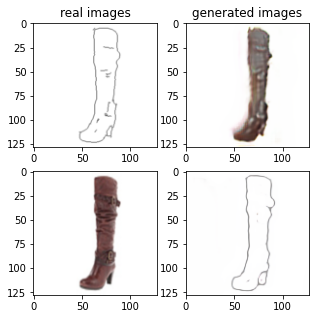

Train Epoch: 2 0% 	Total Loss: 1.308263 	Loss_G_AB: 0.281103	Loss_G_BA: 0.956586	Loss_cycle: 0.430179	Loss_D_A: 0.008224	Loss_D_B: 0.251016
1 50009 T:  1.6182236671447754
Train Epoch: 2 0% 	Total Loss: 1.376746 	Loss_G_AB: 0.266996	Loss_G_BA: 0.996704	Loss_cycle: 0.481812	Loss_D_A: 0.007366	Loss_D_B: 0.255719
1 50019 T:  0.9062271118164062
Train Epoch: 2 0% 	Total Loss: 1.264855 	Loss_G_AB: 0.316715	Loss_G_BA: 0.946608	Loss_cycle: 0.366122	Loss_D_A: 0.016008	Loss_D_B: 0.251063
1 50029 T:  0.9055945873260498
Train Epoch: 2 0% 	Total Loss: 1.305398 	Loss_G_AB: 0.266780	Loss_G_BA: 0.974502	Loss_cycle: 0.429283	Loss_D_A: 0.006617	Loss_D_B: 0.248857
1 50039 T:  0.9054083824157715
Train Epoch: 2 0% 	Total Loss: 1.306793 	Loss_G_AB: 0.303124	Loss_G_BA: 0.946622	Loss_cycle: 0.457103	Loss_D_A: 0.010820	Loss_D_B: 0.213997
1 50049 T:  0.9090051651000977
Train Epoch: 2 0% 	Total Loss: 1.332223 	Loss_G_AB: 0.359067	Loss_G_BA: 1.025631	Loss_cycle: 0.431627	Loss_D_A: 0.009477	Loss_D_B: 0.198770
1 500

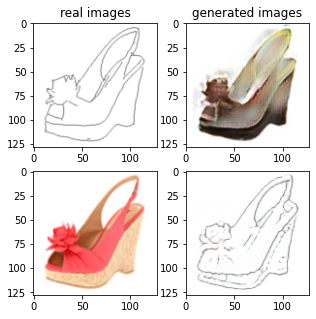

Train Epoch: 2 2% 	Total Loss: 1.400749 	Loss_G_AB: 0.329119	Loss_G_BA: 0.991553	Loss_cycle: 0.468910	Loss_D_A: 0.002357	Loss_D_B: 0.269147
1 51009 T:  1.575347661972046
Train Epoch: 2 2% 	Total Loss: 1.226302 	Loss_G_AB: 0.299069	Loss_G_BA: 1.002428	Loss_cycle: 0.335324	Loss_D_A: 0.002381	Loss_D_B: 0.237848
1 51019 T:  0.9384546279907227
Train Epoch: 2 2% 	Total Loss: 1.292866 	Loss_G_AB: 0.289554	Loss_G_BA: 1.003632	Loss_cycle: 0.394065	Loss_D_A: 0.001772	Loss_D_B: 0.250436
1 51029 T:  0.9396581649780273
Train Epoch: 2 2% 	Total Loss: 1.178037 	Loss_G_AB: 0.288942	Loss_G_BA: 1.009773	Loss_cycle: 0.275972	Loss_D_A: 0.004345	Loss_D_B: 0.248363
1 51039 T:  0.9473261833190918
Train Epoch: 2 2% 	Total Loss: 1.230976 	Loss_G_AB: 0.287474	Loss_G_BA: 0.974119	Loss_cycle: 0.358415	Loss_D_A: 0.003081	Loss_D_B: 0.238683
1 51049 T:  0.9394426345825195
Train Epoch: 2 2% 	Total Loss: 1.413015 	Loss_G_AB: 0.347295	Loss_G_BA: 1.001552	Loss_cycle: 0.497587	Loss_D_A: 0.009927	Loss_D_B: 0.231077
1 5105

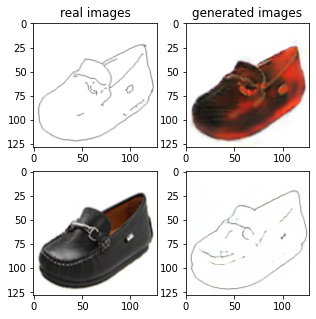

Train Epoch: 2 4% 	Total Loss: 1.312519 	Loss_G_AB: 0.309868	Loss_G_BA: 1.004292	Loss_cycle: 0.401013	Loss_D_A: 0.002335	Loss_D_B: 0.252091
1 52009 T:  1.5732026100158691
Train Epoch: 2 4% 	Total Loss: 1.371046 	Loss_G_AB: 0.330469	Loss_G_BA: 1.009194	Loss_cycle: 0.457994	Loss_D_A: 0.005249	Loss_D_B: 0.237972
1 52019 T:  0.9407310485839844
Train Epoch: 2 4% 	Total Loss: 1.361564 	Loss_G_AB: 0.344923	Loss_G_BA: 0.994894	Loss_cycle: 0.490032	Loss_D_A: 0.002148	Loss_D_B: 0.199476
1 52029 T:  0.9431557655334473
Train Epoch: 2 4% 	Total Loss: 1.252213 	Loss_G_AB: 0.294602	Loss_G_BA: 1.007918	Loss_cycle: 0.347699	Loss_D_A: 0.001498	Loss_D_B: 0.251756
1 52039 T:  0.9455521106719971
Train Epoch: 2 4% 	Total Loss: 1.432045 	Loss_G_AB: 0.306545	Loss_G_BA: 0.997922	Loss_cycle: 0.536561	Loss_D_A: 0.002316	Loss_D_B: 0.240934
1 52049 T:  0.9400777816772461
Train Epoch: 2 4% 	Total Loss: 1.410614 	Loss_G_AB: 0.312488	Loss_G_BA: 1.001222	Loss_cycle: 0.496617	Loss_D_A: 0.003009	Loss_D_B: 0.254132
1 520

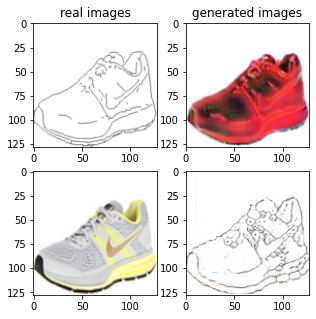

Train Epoch: 2 6% 	Total Loss: 1.330573 	Loss_G_AB: 0.251594	Loss_G_BA: 0.939422	Loss_cycle: 0.427766	Loss_D_A: 0.041738	Loss_D_B: 0.265561
1 53009 T:  1.5755021572113037
Train Epoch: 2 6% 	Total Loss: 1.385568 	Loss_G_AB: 0.339841	Loss_G_BA: 0.976306	Loss_cycle: 0.426734	Loss_D_A: 0.013964	Loss_D_B: 0.286796
1 53019 T:  0.9382145404815674
Train Epoch: 2 6% 	Total Loss: 1.269840 	Loss_G_AB: 0.336839	Loss_G_BA: 0.963296	Loss_cycle: 0.389834	Loss_D_A: 0.009795	Loss_D_B: 0.220143
1 53029 T:  0.9395899772644043
Train Epoch: 2 6% 	Total Loss: 1.346407 	Loss_G_AB: 0.287421	Loss_G_BA: 0.943424	Loss_cycle: 0.423087	Loss_D_A: 0.008175	Loss_D_B: 0.299722
1 53039 T:  0.938281774520874
Train Epoch: 2 6% 	Total Loss: 1.413188 	Loss_G_AB: 0.292781	Loss_G_BA: 1.000957	Loss_cycle: 0.439137	Loss_D_A: 0.077131	Loss_D_B: 0.250051
1 53049 T:  0.9483320713043213
Train Epoch: 2 6% 	Total Loss: 1.314301 	Loss_G_AB: 0.286551	Loss_G_BA: 0.888839	Loss_cycle: 0.454172	Loss_D_A: 0.019661	Loss_D_B: 0.252774
1 5305

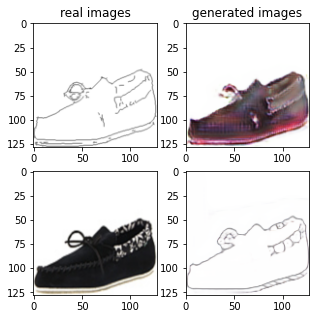

Train Epoch: 2 8% 	Total Loss: 1.281800 	Loss_G_AB: 0.284245	Loss_G_BA: 0.994191	Loss_cycle: 0.384571	Loss_D_A: 0.001848	Loss_D_B: 0.256163
1 54009 T:  1.5932374000549316
Train Epoch: 2 8% 	Total Loss: 1.212981 	Loss_G_AB: 0.270941	Loss_G_BA: 1.006883	Loss_cycle: 0.312286	Loss_D_A: 0.001934	Loss_D_B: 0.259849
1 54019 T:  0.9428703784942627
Train Epoch: 2 8% 	Total Loss: 1.289376 	Loss_G_AB: 0.302752	Loss_G_BA: 0.992982	Loss_cycle: 0.393023	Loss_D_A: 0.001866	Loss_D_B: 0.246620
1 54029 T:  0.9466245174407959
Train Epoch: 2 8% 	Total Loss: 1.249670 	Loss_G_AB: 0.263368	Loss_G_BA: 0.998229	Loss_cycle: 0.368870	Loss_D_A: 0.001404	Loss_D_B: 0.248599
1 54039 T:  0.9377410411834717
Train Epoch: 2 8% 	Total Loss: 1.176563 	Loss_G_AB: 0.292202	Loss_G_BA: 0.976216	Loss_cycle: 0.313630	Loss_D_A: 0.001921	Loss_D_B: 0.226803
1 54049 T:  0.9379434585571289
Train Epoch: 2 8% 	Total Loss: 1.351970 	Loss_G_AB: 0.319349	Loss_G_BA: 1.018264	Loss_cycle: 0.458605	Loss_D_A: 0.002419	Loss_D_B: 0.222138
1 540

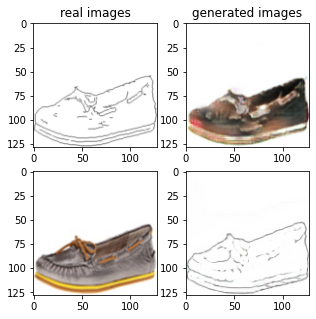

Train Epoch: 2 10% 	Total Loss: 1.327810 	Loss_G_AB: 0.313493	Loss_G_BA: 0.970146	Loss_cycle: 0.407761	Loss_D_A: 0.007392	Loss_D_B: 0.270838
1 55009 T:  1.570145606994629
Train Epoch: 2 10% 	Total Loss: 1.314352 	Loss_G_AB: 0.304661	Loss_G_BA: 1.036285	Loss_cycle: 0.394714	Loss_D_A: 0.005328	Loss_D_B: 0.243837
1 55019 T:  0.9367289543151855
Train Epoch: 2 10% 	Total Loss: 1.228193 	Loss_G_AB: 0.257381	Loss_G_BA: 1.011766	Loss_cycle: 0.334097	Loss_D_A: 0.003285	Loss_D_B: 0.256238
1 55029 T:  0.9411525726318359
Train Epoch: 2 10% 	Total Loss: 1.266073 	Loss_G_AB: 0.286997	Loss_G_BA: 0.993826	Loss_cycle: 0.362876	Loss_D_A: 0.001992	Loss_D_B: 0.260793
1 55039 T:  0.9419426918029785
Train Epoch: 2 10% 	Total Loss: 1.368241 	Loss_G_AB: 0.315326	Loss_G_BA: 1.013519	Loss_cycle: 0.459578	Loss_D_A: 0.002819	Loss_D_B: 0.241422
1 55049 T:  0.9480531215667725
Train Epoch: 2 11% 	Total Loss: 1.271781 	Loss_G_AB: 0.305346	Loss_G_BA: 0.969531	Loss_cycle: 0.388379	Loss_D_A: 0.002952	Loss_D_B: 0.243011


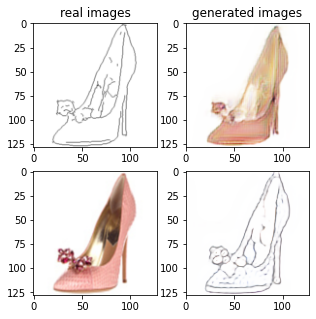

Train Epoch: 2 12% 	Total Loss: 1.262389 	Loss_G_AB: 0.273260	Loss_G_BA: 1.000322	Loss_cycle: 0.363922	Loss_D_A: 0.001065	Loss_D_B: 0.260611
1 56009 T:  1.6248300075531006
Train Epoch: 2 12% 	Total Loss: 1.307265 	Loss_G_AB: 0.280208	Loss_G_BA: 1.001088	Loss_cycle: 0.414736	Loss_D_A: 0.001165	Loss_D_B: 0.250717
1 56019 T:  0.9081573486328125
Train Epoch: 2 12% 	Total Loss: 1.208215 	Loss_G_AB: 0.290913	Loss_G_BA: 0.991337	Loss_cycle: 0.285086	Loss_D_A: 0.001915	Loss_D_B: 0.280089
1 56029 T:  0.9084517955780029
Train Epoch: 2 12% 	Total Loss: 1.173396 	Loss_G_AB: 0.270905	Loss_G_BA: 0.991294	Loss_cycle: 0.290174	Loss_D_A: 0.001165	Loss_D_B: 0.250957
1 56039 T:  0.9097819328308105
Train Epoch: 2 12% 	Total Loss: 1.166651 	Loss_G_AB: 0.304431	Loss_G_BA: 1.001893	Loss_cycle: 0.283394	Loss_D_A: 0.001957	Loss_D_B: 0.228138
1 56049 T:  0.9093420505523682
Train Epoch: 2 13% 	Total Loss: 1.209820 	Loss_G_AB: 0.269118	Loss_G_BA: 0.998490	Loss_cycle: 0.319161	Loss_D_A: 0.001628	Loss_D_B: 0.255227

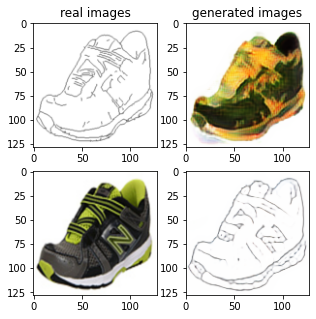

Train Epoch: 2 14% 	Total Loss: 1.223063 	Loss_G_AB: 0.306252	Loss_G_BA: 1.001956	Loss_cycle: 0.330258	Loss_D_A: 0.006916	Loss_D_B: 0.231785
1 57009 T:  1.5757393836975098
Train Epoch: 2 14% 	Total Loss: 1.210990 	Loss_G_AB: 0.300666	Loss_G_BA: 0.988002	Loss_cycle: 0.332044	Loss_D_A: 0.005819	Loss_D_B: 0.228793
1 57019 T:  0.9397091865539551
Train Epoch: 2 14% 	Total Loss: 1.428508 	Loss_G_AB: 0.266369	Loss_G_BA: 1.001764	Loss_cycle: 0.520775	Loss_D_A: 0.002794	Loss_D_B: 0.270872
1 57029 T:  0.9402143955230713
Train Epoch: 2 14% 	Total Loss: 1.227702 	Loss_G_AB: 0.305169	Loss_G_BA: 1.006825	Loss_cycle: 0.303841	Loss_D_A: 0.002685	Loss_D_B: 0.265178
1 57039 T:  0.9411368370056152
Train Epoch: 2 14% 	Total Loss: 1.280341 	Loss_G_AB: 0.276950	Loss_G_BA: 1.003419	Loss_cycle: 0.372396	Loss_D_A: 0.001365	Loss_D_B: 0.266395
1 57049 T:  0.9391078948974609
Train Epoch: 2 15% 	Total Loss: 1.254716 	Loss_G_AB: 0.281889	Loss_G_BA: 0.992701	Loss_cycle: 0.378416	Loss_D_A: 0.002645	Loss_D_B: 0.236360

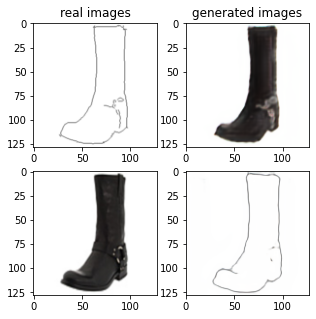

Train Epoch: 2 16% 	Total Loss: 1.198799 	Loss_G_AB: 0.293316	Loss_G_BA: 0.573473	Loss_cycle: 0.371474	Loss_D_A: 0.146768	Loss_D_B: 0.247162
1 58009 T:  1.5657200813293457
Train Epoch: 2 16% 	Total Loss: 1.313315 	Loss_G_AB: 0.288531	Loss_G_BA: 1.014487	Loss_cycle: 0.381296	Loss_D_A: 0.029236	Loss_D_B: 0.251274
1 58019 T:  0.942054271697998
Train Epoch: 2 16% 	Total Loss: 1.376796 	Loss_G_AB: 0.306046	Loss_G_BA: 1.020201	Loss_cycle: 0.416195	Loss_D_A: 0.019975	Loss_D_B: 0.277503
1 58029 T:  0.9516043663024902
Train Epoch: 2 16% 	Total Loss: 1.227506 	Loss_G_AB: 0.271349	Loss_G_BA: 0.893135	Loss_cycle: 0.374559	Loss_D_A: 0.015700	Loss_D_B: 0.255005
1 58039 T:  0.9389326572418213
Train Epoch: 2 17% 	Total Loss: 1.383799 	Loss_G_AB: 0.305123	Loss_G_BA: 0.985669	Loss_cycle: 0.469831	Loss_D_A: 0.035570	Loss_D_B: 0.233001
1 58049 T:  0.9383533000946045
Train Epoch: 2 17% 	Total Loss: 1.202979 	Loss_G_AB: 0.281169	Loss_G_BA: 0.935493	Loss_cycle: 0.323835	Loss_D_A: 0.028437	Loss_D_B: 0.242376


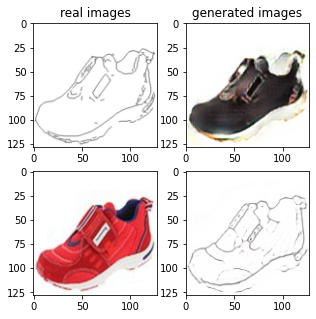

Train Epoch: 2 18% 	Total Loss: 1.366597 	Loss_G_AB: 0.352856	Loss_G_BA: 0.718360	Loss_cycle: 0.517042	Loss_D_A: 0.063367	Loss_D_B: 0.250580
1 59009 T:  1.5619611740112305
Train Epoch: 2 18% 	Total Loss: 1.220908 	Loss_G_AB: 0.301652	Loss_G_BA: 0.770669	Loss_cycle: 0.351071	Loss_D_A: 0.099068	Loss_D_B: 0.234609
1 59019 T:  0.9386622905731201
Train Epoch: 2 18% 	Total Loss: 1.268226 	Loss_G_AB: 0.351256	Loss_G_BA: 0.764425	Loss_cycle: 0.423230	Loss_D_A: 0.089432	Loss_D_B: 0.197724
1 59029 T:  0.9413979053497314
Train Epoch: 2 18% 	Total Loss: 1.298361 	Loss_G_AB: 0.318717	Loss_G_BA: 0.813833	Loss_cycle: 0.463712	Loss_D_A: 0.051771	Loss_D_B: 0.216604
1 59039 T:  0.9443774223327637
Train Epoch: 2 19% 	Total Loss: 1.352871 	Loss_G_AB: 0.274580	Loss_G_BA: 0.773679	Loss_cycle: 0.467360	Loss_D_A: 0.086754	Loss_D_B: 0.274627
1 59049 T:  0.9427754878997803
Train Epoch: 2 19% 	Total Loss: 1.402951 	Loss_G_AB: 0.317254	Loss_G_BA: 0.828508	Loss_cycle: 0.507044	Loss_D_A: 0.083947	Loss_D_B: 0.239079

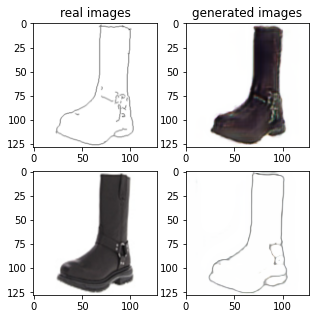

Train Epoch: 2 20% 	Total Loss: 1.402043 	Loss_G_AB: 0.349966	Loss_G_BA: 1.002417	Loss_cycle: 0.496558	Loss_D_A: 0.003105	Loss_D_B: 0.226188
1 60009 T:  1.58284330368042
Train Epoch: 2 20% 	Total Loss: 1.380557 	Loss_G_AB: 0.331416	Loss_G_BA: 0.992120	Loss_cycle: 0.487799	Loss_D_A: 0.003247	Loss_D_B: 0.227743
1 60019 T:  0.943913459777832
Train Epoch: 2 20% 	Total Loss: 1.279023 	Loss_G_AB: 0.306779	Loss_G_BA: 1.006947	Loss_cycle: 0.373888	Loss_D_A: 0.003150	Loss_D_B: 0.245121
1 60029 T:  0.9375684261322021
Train Epoch: 2 20% 	Total Loss: 1.371570 	Loss_G_AB: 0.389119	Loss_G_BA: 0.996178	Loss_cycle: 0.462718	Loss_D_A: 0.002868	Loss_D_B: 0.213335
1 60039 T:  0.949397087097168
Train Epoch: 2 21% 	Total Loss: 1.215626 	Loss_G_AB: 0.251173	Loss_G_BA: 0.999956	Loss_cycle: 0.308681	Loss_D_A: 0.006316	Loss_D_B: 0.275065
1 60049 T:  0.9385929107666016
Train Epoch: 2 21% 	Total Loss: 1.367401 	Loss_G_AB: 0.276168	Loss_G_BA: 1.002347	Loss_cycle: 0.455607	Loss_D_A: 0.005424	Loss_D_B: 0.267112
1 6

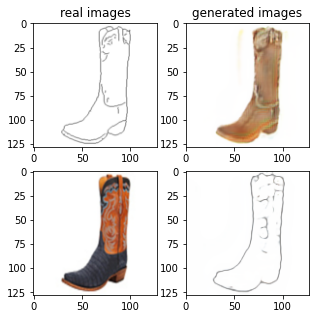

Train Epoch: 2 22% 	Total Loss: 1.365970 	Loss_G_AB: 0.373469	Loss_G_BA: 0.991700	Loss_cycle: 0.465646	Loss_D_A: 0.005817	Loss_D_B: 0.211922
1 61009 T:  1.5611059665679932
Train Epoch: 2 22% 	Total Loss: 1.489508 	Loss_G_AB: 0.262026	Loss_G_BA: 1.009048	Loss_cycle: 0.530584	Loss_D_A: 0.002118	Loss_D_B: 0.321269
1 61019 T:  0.9408268928527832
Train Epoch: 2 22% 	Total Loss: 1.366032 	Loss_G_AB: 0.353582	Loss_G_BA: 0.988541	Loss_cycle: 0.423589	Loss_D_A: 0.025463	Loss_D_B: 0.245918
1 61029 T:  0.9362640380859375
Train Epoch: 2 23% 	Total Loss: 1.234995 	Loss_G_AB: 0.382401	Loss_G_BA: 0.927547	Loss_cycle: 0.374433	Loss_D_A: 0.014882	Loss_D_B: 0.190705
1 61039 T:  0.9433267116546631
Train Epoch: 2 23% 	Total Loss: 1.403733 	Loss_G_AB: 0.293160	Loss_G_BA: 1.001509	Loss_cycle: 0.470352	Loss_D_A: 0.007058	Loss_D_B: 0.278989
1 61049 T:  0.9403352737426758
Train Epoch: 2 23% 	Total Loss: 1.192221 	Loss_G_AB: 0.334775	Loss_G_BA: 0.965723	Loss_cycle: 0.304218	Loss_D_A: 0.010311	Loss_D_B: 0.227443

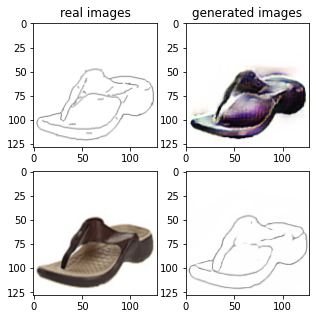

Train Epoch: 2 24% 	Total Loss: 1.379256 	Loss_G_AB: 0.315487	Loss_G_BA: 1.000656	Loss_cycle: 0.493055	Loss_D_A: 0.002577	Loss_D_B: 0.225552
1 62009 T:  1.614311695098877
Train Epoch: 2 24% 	Total Loss: 1.299253 	Loss_G_AB: 0.322459	Loss_G_BA: 1.007678	Loss_cycle: 0.395077	Loss_D_A: 0.002511	Loss_D_B: 0.236596
1 62019 T:  0.9094047546386719
Train Epoch: 2 24% 	Total Loss: 1.342699 	Loss_G_AB: 0.284603	Loss_G_BA: 0.998047	Loss_cycle: 0.460199	Loss_D_A: 0.002270	Loss_D_B: 0.238906
1 62029 T:  0.9077572822570801
Train Epoch: 2 25% 	Total Loss: 1.279185 	Loss_G_AB: 0.299376	Loss_G_BA: 0.987916	Loss_cycle: 0.373543	Loss_D_A: 0.001720	Loss_D_B: 0.260277
1 62039 T:  0.909315824508667
Train Epoch: 2 25% 	Total Loss: 1.277556 	Loss_G_AB: 0.338063	Loss_G_BA: 1.002511	Loss_cycle: 0.390050	Loss_D_A: 0.003910	Loss_D_B: 0.213309
1 62049 T:  0.9072961807250977
Train Epoch: 2 25% 	Total Loss: 1.384279 	Loss_G_AB: 0.325387	Loss_G_BA: 0.997176	Loss_cycle: 0.464155	Loss_D_A: 0.005795	Loss_D_B: 0.253047
1

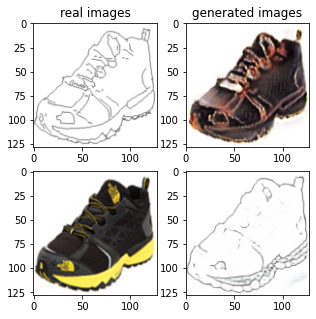

Train Epoch: 2 26% 	Total Loss: 1.334612 	Loss_G_AB: 0.273049	Loss_G_BA: 0.989441	Loss_cycle: 0.397990	Loss_D_A: 0.003339	Loss_D_B: 0.302037
1 63009 T:  1.568624496459961
Train Epoch: 2 26% 	Total Loss: 1.271930 	Loss_G_AB: 0.267465	Loss_G_BA: 0.973752	Loss_cycle: 0.353294	Loss_D_A: 0.023484	Loss_D_B: 0.274543
1 63019 T:  0.944739580154419
Train Epoch: 2 27% 	Total Loss: 1.208384 	Loss_G_AB: 0.335230	Loss_G_BA: 0.999720	Loss_cycle: 0.317395	Loss_D_A: 0.003869	Loss_D_B: 0.219645
1 63029 T:  0.9398579597473145
Train Epoch: 2 27% 	Total Loss: 1.142551 	Loss_G_AB: 0.312744	Loss_G_BA: 1.000998	Loss_cycle: 0.232649	Loss_D_A: 0.002070	Loss_D_B: 0.250961
1 63039 T:  0.9404518604278564
Train Epoch: 2 27% 	Total Loss: 1.409794 	Loss_G_AB: 0.325982	Loss_G_BA: 0.977434	Loss_cycle: 0.522544	Loss_D_A: 0.005145	Loss_D_B: 0.230397
1 63049 T:  0.9432854652404785
Train Epoch: 2 27% 	Total Loss: 1.376539 	Loss_G_AB: 0.332058	Loss_G_BA: 1.011335	Loss_cycle: 0.462710	Loss_D_A: 0.011539	Loss_D_B: 0.230594
1

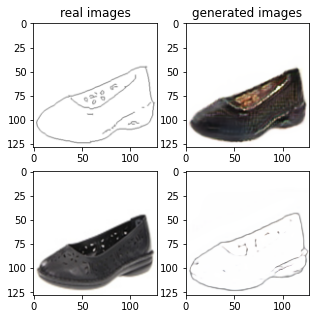

Train Epoch: 2 28% 	Total Loss: 1.249418 	Loss_G_AB: 0.351385	Loss_G_BA: 0.955868	Loss_cycle: 0.332168	Loss_D_A: 0.039659	Loss_D_B: 0.223965
1 64009 T:  1.5547308921813965
Train Epoch: 2 28% 	Total Loss: 1.375184 	Loss_G_AB: 0.388670	Loss_G_BA: 0.915693	Loss_cycle: 0.465760	Loss_D_A: 0.031703	Loss_D_B: 0.225540
1 64019 T:  0.9417052268981934
Train Epoch: 2 29% 	Total Loss: 1.239333 	Loss_G_AB: 0.327063	Loss_G_BA: 0.848493	Loss_cycle: 0.313346	Loss_D_A: 0.088358	Loss_D_B: 0.249851
1 64029 T:  0.9370994567871094
Train Epoch: 2 29% 	Total Loss: 1.393624 	Loss_G_AB: 0.332281	Loss_G_BA: 0.860614	Loss_cycle: 0.480328	Loss_D_A: 0.088233	Loss_D_B: 0.228616
1 64039 T:  0.9375967979431152
Train Epoch: 2 29% 	Total Loss: 1.334472 	Loss_G_AB: 0.339043	Loss_G_BA: 1.056913	Loss_cycle: 0.402071	Loss_D_A: 0.029862	Loss_D_B: 0.204562
1 64049 T:  0.9458112716674805
Train Epoch: 2 29% 	Total Loss: 1.342927 	Loss_G_AB: 0.312830	Loss_G_BA: 1.010602	Loss_cycle: 0.444850	Loss_D_A: 0.004251	Loss_D_B: 0.232109

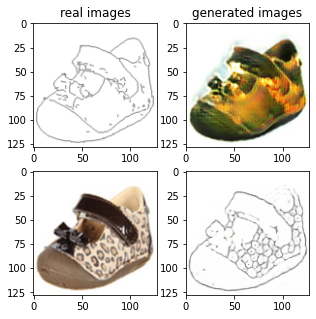

Train Epoch: 2 30% 	Total Loss: 1.247401 	Loss_G_AB: 0.329562	Loss_G_BA: 1.008801	Loss_cycle: 0.358445	Loss_D_A: 0.001958	Loss_D_B: 0.217817
1 65009 T:  1.5933384895324707
Train Epoch: 2 30% 	Total Loss: 1.208231 	Loss_G_AB: 0.308809	Loss_G_BA: 0.998454	Loss_cycle: 0.303052	Loss_D_A: 0.002344	Loss_D_B: 0.249204
1 65019 T:  0.9470129013061523
Train Epoch: 2 31% 	Total Loss: 1.235790 	Loss_G_AB: 0.312112	Loss_G_BA: 0.996190	Loss_cycle: 0.334152	Loss_D_A: 0.001477	Loss_D_B: 0.246009
1 65029 T:  0.9426233768463135
Train Epoch: 2 31% 	Total Loss: 1.284739 	Loss_G_AB: 0.279828	Loss_G_BA: 1.002899	Loss_cycle: 0.404637	Loss_D_A: 0.001926	Loss_D_B: 0.236812
1 65039 T:  0.9475293159484863
Train Epoch: 2 31% 	Total Loss: 1.294490 	Loss_G_AB: 0.309705	Loss_G_BA: 0.988396	Loss_cycle: 0.376967	Loss_D_A: 0.004110	Loss_D_B: 0.264363
1 65049 T:  0.9397492408752441
Train Epoch: 2 31% 	Total Loss: 1.224393 	Loss_G_AB: 0.296064	Loss_G_BA: 1.007038	Loss_cycle: 0.324448	Loss_D_A: 0.002214	Loss_D_B: 0.246180

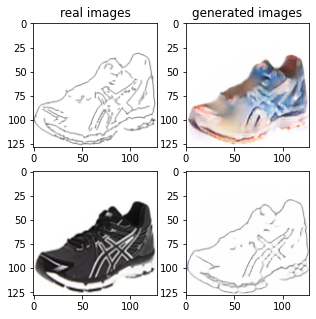

Train Epoch: 2 32% 	Total Loss: 1.314492 	Loss_G_AB: 0.342678	Loss_G_BA: 1.007100	Loss_cycle: 0.369958	Loss_D_A: 0.001954	Loss_D_B: 0.267691
1 66009 T:  1.5909836292266846
Train Epoch: 2 33% 	Total Loss: 1.265545 	Loss_G_AB: 0.276963	Loss_G_BA: 0.976741	Loss_cycle: 0.380634	Loss_D_A: 0.002024	Loss_D_B: 0.256035
1 66019 T:  0.9467055797576904
Train Epoch: 2 33% 	Total Loss: 1.294426 	Loss_G_AB: 0.326168	Loss_G_BA: 1.021242	Loss_cycle: 0.408550	Loss_D_A: 0.004505	Loss_D_B: 0.207666
1 66029 T:  0.9421200752258301
Train Epoch: 2 33% 	Total Loss: 1.274012 	Loss_G_AB: 0.329638	Loss_G_BA: 0.997487	Loss_cycle: 0.385723	Loss_D_A: 0.002548	Loss_D_B: 0.222178
1 66039 T:  0.9435217380523682
Train Epoch: 2 33% 	Total Loss: 1.239938 	Loss_G_AB: 0.308688	Loss_G_BA: 1.000548	Loss_cycle: 0.354913	Loss_D_A: 0.003611	Loss_D_B: 0.226796
1 66049 T:  0.9660191535949707
Train Epoch: 2 33% 	Total Loss: 1.249808 	Loss_G_AB: 0.308434	Loss_G_BA: 0.983112	Loss_cycle: 0.348999	Loss_D_A: 0.017963	Loss_D_B: 0.237073

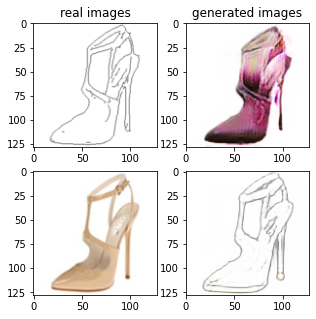

Train Epoch: 2 34% 	Total Loss: 1.211098 	Loss_G_AB: 0.292484	Loss_G_BA: 0.983605	Loss_cycle: 0.328733	Loss_D_A: 0.003040	Loss_D_B: 0.241280
1 67009 T:  1.5579650402069092
Train Epoch: 2 35% 	Total Loss: 1.312474 	Loss_G_AB: 0.322720	Loss_G_BA: 0.999344	Loss_cycle: 0.436305	Loss_D_A: 0.005537	Loss_D_B: 0.209600
1 67019 T:  0.9467875957489014
Train Epoch: 2 35% 	Total Loss: 1.285802 	Loss_G_AB: 0.315029	Loss_G_BA: 0.993935	Loss_cycle: 0.396601	Loss_D_A: 0.001993	Loss_D_B: 0.232728
1 67029 T:  0.9437601566314697
Train Epoch: 2 35% 	Total Loss: 1.248639 	Loss_G_AB: 0.274106	Loss_G_BA: 1.004507	Loss_cycle: 0.334704	Loss_D_A: 0.001899	Loss_D_B: 0.272729
1 67039 T:  0.945030689239502
Train Epoch: 2 35% 	Total Loss: 1.274670 	Loss_G_AB: 0.368706	Loss_G_BA: 0.918267	Loss_cycle: 0.423045	Loss_D_A: 0.007076	Loss_D_B: 0.201063
1 67049 T:  0.9438097476959229
Train Epoch: 2 35% 	Total Loss: 1.236758 	Loss_G_AB: 0.317012	Loss_G_BA: 1.043246	Loss_cycle: 0.319564	Loss_D_A: 0.018004	Loss_D_B: 0.219061


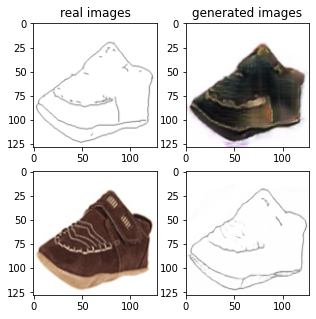

Train Epoch: 2 36% 	Total Loss: 1.246750 	Loss_G_AB: 0.274576	Loss_G_BA: 1.025178	Loss_cycle: 0.336688	Loss_D_A: 0.004729	Loss_D_B: 0.255457
1 68009 T:  1.630305290222168
Train Epoch: 2 37% 	Total Loss: 1.292227 	Loss_G_AB: 0.325185	Loss_G_BA: 0.982874	Loss_cycle: 0.385268	Loss_D_A: 0.003639	Loss_D_B: 0.249291
1 68019 T:  0.9167165756225586
Train Epoch: 2 37% 	Total Loss: 1.297651 	Loss_G_AB: 0.291041	Loss_G_BA: 0.981800	Loss_cycle: 0.400597	Loss_D_A: 0.011822	Loss_D_B: 0.248812
1 68029 T:  0.9109683036804199
Train Epoch: 2 37% 	Total Loss: 1.274339 	Loss_G_AB: 0.262016	Loss_G_BA: 0.988916	Loss_cycle: 0.385014	Loss_D_A: 0.007307	Loss_D_B: 0.256551
1 68039 T:  0.9136929512023926
Train Epoch: 2 37% 	Total Loss: 1.278009 	Loss_G_AB: 0.315176	Loss_G_BA: 0.989943	Loss_cycle: 0.376507	Loss_D_A: 0.012142	Loss_D_B: 0.236800
1 68049 T:  0.9089937210083008
Train Epoch: 2 37% 	Total Loss: 1.363648 	Loss_G_AB: 0.315156	Loss_G_BA: 1.001748	Loss_cycle: 0.470201	Loss_D_A: 0.016634	Loss_D_B: 0.218361


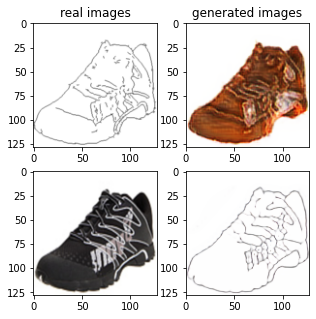

Train Epoch: 2 39% 	Total Loss: 1.301348 	Loss_G_AB: 0.313815	Loss_G_BA: 1.017132	Loss_cycle: 0.376465	Loss_D_A: 0.003958	Loss_D_B: 0.255452
1 69009 T:  1.5746421813964844
Train Epoch: 2 39% 	Total Loss: 1.285912 	Loss_G_AB: 0.287072	Loss_G_BA: 0.999895	Loss_cycle: 0.383331	Loss_D_A: 0.002151	Loss_D_B: 0.256947
1 69019 T:  0.9464879035949707
Train Epoch: 2 39% 	Total Loss: 1.202669 	Loss_G_AB: 0.271696	Loss_G_BA: 0.996774	Loss_cycle: 0.317572	Loss_D_A: 0.004115	Loss_D_B: 0.246748
1 69029 T:  0.9383115768432617
Train Epoch: 2 39% 	Total Loss: 1.195049 	Loss_G_AB: 0.309790	Loss_G_BA: 1.005209	Loss_cycle: 0.294705	Loss_D_A: 0.001588	Loss_D_B: 0.241256
1 69039 T:  0.9372618198394775
Train Epoch: 2 39% 	Total Loss: 1.207485 	Loss_G_AB: 0.285219	Loss_G_BA: 0.995912	Loss_cycle: 0.326052	Loss_D_A: 0.001582	Loss_D_B: 0.239286
1 69049 T:  0.938178539276123
Train Epoch: 2 39% 	Total Loss: 1.286967 	Loss_G_AB: 0.271369	Loss_G_BA: 1.001456	Loss_cycle: 0.382944	Loss_D_A: 0.001638	Loss_D_B: 0.265973


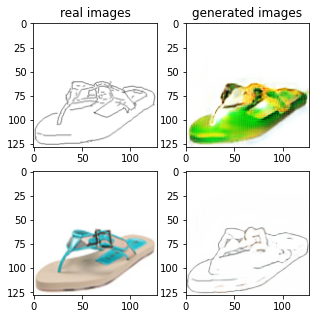

Train Epoch: 2 41% 	Total Loss: 1.401711 	Loss_G_AB: 0.330391	Loss_G_BA: 1.035434	Loss_cycle: 0.473846	Loss_D_A: 0.003200	Loss_D_B: 0.241753
1 70009 T:  1.572389841079712
Train Epoch: 2 41% 	Total Loss: 1.250300 	Loss_G_AB: 0.344108	Loss_G_BA: 1.008393	Loss_cycle: 0.357340	Loss_D_A: 0.003692	Loss_D_B: 0.213018
1 70019 T:  0.9323055744171143
Train Epoch: 2 41% 	Total Loss: 1.225003 	Loss_G_AB: 0.253308	Loss_G_BA: 1.001136	Loss_cycle: 0.339510	Loss_D_A: 0.002150	Loss_D_B: 0.256121
1 70029 T:  0.9435403347015381
Train Epoch: 2 41% 	Total Loss: 1.289095 	Loss_G_AB: 0.344964	Loss_G_BA: 0.993472	Loss_cycle: 0.390568	Loss_D_A: 0.003497	Loss_D_B: 0.225813
1 70039 T:  0.9454343318939209
Train Epoch: 2 41% 	Total Loss: 1.209929 	Loss_G_AB: 0.291406	Loss_G_BA: 0.967920	Loss_cycle: 0.343484	Loss_D_A: 0.009823	Loss_D_B: 0.226959
1 70049 T:  0.9426112174987793
Train Epoch: 2 41% 	Total Loss: 1.245321 	Loss_G_AB: 0.330419	Loss_G_BA: 0.996084	Loss_cycle: 0.372018	Loss_D_A: 0.004767	Loss_D_B: 0.205284


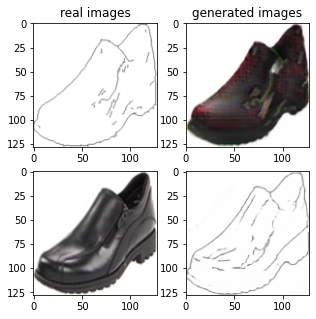

Train Epoch: 2 43% 	Total Loss: 1.234841 	Loss_G_AB: 0.323937	Loss_G_BA: 0.996509	Loss_cycle: 0.328817	Loss_D_A: 0.002995	Loss_D_B: 0.242805
1 71009 T:  1.5843894481658936
Train Epoch: 2 43% 	Total Loss: 1.242752 	Loss_G_AB: 0.313158	Loss_G_BA: 0.970295	Loss_cycle: 0.371526	Loss_D_A: 0.009365	Loss_D_B: 0.220134
1 71019 T:  0.9471468925476074
Train Epoch: 2 43% 	Total Loss: 1.455392 	Loss_G_AB: 0.458561	Loss_G_BA: 0.548605	Loss_cycle: 0.437006	Loss_D_A: 0.330647	Loss_D_B: 0.184156
1 71029 T:  0.9486637115478516
Train Epoch: 2 43% 	Total Loss: 1.268661 	Loss_G_AB: 0.270691	Loss_G_BA: 0.297186	Loss_cycle: 0.459003	Loss_D_A: 0.237547	Loss_D_B: 0.288172
1 71039 T:  0.9551849365234375
Train Epoch: 2 43% 	Total Loss: 1.313290 	Loss_G_AB: 0.298665	Loss_G_BA: 0.394303	Loss_cycle: 0.463734	Loss_D_A: 0.245031	Loss_D_B: 0.258041
1 71049 T:  0.941211462020874
Train Epoch: 2 43% 	Total Loss: 1.174610 	Loss_G_AB: 0.375172	Loss_G_BA: 0.411285	Loss_cycle: 0.377944	Loss_D_A: 0.187742	Loss_D_B: 0.215695


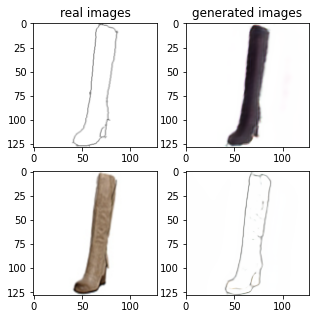

Train Epoch: 2 45% 	Total Loss: 1.248958 	Loss_G_AB: 0.316539	Loss_G_BA: 1.003946	Loss_cycle: 0.320617	Loss_D_A: 0.001645	Loss_D_B: 0.266454
1 72009 T:  1.5880837440490723
Train Epoch: 2 45% 	Total Loss: 1.251067 	Loss_G_AB: 0.288266	Loss_G_BA: 0.997574	Loss_cycle: 0.343138	Loss_D_A: 0.000969	Loss_D_B: 0.264040
1 72019 T:  0.9404904842376709
Train Epoch: 2 45% 	Total Loss: 1.194659 	Loss_G_AB: 0.326631	Loss_G_BA: 1.003427	Loss_cycle: 0.300382	Loss_D_A: 0.001040	Loss_D_B: 0.228208
1 72029 T:  0.9417998790740967
Train Epoch: 2 45% 	Total Loss: 1.253685 	Loss_G_AB: 0.341206	Loss_G_BA: 0.997156	Loss_cycle: 0.307943	Loss_D_A: 0.000985	Loss_D_B: 0.275575
1 72039 T:  0.943833589553833
Train Epoch: 2 45% 	Total Loss: 1.338100 	Loss_G_AB: 0.318236	Loss_G_BA: 1.003052	Loss_cycle: 0.422249	Loss_D_A: 0.001188	Loss_D_B: 0.254019
1 72049 T:  0.9412615299224854
Train Epoch: 2 45% 	Total Loss: 1.340152 	Loss_G_AB: 0.379566	Loss_G_BA: 0.989780	Loss_cycle: 0.367842	Loss_D_A: 0.001543	Loss_D_B: 0.286094


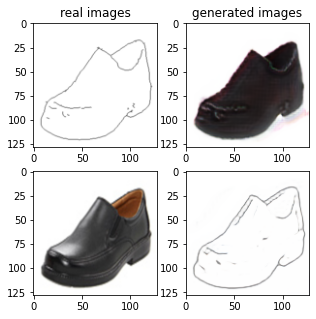

Train Epoch: 2 47% 	Total Loss: 1.278217 	Loss_G_AB: 0.319158	Loss_G_BA: 0.995635	Loss_cycle: 0.373268	Loss_D_A: 0.002492	Loss_D_B: 0.245061
1 73009 T:  1.6187243461608887
Train Epoch: 2 47% 	Total Loss: 1.166626 	Loss_G_AB: 0.309265	Loss_G_BA: 1.001417	Loss_cycle: 0.287238	Loss_D_A: 0.003434	Loss_D_B: 0.220613
1 73019 T:  0.9461252689361572
Train Epoch: 2 47% 	Total Loss: 1.193623 	Loss_G_AB: 0.307324	Loss_G_BA: 0.993556	Loss_cycle: 0.324402	Loss_D_A: 0.001984	Loss_D_B: 0.216797
1 73029 T:  0.9444608688354492
Train Epoch: 2 47% 	Total Loss: 1.258404 	Loss_G_AB: 0.331610	Loss_G_BA: 1.005516	Loss_cycle: 0.372696	Loss_D_A: 0.001510	Loss_D_B: 0.215635
1 73039 T:  0.9519898891448975
Train Epoch: 2 47% 	Total Loss: 1.282993 	Loss_G_AB: 0.373601	Loss_G_BA: 1.000080	Loss_cycle: 0.392438	Loss_D_A: 0.001455	Loss_D_B: 0.202259
1 73049 T:  0.9456288814544678
Train Epoch: 2 47% 	Total Loss: 1.229252 	Loss_G_AB: 0.329627	Loss_G_BA: 0.990407	Loss_cycle: 0.326101	Loss_D_A: 0.002764	Loss_D_B: 0.240370

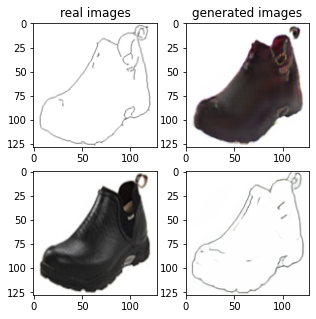

Train Epoch: 2 49% 	Total Loss: 1.319981 	Loss_G_AB: 0.285031	Loss_G_BA: 0.995926	Loss_cycle: 0.420227	Loss_D_A: 0.001894	Loss_D_B: 0.257382
1 74009 T:  1.6723036766052246
Train Epoch: 2 49% 	Total Loss: 1.214274 	Loss_G_AB: 0.299377	Loss_G_BA: 0.998075	Loss_cycle: 0.318253	Loss_D_A: 0.001953	Loss_D_B: 0.245341
1 74019 T:  0.9159379005432129
Train Epoch: 2 49% 	Total Loss: 1.232817 	Loss_G_AB: 0.309416	Loss_G_BA: 0.993831	Loss_cycle: 0.359576	Loss_D_A: 0.001796	Loss_D_B: 0.219821
1 74029 T:  0.9132106304168701
Train Epoch: 2 49% 	Total Loss: 1.290311 	Loss_G_AB: 0.314625	Loss_G_BA: 0.985710	Loss_cycle: 0.392089	Loss_D_A: 0.012117	Loss_D_B: 0.235938
1 74039 T:  0.9155361652374268
Train Epoch: 2 49% 	Total Loss: 1.278022 	Loss_G_AB: 0.309447	Loss_G_BA: 0.988496	Loss_cycle: 0.373354	Loss_D_A: 0.016803	Loss_D_B: 0.238893
1 74049 T:  0.9135711193084717
Train Epoch: 2 49% 	Total Loss: 1.226783 	Loss_G_AB: 0.264603	Loss_G_BA: 0.973368	Loss_cycle: 0.328899	Loss_D_A: 0.022165	Loss_D_B: 0.256734

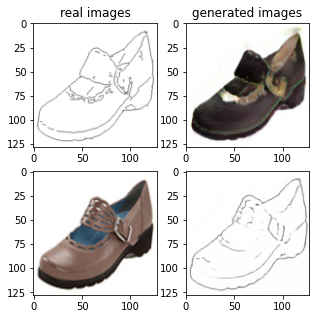

Train Epoch: 2 51% 	Total Loss: 1.212738 	Loss_G_AB: 0.321930	Loss_G_BA: 0.993622	Loss_cycle: 0.328885	Loss_D_A: 0.002131	Loss_D_B: 0.223946
1 75009 T:  1.6258015632629395
Train Epoch: 2 51% 	Total Loss: 1.356616 	Loss_G_AB: 0.317299	Loss_G_BA: 0.997257	Loss_cycle: 0.445371	Loss_D_A: 0.001800	Loss_D_B: 0.252167
1 75019 T:  0.9497494697570801
Train Epoch: 2 51% 	Total Loss: 1.284810 	Loss_G_AB: 0.254556	Loss_G_BA: 1.007466	Loss_cycle: 0.358137	Loss_D_A: 0.001421	Loss_D_B: 0.294240
1 75029 T:  0.946760892868042
Train Epoch: 2 51% 	Total Loss: 1.233717 	Loss_G_AB: 0.284343	Loss_G_BA: 0.994360	Loss_cycle: 0.317416	Loss_D_A: 0.001712	Loss_D_B: 0.275238
1 75039 T:  0.9530484676361084
Train Epoch: 2 51% 	Total Loss: 1.246326 	Loss_G_AB: 0.311466	Loss_G_BA: 1.004681	Loss_cycle: 0.344782	Loss_D_A: 0.002316	Loss_D_B: 0.241154
1 75049 T:  0.9501438140869141
Train Epoch: 2 51% 	Total Loss: 1.215345 	Loss_G_AB: 0.331547	Loss_G_BA: 0.995780	Loss_cycle: 0.339511	Loss_D_A: 0.002381	Loss_D_B: 0.209790


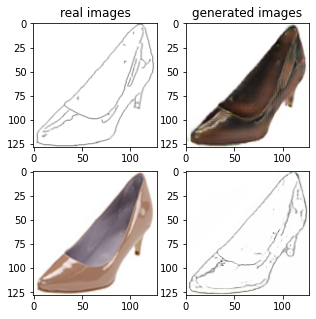

Train Epoch: 2 53% 	Total Loss: 1.131399 	Loss_G_AB: 0.303308	Loss_G_BA: 0.395663	Loss_cycle: 0.379109	Loss_D_A: 0.163751	Loss_D_B: 0.239055
1 76009 T:  1.6218392848968506
Train Epoch: 2 53% 	Total Loss: 1.255031 	Loss_G_AB: 0.279741	Loss_G_BA: 0.585568	Loss_cycle: 0.393892	Loss_D_A: 0.168411	Loss_D_B: 0.260074
1 76019 T:  0.9497931003570557
Train Epoch: 2 53% 	Total Loss: 1.294353 	Loss_G_AB: 0.343187	Loss_G_BA: 0.748522	Loss_cycle: 0.459466	Loss_D_A: 0.067461	Loss_D_B: 0.221570
1 76029 T:  0.945817232131958
Train Epoch: 2 53% 	Total Loss: 1.247437 	Loss_G_AB: 0.311608	Loss_G_BA: 1.017143	Loss_cycle: 0.341295	Loss_D_A: 0.018320	Loss_D_B: 0.223446
1 76039 T:  0.9569125175476074
Train Epoch: 2 53% 	Total Loss: 1.462744 	Loss_G_AB: 0.381771	Loss_G_BA: 0.772388	Loss_cycle: 0.442271	Loss_D_A: 0.169149	Loss_D_B: 0.274244
1 76049 T:  0.9534041881561279
Train Epoch: 2 53% 	Total Loss: 1.311042 	Loss_G_AB: 0.363080	Loss_G_BA: 0.686787	Loss_cycle: 0.380244	Loss_D_A: 0.134010	Loss_D_B: 0.271855


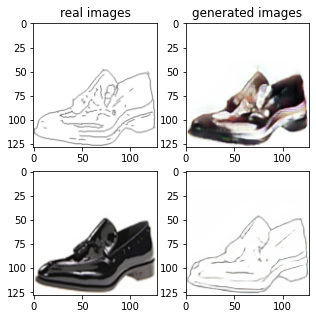

Train Epoch: 2 55% 	Total Loss: 1.315954 	Loss_G_AB: 0.402596	Loss_G_BA: 1.010054	Loss_cycle: 0.380462	Loss_D_A: 0.002701	Loss_D_B: 0.226466
1 77009 T:  1.615262508392334
Train Epoch: 2 55% 	Total Loss: 1.358967 	Loss_G_AB: 0.331836	Loss_G_BA: 0.995778	Loss_cycle: 0.447325	Loss_D_A: 0.002413	Loss_D_B: 0.245422
1 77019 T:  0.9462611675262451
Train Epoch: 2 55% 	Total Loss: 1.181321 	Loss_G_AB: 0.280031	Loss_G_BA: 1.000175	Loss_cycle: 0.275311	Loss_D_A: 0.001365	Loss_D_B: 0.264542
1 77029 T:  0.9453935623168945
Train Epoch: 2 55% 	Total Loss: 1.247954 	Loss_G_AB: 0.311134	Loss_G_BA: 1.005246	Loss_cycle: 0.363697	Loss_D_A: 0.001408	Loss_D_B: 0.224659
1 77039 T:  0.9509575366973877
Train Epoch: 2 55% 	Total Loss: 1.374255 	Loss_G_AB: 0.378968	Loss_G_BA: 0.993692	Loss_cycle: 0.437586	Loss_D_A: 0.001830	Loss_D_B: 0.248509
1 77049 T:  0.9579613208770752
Train Epoch: 2 55% 	Total Loss: 1.307871 	Loss_G_AB: 0.399755	Loss_G_BA: 0.993344	Loss_cycle: 0.369936	Loss_D_A: 0.001786	Loss_D_B: 0.239599


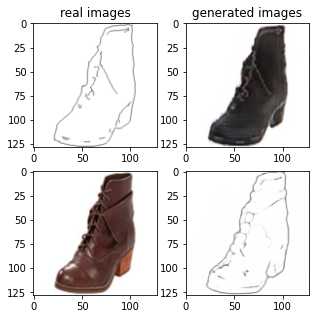

Train Epoch: 2 57% 	Total Loss: 1.191156 	Loss_G_AB: 0.319395	Loss_G_BA: 1.009760	Loss_cycle: 0.290618	Loss_D_A: 0.002072	Loss_D_B: 0.233888
1 78009 T:  1.646958827972412
Train Epoch: 2 57% 	Total Loss: 1.299250 	Loss_G_AB: 0.295627	Loss_G_BA: 0.989995	Loss_cycle: 0.425750	Loss_D_A: 0.003334	Loss_D_B: 0.227356
1 78019 T:  0.953557014465332
Train Epoch: 2 57% 	Total Loss: 1.266932 	Loss_G_AB: 0.384665	Loss_G_BA: 1.004306	Loss_cycle: 0.336826	Loss_D_A: 0.002332	Loss_D_B: 0.233288
1 78029 T:  0.9594690799713135
Train Epoch: 2 57% 	Total Loss: 1.256503 	Loss_G_AB: 0.270656	Loss_G_BA: 0.997583	Loss_cycle: 0.365431	Loss_D_A: 0.002061	Loss_D_B: 0.254892
1 78039 T:  0.9600174427032471
Train Epoch: 2 57% 	Total Loss: 1.230979 	Loss_G_AB: 0.340371	Loss_G_BA: 1.002134	Loss_cycle: 0.314746	Loss_D_A: 0.001157	Loss_D_B: 0.243824
1 78049 T:  0.9540541172027588
Train Epoch: 2 57% 	Total Loss: 1.253595 	Loss_G_AB: 0.371507	Loss_G_BA: 0.986739	Loss_cycle: 0.348435	Loss_D_A: 0.002687	Loss_D_B: 0.223349
1

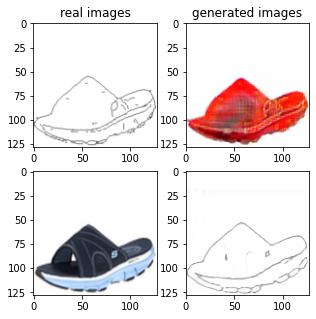

Train Epoch: 2 59% 	Total Loss: 1.229362 	Loss_G_AB: 0.338670	Loss_G_BA: 1.001412	Loss_cycle: 0.376379	Loss_D_A: 0.003892	Loss_D_B: 0.179050
1 79009 T:  1.615818738937378
Train Epoch: 2 59% 	Total Loss: 1.250060 	Loss_G_AB: 0.263454	Loss_G_BA: 1.012738	Loss_cycle: 0.341597	Loss_D_A: 0.003270	Loss_D_B: 0.267097
1 79019 T:  0.9496059417724609
Train Epoch: 2 59% 	Total Loss: 1.226395 	Loss_G_AB: 0.317479	Loss_G_BA: 0.993233	Loss_cycle: 0.295860	Loss_D_A: 0.001816	Loss_D_B: 0.273363
1 79029 T:  0.9473376274108887
Train Epoch: 2 59% 	Total Loss: 1.263648 	Loss_G_AB: 0.342485	Loss_G_BA: 0.997926	Loss_cycle: 0.334599	Loss_D_A: 0.001714	Loss_D_B: 0.257129
1 79039 T:  0.9543576240539551
Train Epoch: 2 59% 	Total Loss: 1.194876 	Loss_G_AB: 0.273795	Loss_G_BA: 1.006640	Loss_cycle: 0.296322	Loss_D_A: 0.002291	Loss_D_B: 0.256046
1 79049 T:  0.944486141204834
Train Epoch: 2 59% 	Total Loss: 1.357147 	Loss_G_AB: 0.296398	Loss_G_BA: 1.010846	Loss_cycle: 0.464255	Loss_D_A: 0.001304	Loss_D_B: 0.237966
1

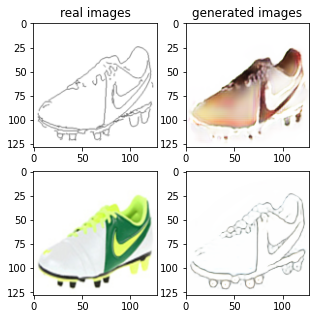

Train Epoch: 2 61% 	Total Loss: 1.332882 	Loss_G_AB: 0.324604	Loss_G_BA: 1.001079	Loss_cycle: 0.440836	Loss_D_A: 0.002016	Loss_D_B: 0.227189
1 80009 T:  1.685882568359375
Train Epoch: 2 61% 	Total Loss: 1.329825 	Loss_G_AB: 0.304993	Loss_G_BA: 1.010435	Loss_cycle: 0.417539	Loss_D_A: 0.003127	Loss_D_B: 0.251446
1 80019 T:  0.9169399738311768
Train Epoch: 2 61% 	Total Loss: 1.286384 	Loss_G_AB: 0.260861	Loss_G_BA: 0.993162	Loss_cycle: 0.391212	Loss_D_A: 0.002406	Loss_D_B: 0.265754
1 80029 T:  0.9150979518890381
Train Epoch: 2 61% 	Total Loss: 1.177743 	Loss_G_AB: 0.364544	Loss_G_BA: 0.985349	Loss_cycle: 0.288837	Loss_D_A: 0.001886	Loss_D_B: 0.212073
1 80039 T:  0.9248042106628418
Train Epoch: 2 61% 	Total Loss: 1.338214 	Loss_G_AB: 0.345300	Loss_G_BA: 1.012464	Loss_cycle: 0.420619	Loss_D_A: 0.001370	Loss_D_B: 0.237343
1 80049 T:  0.9236493110656738
Train Epoch: 2 61% 	Total Loss: 1.254076 	Loss_G_AB: 0.293171	Loss_G_BA: 0.994626	Loss_cycle: 0.368727	Loss_D_A: 0.000831	Loss_D_B: 0.240619


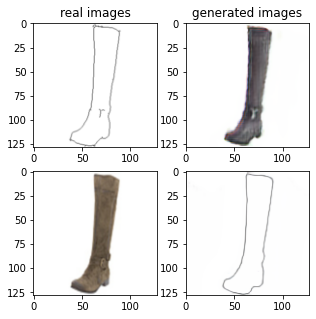

Train Epoch: 2 63% 	Total Loss: 1.393723 	Loss_G_AB: 0.351007	Loss_G_BA: 0.928147	Loss_cycle: 0.421754	Loss_D_A: 0.103762	Loss_D_B: 0.228630
1 81009 T:  1.6115508079528809
Train Epoch: 2 63% 	Total Loss: 1.217465 	Loss_G_AB: 0.326093	Loss_G_BA: 0.861719	Loss_cycle: 0.341012	Loss_D_A: 0.067100	Loss_D_B: 0.215447
1 81019 T:  0.9512722492218018
Train Epoch: 2 63% 	Total Loss: 1.337882 	Loss_G_AB: 0.341887	Loss_G_BA: 0.957526	Loss_cycle: 0.473470	Loss_D_A: 0.010579	Loss_D_B: 0.204127
1 81029 T:  0.9478943347930908
Train Epoch: 2 63% 	Total Loss: 1.267187 	Loss_G_AB: 0.320039	Loss_G_BA: 0.926170	Loss_cycle: 0.367252	Loss_D_A: 0.040257	Loss_D_B: 0.236573
1 81039 T:  0.9548892974853516
Train Epoch: 2 63% 	Total Loss: 1.319874 	Loss_G_AB: 0.413015	Loss_G_BA: 1.020358	Loss_cycle: 0.405488	Loss_D_A: 0.004824	Loss_D_B: 0.192876
1 81049 T:  0.9472661018371582
Train Epoch: 2 63% 	Total Loss: 1.333455 	Loss_G_AB: 0.264459	Loss_G_BA: 0.990259	Loss_cycle: 0.408617	Loss_D_A: 0.002675	Loss_D_B: 0.294804

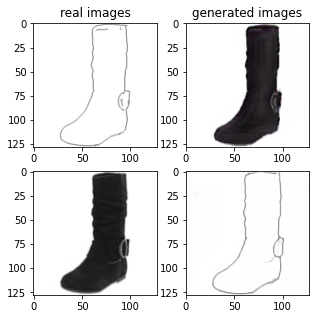

Train Epoch: 2 65% 	Total Loss: 1.263759 	Loss_G_AB: 0.301642	Loss_G_BA: 1.003433	Loss_cycle: 0.368102	Loss_D_A: 0.003572	Loss_D_B: 0.239548
1 82009 T:  1.6095166206359863
Train Epoch: 2 65% 	Total Loss: 1.216977 	Loss_G_AB: 0.291031	Loss_G_BA: 0.998474	Loss_cycle: 0.329562	Loss_D_A: 0.003602	Loss_D_B: 0.239061
1 82019 T:  0.9515554904937744
Train Epoch: 2 65% 	Total Loss: 1.178294 	Loss_G_AB: 0.361174	Loss_G_BA: 0.987839	Loss_cycle: 0.272655	Loss_D_A: 0.002578	Loss_D_B: 0.228554
1 82029 T:  0.9473438262939453
Train Epoch: 2 65% 	Total Loss: 1.285878 	Loss_G_AB: 0.290723	Loss_G_BA: 0.996388	Loss_cycle: 0.389208	Loss_D_A: 0.001602	Loss_D_B: 0.251514
1 82039 T:  0.9471862316131592
Train Epoch: 2 65% 	Total Loss: 1.170369 	Loss_G_AB: 0.320799	Loss_G_BA: 0.956498	Loss_cycle: 0.308718	Loss_D_A: 0.007914	Loss_D_B: 0.215089
1 82049 T:  0.9425296783447266
Train Epoch: 2 65% 	Total Loss: 1.267473 	Loss_G_AB: 0.350502	Loss_G_BA: 0.974396	Loss_cycle: 0.354230	Loss_D_A: 0.003216	Loss_D_B: 0.247578

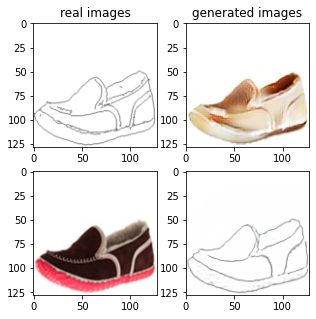

Train Epoch: 2 67% 	Total Loss: 1.377343 	Loss_G_AB: 0.297391	Loss_G_BA: 1.010791	Loss_cycle: 0.454687	Loss_D_A: 0.001518	Loss_D_B: 0.267047
1 83009 T:  1.5894906520843506
Train Epoch: 2 67% 	Total Loss: 1.245791 	Loss_G_AB: 0.402954	Loss_G_BA: 0.986524	Loss_cycle: 0.314973	Loss_D_A: 0.002471	Loss_D_B: 0.233608
1 83019 T:  0.9488711357116699
Train Epoch: 2 67% 	Total Loss: 1.287798 	Loss_G_AB: 0.336071	Loss_G_BA: 1.001278	Loss_cycle: 0.347349	Loss_D_A: 0.003577	Loss_D_B: 0.268197
1 83029 T:  0.9465079307556152
Train Epoch: 2 67% 	Total Loss: 1.313046 	Loss_G_AB: 0.295770	Loss_G_BA: 1.007074	Loss_cycle: 0.340061	Loss_D_A: 0.003570	Loss_D_B: 0.317992
1 83039 T:  0.9457724094390869
Train Epoch: 2 67% 	Total Loss: 1.193635 	Loss_G_AB: 0.288871	Loss_G_BA: 0.996681	Loss_cycle: 0.295627	Loss_D_A: 0.002614	Loss_D_B: 0.252618
1 83049 T:  0.9495036602020264
Train Epoch: 2 67% 	Total Loss: 1.330584 	Loss_G_AB: 0.275430	Loss_G_BA: 0.994473	Loss_cycle: 0.419707	Loss_D_A: 0.002100	Loss_D_B: 0.273826

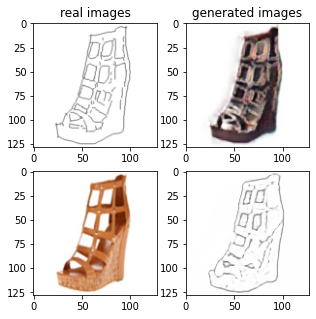

Train Epoch: 2 69% 	Total Loss: 1.236096 	Loss_G_AB: 0.286679	Loss_G_BA: 0.994696	Loss_cycle: 0.327274	Loss_D_A: 0.003453	Loss_D_B: 0.264682
1 84009 T:  1.5875401496887207
Train Epoch: 2 69% 	Total Loss: 1.213396 	Loss_G_AB: 0.319175	Loss_G_BA: 1.003884	Loss_cycle: 0.332626	Loss_D_A: 0.001858	Loss_D_B: 0.217382
1 84019 T:  0.9417719841003418
Train Epoch: 2 69% 	Total Loss: 1.215218 	Loss_G_AB: 0.317034	Loss_G_BA: 0.996980	Loss_cycle: 0.327556	Loss_D_A: 0.000848	Loss_D_B: 0.229808
1 84029 T:  0.9433422088623047
Train Epoch: 2 69% 	Total Loss: 1.299413 	Loss_G_AB: 0.313077	Loss_G_BA: 1.001479	Loss_cycle: 0.401447	Loss_D_A: 0.003004	Loss_D_B: 0.237683
1 84039 T:  0.9546217918395996
Train Epoch: 2 69% 	Total Loss: 1.285079 	Loss_G_AB: 0.409513	Loss_G_BA: 0.995963	Loss_cycle: 0.411998	Loss_D_A: 0.002739	Loss_D_B: 0.167604
1 84049 T:  0.9429686069488525
Train Epoch: 2 69% 	Total Loss: 1.347360 	Loss_G_AB: 0.246066	Loss_G_BA: 1.002003	Loss_cycle: 0.378819	Loss_D_A: 0.002780	Loss_D_B: 0.341726

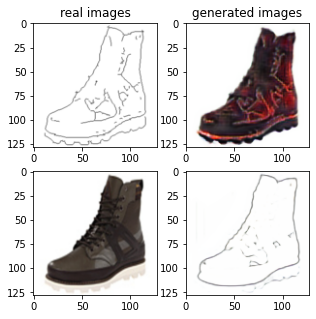

Train Epoch: 2 71% 	Total Loss: 1.260787 	Loss_G_AB: 0.296845	Loss_G_BA: 0.990169	Loss_cycle: 0.354467	Loss_D_A: 0.001576	Loss_D_B: 0.261238
1 85009 T:  1.603428840637207
Train Epoch: 2 71% 	Total Loss: 1.207825 	Loss_G_AB: 0.380002	Loss_G_BA: 0.994850	Loss_cycle: 0.329461	Loss_D_A: 0.001579	Loss_D_B: 0.189359
1 85019 T:  0.9479598999023438
Train Epoch: 2 71% 	Total Loss: 1.332003 	Loss_G_AB: 0.383446	Loss_G_BA: 0.976015	Loss_cycle: 0.396717	Loss_D_A: 0.002383	Loss_D_B: 0.253173
1 85029 T:  0.9447858333587646
Train Epoch: 2 71% 	Total Loss: 1.227944 	Loss_G_AB: 0.313859	Loss_G_BA: 1.005720	Loss_cycle: 0.305571	Loss_D_A: 0.006552	Loss_D_B: 0.256031
1 85039 T:  0.9425787925720215
Train Epoch: 2 71% 	Total Loss: 1.194580 	Loss_G_AB: 0.334547	Loss_G_BA: 0.985204	Loss_cycle: 0.325759	Loss_D_A: 0.003897	Loss_D_B: 0.205048
1 85049 T:  0.9460983276367188
Train Epoch: 2 71% 	Total Loss: 1.174133 	Loss_G_AB: 0.316457	Loss_G_BA: 0.985698	Loss_cycle: 0.297162	Loss_D_A: 0.001758	Loss_D_B: 0.224136


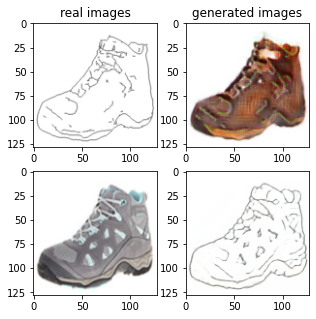

Train Epoch: 2 73% 	Total Loss: 1.311775 	Loss_G_AB: 0.360231	Loss_G_BA: 1.001496	Loss_cycle: 0.417375	Loss_D_A: 0.001430	Loss_D_B: 0.212107
1 86009 T:  1.6795449256896973
Train Epoch: 2 73% 	Total Loss: 1.267231 	Loss_G_AB: 0.479844	Loss_G_BA: 0.965972	Loss_cycle: 0.368109	Loss_D_A: 0.006107	Loss_D_B: 0.170107
1 86019 T:  0.9250249862670898
Train Epoch: 2 73% 	Total Loss: 1.335459 	Loss_G_AB: 0.329349	Loss_G_BA: 0.974834	Loss_cycle: 0.411560	Loss_D_A: 0.005030	Loss_D_B: 0.266778
1 86029 T:  0.9200162887573242
Train Epoch: 2 73% 	Total Loss: 1.356533 	Loss_G_AB: 0.344847	Loss_G_BA: 0.943487	Loss_cycle: 0.395530	Loss_D_A: 0.095531	Loss_D_B: 0.221305
1 86039 T:  0.920957088470459
Train Epoch: 2 73% 	Total Loss: 1.251869 	Loss_G_AB: 0.315216	Loss_G_BA: 1.000062	Loss_cycle: 0.350036	Loss_D_A: 0.011835	Loss_D_B: 0.232359
1 86049 T:  0.9211089611053467
Train Epoch: 2 73% 	Total Loss: 1.150796 	Loss_G_AB: 0.288124	Loss_G_BA: 0.932327	Loss_cycle: 0.260208	Loss_D_A: 0.012223	Loss_D_B: 0.268139


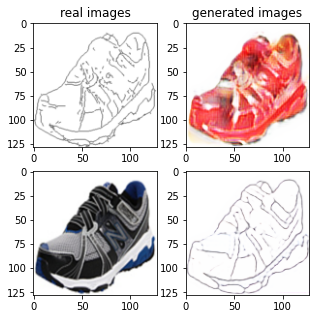

Train Epoch: 2 75% 	Total Loss: 1.297767 	Loss_G_AB: 0.418299	Loss_G_BA: 1.000249	Loss_cycle: 0.371471	Loss_D_A: 0.001499	Loss_D_B: 0.215524
1 87009 T:  1.5919713973999023
Train Epoch: 2 75% 	Total Loss: 1.190378 	Loss_G_AB: 0.336767	Loss_G_BA: 0.999648	Loss_cycle: 0.262140	Loss_D_A: 0.001394	Loss_D_B: 0.258636
1 87019 T:  0.9314541816711426
Train Epoch: 2 75% 	Total Loss: 1.323616 	Loss_G_AB: 0.339792	Loss_G_BA: 1.002694	Loss_cycle: 0.402316	Loss_D_A: 0.001195	Loss_D_B: 0.248862
1 87029 T:  0.9555578231811523
Train Epoch: 2 75% 	Total Loss: 1.279177 	Loss_G_AB: 0.308569	Loss_G_BA: 1.002167	Loss_cycle: 0.381768	Loss_D_A: 0.001070	Loss_D_B: 0.240971
1 87039 T:  0.9544985294342041
Train Epoch: 2 75% 	Total Loss: 1.226421 	Loss_G_AB: 0.323963	Loss_G_BA: 1.003352	Loss_cycle: 0.323750	Loss_D_A: 0.001004	Loss_D_B: 0.238010
1 87049 T:  0.9480302333831787
Train Epoch: 2 75% 	Total Loss: 1.152130 	Loss_G_AB: 0.298603	Loss_G_BA: 1.005637	Loss_cycle: 0.258844	Loss_D_A: 0.001051	Loss_D_B: 0.240114

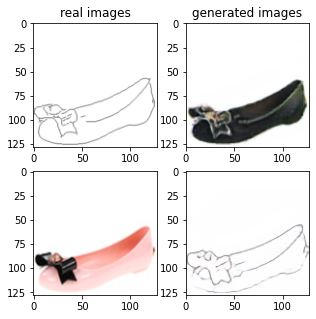

Train Epoch: 2 77% 	Total Loss: 1.214170 	Loss_G_AB: 0.334439	Loss_G_BA: 1.011355	Loss_cycle: 0.280008	Loss_D_A: 0.002468	Loss_D_B: 0.258798
1 88009 T:  1.6103134155273438
Train Epoch: 2 77% 	Total Loss: 1.266132 	Loss_G_AB: 0.337652	Loss_G_BA: 1.003463	Loss_cycle: 0.350955	Loss_D_A: 0.001858	Loss_D_B: 0.242762
1 88019 T:  0.9491720199584961
Train Epoch: 2 77% 	Total Loss: 1.201045 	Loss_G_AB: 0.335573	Loss_G_BA: 0.993335	Loss_cycle: 0.341006	Loss_D_A: 0.002739	Loss_D_B: 0.192847
1 88029 T:  0.9483649730682373
Train Epoch: 2 77% 	Total Loss: 1.230809 	Loss_G_AB: 0.333693	Loss_G_BA: 1.001128	Loss_cycle: 0.342622	Loss_D_A: 0.001944	Loss_D_B: 0.218832
1 88039 T:  0.9487180709838867
Train Epoch: 2 77% 	Total Loss: 1.160624 	Loss_G_AB: 0.301822	Loss_G_BA: 1.003655	Loss_cycle: 0.261974	Loss_D_A: 0.002327	Loss_D_B: 0.243585
1 88049 T:  0.9550776481628418
Train Epoch: 2 77% 	Total Loss: 1.216841 	Loss_G_AB: 0.301878	Loss_G_BA: 1.001039	Loss_cycle: 0.318415	Loss_D_A: 0.001467	Loss_D_B: 0.245501

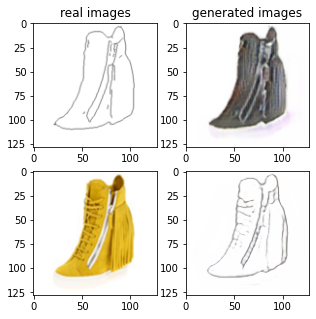

Train Epoch: 2 79% 	Total Loss: 1.218005 	Loss_G_AB: 0.268615	Loss_G_BA: 1.017080	Loss_cycle: 0.322186	Loss_D_A: 0.002545	Loss_D_B: 0.250427
1 89009 T:  1.5835340023040771
Train Epoch: 2 79% 	Total Loss: 1.291036 	Loss_G_AB: 0.299096	Loss_G_BA: 0.996493	Loss_cycle: 0.408940	Loss_D_A: 0.003874	Loss_D_B: 0.230427
1 89019 T:  0.9460980892181396
Train Epoch: 2 79% 	Total Loss: 1.331546 	Loss_G_AB: 0.390386	Loss_G_BA: 0.993609	Loss_cycle: 0.414760	Loss_D_A: 0.002092	Loss_D_B: 0.222697
1 89029 T:  0.9552261829376221
Train Epoch: 2 79% 	Total Loss: 1.354375 	Loss_G_AB: 0.333671	Loss_G_BA: 1.006423	Loss_cycle: 0.439459	Loss_D_A: 0.004021	Loss_D_B: 0.240847
1 89039 T:  0.9449491500854492
Train Epoch: 2 79% 	Total Loss: 1.225479 	Loss_G_AB: 0.320787	Loss_G_BA: 0.991521	Loss_cycle: 0.307479	Loss_D_A: 0.004586	Loss_D_B: 0.257260
1 89049 T:  0.944645881652832
Train Epoch: 2 79% 	Total Loss: 1.227540 	Loss_G_AB: 0.337120	Loss_G_BA: 0.997345	Loss_cycle: 0.322980	Loss_D_A: 0.004855	Loss_D_B: 0.232472


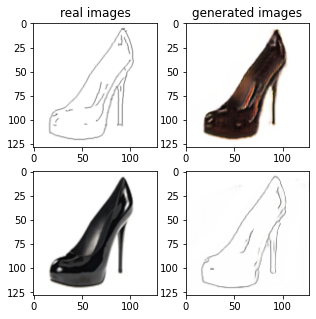

Train Epoch: 2 81% 	Total Loss: 1.277868 	Loss_G_AB: 0.301605	Loss_G_BA: 0.714156	Loss_cycle: 0.404898	Loss_D_A: 0.121678	Loss_D_B: 0.243410
1 90009 T:  1.587139368057251
Train Epoch: 2 81% 	Total Loss: 1.236926 	Loss_G_AB: 0.292799	Loss_G_BA: 0.737660	Loss_cycle: 0.340085	Loss_D_A: 0.127040	Loss_D_B: 0.254570
1 90019 T:  0.9477226734161377
Train Epoch: 2 81% 	Total Loss: 1.255160 	Loss_G_AB: 0.317355	Loss_G_BA: 0.767321	Loss_cycle: 0.385112	Loss_D_A: 0.102492	Loss_D_B: 0.225218
1 90029 T:  0.9441108703613281
Train Epoch: 2 81% 	Total Loss: 1.273823 	Loss_G_AB: 0.383433	Loss_G_BA: 0.865937	Loss_cycle: 0.388863	Loss_D_A: 0.064552	Loss_D_B: 0.195722
1 90039 T:  0.944422721862793
Train Epoch: 2 81% 	Total Loss: 1.491052 	Loss_G_AB: 0.298343	Loss_G_BA: 0.979494	Loss_cycle: 0.517195	Loss_D_A: 0.058351	Loss_D_B: 0.276588
1 90049 T:  0.9389803409576416
Train Epoch: 2 81% 	Total Loss: 1.175618 	Loss_G_AB: 0.299912	Loss_G_BA: 0.857501	Loss_cycle: 0.311525	Loss_D_A: 0.038268	Loss_D_B: 0.247118
1

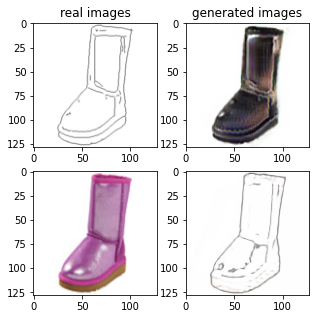

Train Epoch: 2 83% 	Total Loss: 1.309367 	Loss_G_AB: 0.380172	Loss_G_BA: 0.985177	Loss_cycle: 0.387959	Loss_D_A: 0.005571	Loss_D_B: 0.233162
1 91009 T:  1.5781276226043701
Train Epoch: 2 83% 	Total Loss: 1.332033 	Loss_G_AB: 0.302368	Loss_G_BA: 1.024790	Loss_cycle: 0.418407	Loss_D_A: 0.003334	Loss_D_B: 0.246713
1 91019 T:  0.9405505657196045
Train Epoch: 2 83% 	Total Loss: 1.185427 	Loss_G_AB: 0.338208	Loss_G_BA: 1.009937	Loss_cycle: 0.305409	Loss_D_A: 0.002899	Loss_D_B: 0.203046
1 91029 T:  0.9489402770996094
Train Epoch: 2 83% 	Total Loss: 1.173047 	Loss_G_AB: 0.307499	Loss_G_BA: 0.981540	Loss_cycle: 0.284028	Loss_D_A: 0.003618	Loss_D_B: 0.240882
1 91039 T:  0.9442391395568848
Train Epoch: 2 83% 	Total Loss: 1.272555 	Loss_G_AB: 0.425848	Loss_G_BA: 0.962658	Loss_cycle: 0.394070	Loss_D_A: 0.004799	Loss_D_B: 0.179433
1 91049 T:  0.9471783638000488
Train Epoch: 2 83% 	Total Loss: 1.271956 	Loss_G_AB: 0.274570	Loss_G_BA: 0.987713	Loss_cycle: 0.337965	Loss_D_A: 0.021285	Loss_D_B: 0.281564

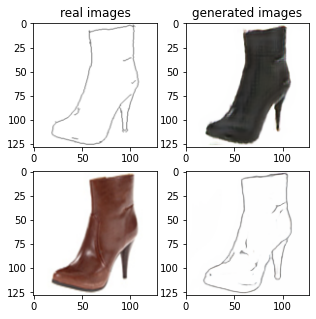

Train Epoch: 2 85% 	Total Loss: 1.228520 	Loss_G_AB: 0.338362	Loss_G_BA: 1.004125	Loss_cycle: 0.329866	Loss_D_A: 0.001884	Loss_D_B: 0.225526
1 92009 T:  1.6515085697174072
Train Epoch: 2 85% 	Total Loss: 1.223202 	Loss_G_AB: 0.256908	Loss_G_BA: 0.995284	Loss_cycle: 0.295666	Loss_D_A: 0.002463	Loss_D_B: 0.298977
1 92019 T:  0.9181344509124756
Train Epoch: 2 85% 	Total Loss: 1.129223 	Loss_G_AB: 0.290217	Loss_G_BA: 0.918912	Loss_cycle: 0.253690	Loss_D_A: 0.029566	Loss_D_B: 0.241403
1 92029 T:  0.9151461124420166
Train Epoch: 2 85% 	Total Loss: 1.214023 	Loss_G_AB: 0.321853	Loss_G_BA: 1.044728	Loss_cycle: 0.291209	Loss_D_A: 0.011236	Loss_D_B: 0.228287
1 92039 T:  0.9163954257965088
Train Epoch: 2 85% 	Total Loss: 1.190734 	Loss_G_AB: 0.332978	Loss_G_BA: 0.993686	Loss_cycle: 0.284413	Loss_D_A: 0.002075	Loss_D_B: 0.240914
1 92049 T:  0.9169788360595703
Train Epoch: 2 85% 	Total Loss: 1.211175 	Loss_G_AB: 0.319296	Loss_G_BA: 1.009613	Loss_cycle: 0.296586	Loss_D_A: 0.001735	Loss_D_B: 0.248400

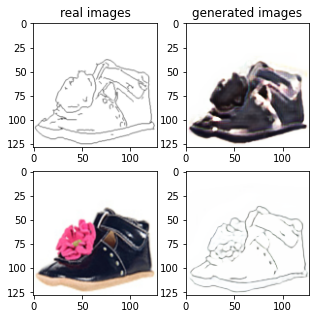

Train Epoch: 2 87% 	Total Loss: 1.351867 	Loss_G_AB: 0.296117	Loss_G_BA: 0.972859	Loss_cycle: 0.431180	Loss_D_A: 0.003139	Loss_D_B: 0.283061
1 93009 T:  1.5783483982086182
Train Epoch: 2 87% 	Total Loss: 1.258873 	Loss_G_AB: 0.324710	Loss_G_BA: 0.984309	Loss_cycle: 0.342579	Loss_D_A: 0.010212	Loss_D_B: 0.251572
1 93019 T:  0.93961501121521
Train Epoch: 2 87% 	Total Loss: 1.345049 	Loss_G_AB: 0.380937	Loss_G_BA: 0.950834	Loss_cycle: 0.444336	Loss_D_A: 0.037478	Loss_D_B: 0.197349
1 93029 T:  0.9464237689971924
Train Epoch: 2 87% 	Total Loss: 1.191544 	Loss_G_AB: 0.339737	Loss_G_BA: 0.896195	Loss_cycle: 0.333548	Loss_D_A: 0.024022	Loss_D_B: 0.216008
1 93039 T:  0.9436399936676025
Train Epoch: 2 87% 	Total Loss: 1.264260 	Loss_G_AB: 0.328721	Loss_G_BA: 0.899719	Loss_cycle: 0.320309	Loss_D_A: 0.066598	Loss_D_B: 0.263133
1 93049 T:  0.9383866786956787
Train Epoch: 2 87% 	Total Loss: 1.142472 	Loss_G_AB: 0.303492	Loss_G_BA: 0.733815	Loss_cycle: 0.248428	Loss_D_A: 0.124018	Loss_D_B: 0.251373
1

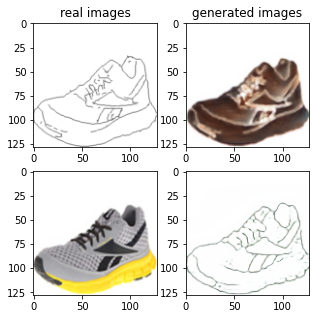

Train Epoch: 2 89% 	Total Loss: 1.275771 	Loss_G_AB: 0.317204	Loss_G_BA: 0.987788	Loss_cycle: 0.394500	Loss_D_A: 0.012330	Loss_D_B: 0.216446
1 94009 T:  1.593238115310669
Train Epoch: 2 89% 	Total Loss: 1.348921 	Loss_G_AB: 0.372712	Loss_G_BA: 1.043192	Loss_cycle: 0.411181	Loss_D_A: 0.026462	Loss_D_B: 0.203325
1 94019 T:  0.9396276473999023
Train Epoch: 2 89% 	Total Loss: 1.126822 	Loss_G_AB: 0.301268	Loss_G_BA: 0.824299	Loss_cycle: 0.302220	Loss_D_A: 0.050656	Loss_D_B: 0.211161
1 94029 T:  0.9380466938018799
Train Epoch: 2 89% 	Total Loss: 1.252551 	Loss_G_AB: 0.275049	Loss_G_BA: 0.796894	Loss_cycle: 0.341632	Loss_D_A: 0.096331	Loss_D_B: 0.278617
1 94039 T:  0.9410018920898438
Train Epoch: 2 89% 	Total Loss: 1.124630 	Loss_G_AB: 0.291706	Loss_G_BA: 0.696557	Loss_cycle: 0.287499	Loss_D_A: 0.102099	Loss_D_B: 0.240900
1 94049 T:  0.9402594566345215
Train Epoch: 2 89% 	Total Loss: 1.304266 	Loss_G_AB: 0.326465	Loss_G_BA: 0.903577	Loss_cycle: 0.435759	Loss_D_A: 0.021493	Loss_D_B: 0.231993


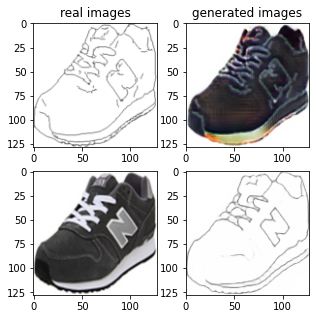

Train Epoch: 2 91% 	Total Loss: 1.281827 	Loss_G_AB: 0.297435	Loss_G_BA: 1.001587	Loss_cycle: 0.371787	Loss_D_A: 0.004647	Loss_D_B: 0.255883
1 95009 T:  1.5891835689544678
Train Epoch: 2 91% 	Total Loss: 1.218496 	Loss_G_AB: 0.289637	Loss_G_BA: 0.985438	Loss_cycle: 0.351176	Loss_D_A: 0.002295	Loss_D_B: 0.227487
1 95019 T:  0.9379723072052002
Train Epoch: 2 91% 	Total Loss: 1.214942 	Loss_G_AB: 0.328850	Loss_G_BA: 0.946422	Loss_cycle: 0.324534	Loss_D_A: 0.019515	Loss_D_B: 0.233256
1 95029 T:  0.9367289543151855
Train Epoch: 2 91% 	Total Loss: 1.249507 	Loss_G_AB: 0.298959	Loss_G_BA: 0.999358	Loss_cycle: 0.337661	Loss_D_A: 0.018516	Loss_D_B: 0.244171
1 95039 T:  0.9418778419494629
Train Epoch: 2 91% 	Total Loss: 1.201312 	Loss_G_AB: 0.358720	Loss_G_BA: 1.015113	Loss_cycle: 0.310992	Loss_D_A: 0.002400	Loss_D_B: 0.201004
1 95049 T:  0.9451415538787842
Train Epoch: 2 91% 	Total Loss: 1.215004 	Loss_G_AB: 0.251705	Loss_G_BA: 0.950347	Loss_cycle: 0.294689	Loss_D_A: 0.004064	Loss_D_B: 0.315226

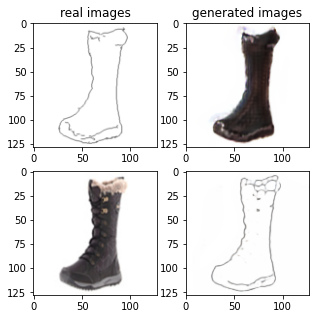

Train Epoch: 2 93% 	Total Loss: 1.200683 	Loss_G_AB: 0.307116	Loss_G_BA: 1.002251	Loss_cycle: 0.304897	Loss_D_A: 0.001306	Loss_D_B: 0.239796
1 96009 T:  1.6108345985412598
Train Epoch: 2 93% 	Total Loss: 1.167274 	Loss_G_AB: 0.288060	Loss_G_BA: 0.995551	Loss_cycle: 0.277194	Loss_D_A: 0.001396	Loss_D_B: 0.246879
1 96019 T:  0.9503486156463623
Train Epoch: 2 93% 	Total Loss: 1.199581 	Loss_G_AB: 0.273342	Loss_G_BA: 1.002807	Loss_cycle: 0.319216	Loss_D_A: 0.003657	Loss_D_B: 0.238633
1 96029 T:  0.955763578414917
Train Epoch: 2 93% 	Total Loss: 1.200836 	Loss_G_AB: 0.318962	Loss_G_BA: 0.975353	Loss_cycle: 0.309993	Loss_D_A: 0.005356	Loss_D_B: 0.238329
1 96039 T:  0.955763578414917
Train Epoch: 2 93% 	Total Loss: 1.218266 	Loss_G_AB: 0.302873	Loss_G_BA: 1.001452	Loss_cycle: 0.348631	Loss_D_A: 0.001462	Loss_D_B: 0.216011
1 96049 T:  0.9530410766601562
Train Epoch: 2 93% 	Total Loss: 1.179371 	Loss_G_AB: 0.366901	Loss_G_BA: 0.991844	Loss_cycle: 0.306063	Loss_D_A: 0.002183	Loss_D_B: 0.191752
1

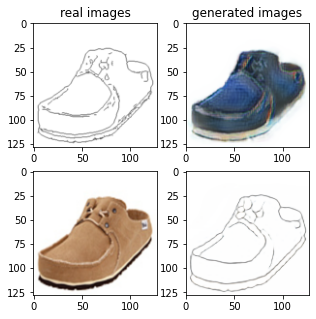

Train Epoch: 2 95% 	Total Loss: 1.270011 	Loss_G_AB: 0.463082	Loss_G_BA: 0.997175	Loss_cycle: 0.337859	Loss_D_A: 0.001548	Loss_D_B: 0.200475
1 97009 T:  1.5966579914093018
Train Epoch: 2 95% 	Total Loss: 1.272865 	Loss_G_AB: 0.343687	Loss_G_BA: 0.995029	Loss_cycle: 0.358426	Loss_D_A: 0.001525	Loss_D_B: 0.243554
1 97019 T:  0.9423744678497314
Train Epoch: 2 95% 	Total Loss: 1.230398 	Loss_G_AB: 0.317752	Loss_G_BA: 1.003290	Loss_cycle: 0.311972	Loss_D_A: 0.002533	Loss_D_B: 0.255372
1 97029 T:  0.9388265609741211
Train Epoch: 2 95% 	Total Loss: 1.194348 	Loss_G_AB: 0.317801	Loss_G_BA: 1.008880	Loss_cycle: 0.298336	Loss_D_A: 0.001839	Loss_D_B: 0.230832
1 97039 T:  0.9486343860626221
Train Epoch: 2 95% 	Total Loss: 1.192637 	Loss_G_AB: 0.325416	Loss_G_BA: 1.000073	Loss_cycle: 0.302156	Loss_D_A: 0.001666	Loss_D_B: 0.226071
1 97049 T:  0.9425256252288818
Train Epoch: 2 95% 	Total Loss: 1.211816 	Loss_G_AB: 0.345240	Loss_G_BA: 0.993406	Loss_cycle: 0.337268	Loss_D_A: 0.001161	Loss_D_B: 0.204063

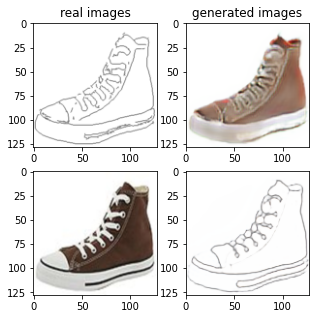

Train Epoch: 2 97% 	Total Loss: 1.195987 	Loss_G_AB: 0.325689	Loss_G_BA: 0.995747	Loss_cycle: 0.303352	Loss_D_A: 0.001094	Loss_D_B: 0.230823
1 98009 T:  1.6385643482208252
Train Epoch: 2 97% 	Total Loss: 1.126033 	Loss_G_AB: 0.295230	Loss_G_BA: 0.996110	Loss_cycle: 0.254658	Loss_D_A: 0.001281	Loss_D_B: 0.224425
1 98019 T:  0.9229264259338379
Train Epoch: 2 97% 	Total Loss: 1.190112 	Loss_G_AB: 0.330237	Loss_G_BA: 0.982196	Loss_cycle: 0.267926	Loss_D_A: 0.001852	Loss_D_B: 0.264118
1 98029 T:  0.9134092330932617
Train Epoch: 2 97% 	Total Loss: 1.201234 	Loss_G_AB: 0.308819	Loss_G_BA: 0.998586	Loss_cycle: 0.301108	Loss_D_A: 0.001913	Loss_D_B: 0.244510
1 98039 T:  0.9165000915527344
Train Epoch: 2 97% 	Total Loss: 1.184848 	Loss_G_AB: 0.340811	Loss_G_BA: 1.012718	Loss_cycle: 0.280517	Loss_D_A: 0.005111	Loss_D_B: 0.222456
1 98049 T:  0.9171974658966064
Train Epoch: 2 97% 	Total Loss: 1.312027 	Loss_G_AB: 0.407188	Loss_G_BA: 0.998893	Loss_cycle: 0.396110	Loss_D_A: 0.001721	Loss_D_B: 0.211156

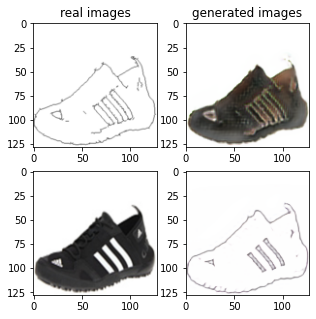

Train Epoch: 2 99% 	Total Loss: 1.179659 	Loss_G_AB: 0.325605	Loss_G_BA: 1.005696	Loss_cycle: 0.275204	Loss_D_A: 0.001333	Loss_D_B: 0.237472
1 99009 T:  1.5513339042663574
Train Epoch: 2 99% 	Total Loss: 1.208663 	Loss_G_AB: 0.323159	Loss_G_BA: 0.998515	Loss_cycle: 0.316182	Loss_D_A: 0.001158	Loss_D_B: 0.230486
1 99019 T:  0.9183449745178223
Train Epoch: 2 99% 	Total Loss: 1.130351 	Loss_G_AB: 0.273541	Loss_G_BA: 1.001767	Loss_cycle: 0.256290	Loss_D_A: 0.000670	Loss_D_B: 0.235738
1 99029 T:  0.9323258399963379
Train Epoch: 2 99% 	Total Loss: 1.251730 	Loss_G_AB: 0.418156	Loss_G_BA: 0.998543	Loss_cycle: 0.352698	Loss_D_A: 0.000866	Loss_D_B: 0.189817
1 99039 T:  0.9434607028961182
Train Epoch: 2 99% 	Total Loss: 1.256666 	Loss_G_AB: 0.404850	Loss_G_BA: 1.007363	Loss_cycle: 0.315853	Loss_D_A: 0.000784	Loss_D_B: 0.233922
1 99049 T:  0.9399676322937012
Train Epoch: 2 99% 	Total Loss: 1.395032 	Loss_G_AB: 0.265743	Loss_G_BA: 0.995328	Loss_cycle: 0.398259	Loss_D_A: 0.000920	Loss_D_B: 0.365319

In [ ]:
import warnings
warnings.filterwarnings("ignore")
from torch.autograd import Variable
from torch.utils import data
from torch.utils.data import DataLoader, TensorDataset
from torch import nn, optim
from datasets import *
from models import *
import argparse, os
import itertools
import torch
import time
import pdb
import matplotlib.pyplot as plt


# Training Configurations
# (You may put your needed configuration here. Please feel free to add more or use argparse. )
train_img_dir = './edges2shoes/train/'
img_shape = (3, 128, 128)
n_residual_blocks = 6
num_epochs = 2
batch_size = 1
lr_rate = 0.0002      # Adam optimizer learning rate
betas = (0.5, 0.999)  # Adam optimizer beta 1, beta 2
lambda_cyc = 10.0 	  # cycle loss weight
latent_dim = 8        # latent dimension for the encoded images from domain B
report_feq = 10        # Visualize image every 'report_feq' iters
visual_feq = 1000
save_feq = 1000      # Save models every 'save_feq' iters

# Random seeds (optional)
torch.manual_seed(1); np.random.seed(1)

# set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Normalize image tensor
def norm(image):
    return (image/255.0-0.5)*2.0

# Denormalize image tensor
def denorm(tensor):
    return ((tensor+1.0)/2.0)*255.0

train_dataset = Edge2Shoe(train_img_dir)
train_loader = data.DataLoader(train_dataset, batch_size=batch_size)
print('the length of training data:', len(train_dataset))
# Losses
criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()

cuda = torch.cuda.is_available()

input_shape = img_shape

# Initialize generator and discriminator
G_AB = GeneratorResNet(input_shape, n_residual_blocks)
G_BA = GeneratorResNet(input_shape, n_residual_blocks)
D_A = Discriminator(input_shape)
D_B = Discriminator(input_shape)


if cuda:
    G_AB = G_AB.to(device)
    G_BA = G_BA.to(device)
    D_A = D_A.to(device)
    D_B = D_B.to(device)
    criterion_GAN.to(device)
    criterion_cycle.to(device)

# Initialize weights
G_AB.apply(weights_init_normal)
G_BA.apply(weights_init_normal)
D_A.apply(weights_init_normal)
D_B.apply(weights_init_normal)



# Define optimizer
optimizer_G = torch.optim.Adam(itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=lr_rate, betas=betas)
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=lr_rate, betas=betas)
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=lr_rate, betas=betas)

# For adversarial loss
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

# loss recorder
running_loss_D_A = 0
running_loss_D_B = 0
running_loss_GAN_AB = 0
running_loss_GAN_BA = 0
running_loss_cycle = 0
running_total_loss = 0

loss_D_A_list = []
loss_D_B_list = []
loss_GAN_AB_list = []
loss_GAN_BA_list = []
loss_cycle_list = []
total_loss_list = []
# Training
total_steps = len(train_loader)*num_epochs; step = 0
for e in range(num_epochs):
    start = time.time()
    for idx, data in enumerate(train_loader):
        ########## Process Inputs ##########
        edge_tensor, rgb_tensor = data
        edge_tensor, rgb_tensor = norm(edge_tensor).to(device), norm(rgb_tensor).to(device)
        real_A = edge_tensor; real_B = rgb_tensor;

        # Adversarial ground truths
        valid = Variable(Tensor(np.ones((real_A.size(0), *D_A.output_shape))), requires_grad=False)
        fake = Variable(Tensor(np.zeros((real_A.size(0), *D_A.output_shape))), requires_grad=False)

        # ------------------
        #  Train Generators
        # ------------------
        G_AB.train(); G_BA.train()
        optimizer_G.zero_grad()

        # Generator loss
        loss_GAN_AB, fake_B = loss_generator(G_AB, real_A, D_B, valid, criterion_GAN)
        loss_GAN_BA, fake_A = loss_generator(G_BA, real_B, D_A, valid, criterion_GAN)
        loss_GAN = (loss_GAN_AB + loss_GAN_BA) / 2

        # Cycle loss
        loss_cycle_A = loss_cycle_consis(G_BA, fake_B, real_A, criterion_cycle)
        loss_cycle_B = loss_cycle_consis(G_AB, fake_A, real_B, criterion_cycle)
        loss_cycle = (loss_cycle_A + loss_cycle_B) / 2

        # Total loss
        loss_G = loss_GAN + lambda_cyc * loss_cycle

        loss_G.backward()
        optimizer_G.step()


        # -----------------------
        #  Train Discriminator A
        # -----------------------

        optimizer_D_A.zero_grad()

        # function to compute loss_D_A
        loss_D_A = loss_discriminator(fake_A, D_A, real_A, valid, fake, criterion_GAN)
        loss_D_A = loss_D_A / 2
        # update the D_A network
        loss_D_A.backward()
        optimizer_D_A.step()


        # -----------------------
        #  Train Discriminator B
        # -----------------------
        optimizer_D_B.zero_grad()

        # function to compute loss_D_A
        loss_D_B = loss_discriminator(fake_B, D_B, real_B, valid, fake, criterion_GAN)
        loss_D_B = loss_D_B / 2
        # update the D_B network
        loss_D_B.backward()
        optimizer_D_B.step()


        



        running_total_loss += (loss_GAN + lambda_cyc * loss_cycle + loss_D_A + loss_D_B).item()

        running_loss_GAN_AB += loss_GAN_AB.item()
        running_loss_GAN_BA += loss_GAN_BA.item()
        running_loss_D_A += loss_D_A.item()
        running_loss_D_B += loss_D_B.item()
        running_loss_cycle += lambda_cyc * loss_cycle.item()
        ########## Visualization ##########
        if step % report_feq == report_feq-1:
            print('Train Epoch: {} {:.0f}% \tTotal Loss: {:.6f} \tLoss_G_AB: {:.6f}\tLoss_G_BA: {:.6f}\tLoss_cycle: {:.6f}\tLoss_D_A: {:.6f}\tLoss_D_B: {:.6f}'.format
                    (e+1, 100. * idx / len(train_loader), running_total_loss / report_feq, 
                    running_loss_GAN_AB/report_feq, running_loss_GAN_BA/report_feq, 
                    running_loss_cycle/report_feq, running_loss_D_A/report_feq, 
                    running_loss_D_B/report_feq))
            loss_D_A_list.append(running_loss_D_A)
            loss_D_B_list.append(running_loss_D_B)
            loss_GAN_AB_list.append(loss_GAN_AB)
            loss_GAN_BA_list.append(loss_GAN_BA)
            loss_cycle_list.append(running_loss_cycle)

            running_loss_D_A = 0
            running_loss_D_B = 0
            running_loss_GAN_AB = 0
            running_loss_GAN_BA = 0
            running_loss_cycle = 0
            running_total_loss = 0
            end = time.time()
            print(e, step, 'T: ', end-start)
            start = end
        ########## Visualize Generated images ##########
        if step % visual_feq == 0:
            vis_fake_A = denorm(fake_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_fake_B = denorm(fake_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_B = denorm(real_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_A = denorm(real_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            fig, axs = plt.subplots(2,2, figsize = (5,5))	
            
            axs[0,0].imshow(vis_real_A.transpose(1,2,0))
            axs[0,0].set_title('real images')
            axs[0,1].imshow(vis_fake_B.transpose(1,2,0))
            axs[0,1].set_title('generated images')
            axs[1,0].imshow(vis_real_B.transpose(1,2,0))
            axs[1,1].imshow(vis_fake_A.transpose(1,2,0))
            plt.show()
        ########## Save Generators ##########
        
        if step % save_feq == save_feq-1:
            if not os.path.exists('models'): os.mkdir('models')
            torch.save(G_AB, '/content/models/G_AB.pt')
            torch.save(G_BA, '/content/models/G_BA.pt')
            # feel free to save checkpoint if you need retrain the model...

        step += 1

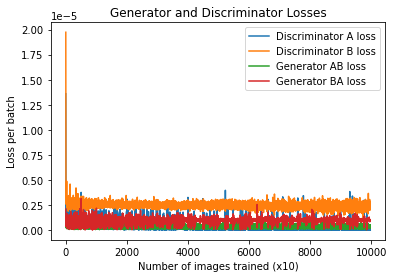

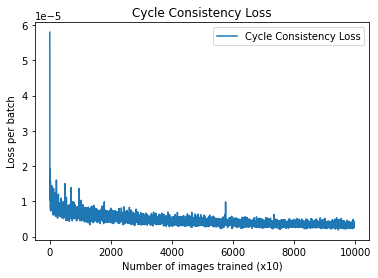

In [ ]:
# Plot generators and discriminators loss

loss_D_A_list = [i/10 for i in loss_D_A_list]
loss_D_B_list = [i/10 for i in loss_D_B_list]
loss_GAN_AB_list = [i/10 for i in loss_GAN_AB_list]
loss_GAN_BA_list = [i/10 for i in loss_GAN_BA_list]
loss_cycle_list = [i/10 for i in loss_cycle_list]

plt.figure(0)
plt.title("Generator and Discriminator Losses")
plt.plot(loss_D_A_list,label="Discriminator A loss")
plt.plot(loss_D_B_list,label="Discriminator B loss")
plt.plot(loss_GAN_AB_list,label="Generator AB loss")
plt.plot(loss_GAN_BA_list,label="Generator BA loss")
plt.xlabel("Number of images trained (x10)")
plt.ylabel("Loss per batch")
plt.legend()

plt.figure(1)
plt.title("Cycle Consistency Loss")
plt.plot(loss_cycle_list,label="Cycle Consistency Loss")
plt.xlabel("Number of images trained (x10)")
plt.ylabel("Loss per batch")
plt.legend()

plt.show()

# CycleGAN testing

In [ ]:
from torch.utils.data import DataLoader, TensorDataset
test_batch_size = 1
test_img_dir = './edges2shoes/val/'
test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
G_AB = torch.load('/content/models/G_AB.pt')
G_BA = torch.load('/content/models/G_BA.pt')
if cuda:
    G_AB = G_AB.to(device)
    G_BA = G_BA.to(device)

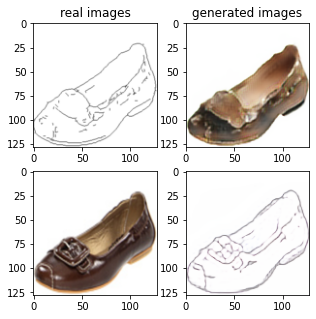

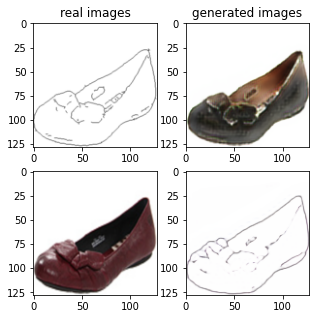

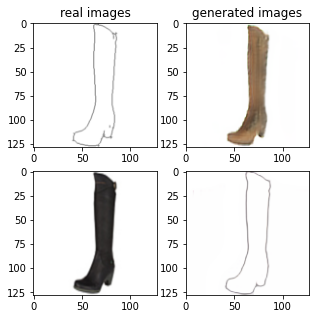

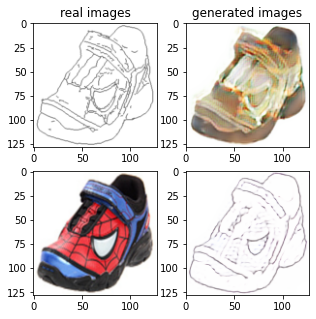

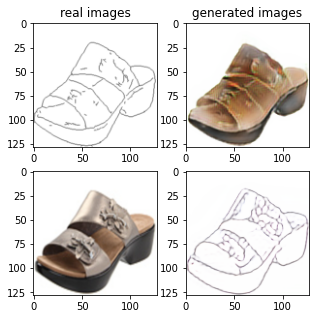

...

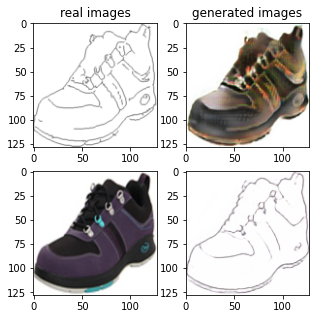

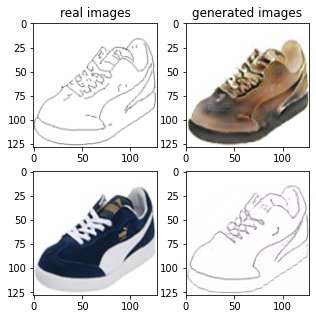

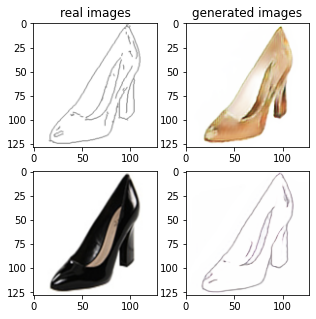

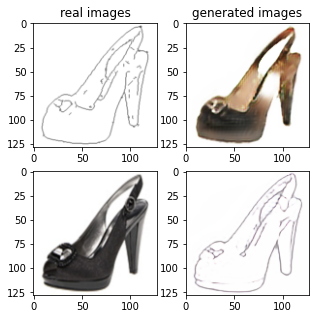

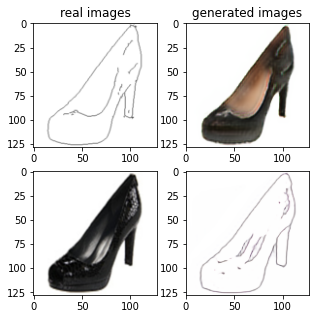

In [ ]:
G_AB.eval()
G_BA.eval()

################################
# Please visualize real_edge, fake_shoe, real_shoe, fake_edge in 2-by-2 grids:

for idx, data in enumerate(test_loader):
  ########## Process Inputs ##########
  edge_tensor, rgb_tensor = data
  edge_tensor, rgb_tensor = norm(edge_tensor).to(device), norm(rgb_tensor).to(device)
  real_A = edge_tensor; real_B = rgb_tensor;

  fake_A = G_BA(real_B)
  fake_B = G_AB(real_A)

  vis_fake_A = denorm(fake_A[0].detach()).cpu().data.numpy().astype(np.uint8)
  vis_fake_B = denorm(fake_B[0].detach()).cpu().data.numpy().astype(np.uint8)
  vis_real_B = denorm(real_B[0].detach()).cpu().data.numpy().astype(np.uint8)
  vis_real_A = denorm(real_A[0].detach()).cpu().data.numpy().astype(np.uint8)
  fig, axs = plt.subplots(2,2, figsize = (5,5))	
  
  axs[0,0].imshow(vis_real_A.transpose(1,2,0))
  axs[0,0].set_title('real images')
  axs[0,1].imshow(vis_fake_B.transpose(1,2,0))
  axs[0,1].set_title('generated images')
  axs[1,0].imshow(vis_real_B.transpose(1,2,0))
  axs[1,1].imshow(vis_fake_A.transpose(1,2,0))
  plt.show()

  if idx==40:
    break

################################        



# Quantitative Evaluation

## FID Score computation

First, we have to create 6 datasets:
- Domain A real set 1
- Domain A real set 2
- Domain A generate set

- Domain B real set 1
- Domain B real set 2
- Domain B generate set



Create folder to save images and create dataset.

In [ ]:
! mkdir real_A_1 real_A_2 gen_A
! mkdir real_B_1 real_B_2 gen_B

In [ ]:
# First create test data loader
from torch.utils.data import DataLoader, TensorDataset
from torchvision.utils import save_image
test_batch_size = 1
test_img_dir = './edges2shoes/val/'
test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

# indicate the device we will use
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load learnt Generator G_AB and G_BA
G_AB = torch.load('/content/models/G_AB.pt').to(device)
G_BA = torch.load('/content/models/G_BA.pt').to(device)

# the size of dataset, we want to evaluate on
evaluate_num = 100

# make the gen data set and folder
real_A_set_1 = []
real_A_set_2 = []
real_B_set_1 = []
real_B_set_2 = []

gen_set_A = []
gen_set_B = []

for idx, data in enumerate(test_loader, 0):
    real_A, real_B = data
    # plt.imshow(real_A.type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    real_A, real_B = norm(real_A).to(device), norm(real_B).to(device)
    # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    # print(real_A.shape)
    
    if idx < evaluate_num:
        fake_A = G_BA(real_B)
        fake_B = G_AB(real_A)
        real_A_set_1.append(denorm(real_A.detach()))
        real_B_set_1.append(denorm(real_B.detach()))
        gen_set_A.append(denorm(fake_A.detach()))
        gen_set_B.append(denorm(fake_B.detach()))
        
        # plt.imshow(data[0].type(torch.uint8).squeeze(0).permute(1,2,0))
        # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
        # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
        # plt.show()
        plt.imsave('./real_A_1/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./real_B_1/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./gen_A/gen_A' + str(idx) + '.png', denorm(fake_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./gen_B/gen_B' + str(idx) + '.png', denorm(fake_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).type(torch.uint8).squeeze(), './real_A_1/real_A' + str(idx) + '.png', normalize=False)

        # save_image(denorm(real_B).detach().squeeze(), './real_B_1/real_B' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_A).detach().squeeze(), './gen_A/gen_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_B).detach().squeeze(), './gen_B/gen_B' + str(idx) + '.png', normalize=False)
        # del real_A; del real_B; del fake_A; del fake_B

    elif evaluate_num <= idx < 2*evaluate_num:
        real_A_set_2.append(real_A.detach())
        real_B_set_2.append(real_B.detach())
        plt.imsave('./real_A_2/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./real_B_2/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).detach().squeeze(), './real_A_2/real_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(real_B).detach().squeeze(), './real_B_2/real_B' + str(idx) + '.png', normalize=False)
    
    if idx == 2*evaluate_num-1:
        break
# make 6 pytorch dataset
real_A_dataset_1 = TensorDataset(torch.cat(real_A_set_1))
real_A_dataset_2 = TensorDataset(torch.cat(real_A_set_2))
real_B_dataset_1 = TensorDataset(torch.cat(real_B_set_1))
real_B_dataset_2 = TensorDataset(torch.cat(real_B_set_2))
gen_dataset_A = TensorDataset(torch.cat(gen_set_A))
gen_dataset_B = TensorDataset(torch.cat(gen_set_B))



## Compute FID score

In [ ]:
! pip install pytorch-fid

  Created wheel for pytorch-fid: filename=pytorch_fid-0.1.1-cp36-none-any.whl size=10188 sha256=d39f915fd67caccb51d4f68f7fb2573abf20ea34ae48183aabc1d22cb7be64ca
  Stored in directory: /root/.cache/pip/wheels/b8/93/92/a6a8add9047b97dcb2470d2d1642450e6b76b5988e9744e3f0
Successfully built pytorch-fid


In [ ]:
print('computing FID score between real_edge_1 and real_edge_2')
! python -m pytorch_fid '/content/real_A_1' '/content/real_A_2' --gpu 0

print('computing FID score between real_edge_1 and gen_edge')
! python -m pytorch_fid '/content/real_A_1' '/content/gen_A' --gpu 0

print('computing FID score between real_shoe_1 and real_shoe_2')
! python -m pytorch_fid '/content/real_B_1' '/content/real_B_2' --gpu 0

print('computing FID score between real_shoe_1 and gen_shoe')
! python -m pytorch_fid '/content/real_B_1' '/content/gen_B' --gpu 0

computing FID score between real_edge_1 and real_edge_2
Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100% 91.2M/91.2M [00:02<00:00, 38.8MB/s]
100% 2/2 [00:00<00:00,  5.98it/s]
100% 2/2 [00:00<00:00,  6.13it/s]
FID:  49.873261355086726
computing FID score between real_edge_1 and gen_edge
100% 2/2 [00:00<00:00,  5.99it/s]
100% 2/2 [00:00<00:00,  5.86it/s]
FID:  87.97700642434071
computing FID score between real_shoe_1 and real_shoe_2
100% 2/2 [00:00<00:00,  5.62it/s]
100% 2/2 [00:00<00:00,  5.46it/s]
FID:  61.098021479954184
computing FID score between real_shoe_1 and gen_shoe
100% 2/2 [00:00<00:00,  5.58it/s]
100% 2/2 [00:00<00:00,  5.42it/s]
FID:  106.43929148424559


## Compute IS score

In [ ]:
from inception_score import inception_score
import warnings
warnings.filterwarnings("ignore")

print('IS score for real_edge_1 data set:')
print(inception_score(real_A_dataset_1, cuda=True, batch_size=64, resize=True, splits=1))
print('IS score for gen_edge data set:')
print(inception_score(gen_dataset_A, cuda=True, batch_size=64, resize=True, splits=1))


print('IS score for real_shoe_1:')
print(inception_score(real_B_dataset_1, cuda=True, batch_size=64, resize=True, splits=1))
print('IS score for gen_shoe data set:')
print(inception_score(gen_dataset_B, cuda=True, batch_size=64, resize=True, splits=1))

IS score for real_edge_1 data set:


Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-1a9a5a14.pth



1.0015565562374376
IS score for gen_edge data set:
1.001722566178994
IS score for real_shoe_1:
3.6340972690777513
IS score for gen_shoe data set:
2.9792056067653756
